In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

#Load Given Data

In [ ]:
# uploading necessary files

from google.colab import files
file = files.upload()

In [ ]:
Well_data = pd.read_csv("spe_africa_dseats_datathon_2025_wells_dataset.csv")
reservoir_data = pd.read_csv("reservoir_info.csv")
classification_param = pd.read_csv("classification_parameters.csv")
samplesub = pd.read_csv("Innovisors_DSEATS_Africa_2025_Classification.csv")

In [ ]:
#Alternative to load files if filepath is present
filepath = "/content/drive/MyDrive/Colab Notebooks/DSEATS2025"
Well_data = pd.read_csv(filepath + "/spe_africa_dseats_datathon_2025_wells_dataset.csv")
reservoir_data = pd.read_csv(filepath + "/reservoir_info.csv")
classification_param = pd.read_csv(filepath + "/classification_parameters.csv")
samplesub = pd.read_csv(filepath + "/Innovisors_DSEATS_Africa_2025_Classification.csv")

In [ ]:
print(Well_data.info())
print(Well_data.shape)
Well_data.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7955 entries, 0 to 7954
Data columns (total 13 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   PROD_DATE                             7955 non-null   object 
 1   WELL_NAME                             7955 non-null   object 
 2   ON_STREAM_HRS                         7955 non-null   float64
 3   BOTTOMHOLE_FLOWING_PRESSURE (PSI)     7955 non-null   object 
 4   DOWNHOLE_TEMPERATURE (deg F)          7955 non-null   float64
 5   ANNULUS_PRESS (PSI)                   7955 non-null   object 
 6   CHOKE_SIZE (%)                        7955 non-null   float64
 7   WELL_HEAD_PRESSURE (PSI)              7955 non-null   object 
 8   WELL_HEAD_TEMPERATURE (deg F)         7955 non-null   float64
 9   CUMULATIVE_OIL_PROD (STB)             7955 non-null   object 
 10  CUMULATIVE_FORMATION_GAS_PROD (MSCF)  7955 non-null   object 
 11  CUMULATIVE_TOTAL_

,PROD_DATE,WELL_NAME,ON_STREAM_HRS,BOTTOMHOLE_FLOWING_PRESSURE (PSI),DOWNHOLE_TEMPERATURE (deg F),ANNULUS_PRESS (PSI),CHOKE_SIZE (%),WELL_HEAD_PRESSURE (PSI),WELL_HEAD_TEMPERATURE (deg F),CUMULATIVE_OIL_PROD (STB),CUMULATIVE_FORMATION_GAS_PROD (MSCF),CUMULATIVE_TOTAL_GAS_PROD (MSCF),CUMULATIVE_WATER_PROD (BBL)
0,15-Feb-14,Well_#1,0.0,"4,050",189.866,0,1.17951,482.46,50.864,0,0,0,0
1,16-Feb-14,Well_#1,0.0,"3,961",189.945,0,2.99440,328.601,47.668,0,0,0,0
2,17-Feb-14,Well_#1,0.0,"3,961",190.004,0,1.90349,387.218,48.962,0,0,0,0
3,18-Feb-14,Well_#1,0.0,"3,964",190.020,0,0.00000,308.98,46.636,0,0,0,0
4,19-Feb-14,Well_#1,0.0,"3,965",190.107,0,30.20760,196.057,47.297,0,0,0,0


##Convert String numerical features to Float datatype(Welldata)

In [ ]:
for col in Well_data.drop(columns=["PROD_DATE","WELL_NAME",]).select_dtypes(include=object):
    Well_data[col] = Well_data[col].str.replace(',', '').astype(float)
Well_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7955 entries, 0 to 7954
Data columns (total 13 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   PROD_DATE                             7955 non-null   object 
 1   WELL_NAME                             7955 non-null   object 
 2   ON_STREAM_HRS                         7955 non-null   float64
 3   BOTTOMHOLE_FLOWING_PRESSURE (PSI)     7955 non-null   float64
 4   DOWNHOLE_TEMPERATURE (deg F)          7955 non-null   float64
 5   ANNULUS_PRESS (PSI)                   7955 non-null   float64
 6   CHOKE_SIZE (%)                        7955 non-null   float64
 7   WELL_HEAD_PRESSURE (PSI)              7955 non-null   float64
 8   WELL_HEAD_TEMPERATURE (deg F)         7955 non-null   float64
 9   CUMULATIVE_OIL_PROD (STB)             7955 non-null   float64
 10  CUMULATIVE_FORMATION_GAS_PROD (MSCF)  7955 non-null   float64
 11  CUMULATIVE_TOTAL_

In [ ]:
#Convert Prod. Date to Date time
Well_data['PROD_DATE'] = pd.to_datetime(Well_data['PROD_DATE'])
Well_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7955 entries, 0 to 7954
Data columns (total 13 columns):
 #   Column                                Non-Null Count  Dtype         
---  ------                                --------------  -----         
 0   PROD_DATE                             7955 non-null   datetime64[ns]
 1   WELL_NAME                             7955 non-null   object        
 2   ON_STREAM_HRS                         7955 non-null   float64       
 3   BOTTOMHOLE_FLOWING_PRESSURE (PSI)     7955 non-null   float64       
 4   DOWNHOLE_TEMPERATURE (deg F)          7955 non-null   float64       
 5   ANNULUS_PRESS (PSI)                   7955 non-null   float64       
 6   CHOKE_SIZE (%)                        7955 non-null   float64       
 7   WELL_HEAD_PRESSURE (PSI)              7955 non-null   float64       
 8   WELL_HEAD_TEMPERATURE (deg F)         7955 non-null   float64       
 9   CUMULATIVE_OIL_PROD (STB)             7955 non-null   float64       
 10  

In [ ]:
print(Well_data.shape)
Well_data.head()

(7955, 13)


,PROD_DATE,WELL_NAME,ON_STREAM_HRS,BOTTOMHOLE_FLOWING_PRESSURE (PSI),DOWNHOLE_TEMPERATURE (deg F),ANNULUS_PRESS (PSI),CHOKE_SIZE (%),WELL_HEAD_PRESSURE (PSI),WELL_HEAD_TEMPERATURE (deg F),CUMULATIVE_OIL_PROD (STB),CUMULATIVE_FORMATION_GAS_PROD (MSCF),CUMULATIVE_TOTAL_GAS_PROD (MSCF),CUMULATIVE_WATER_PROD (BBL)
0,2014-02-15,Well_#1,0.0,4050.0,189.866,0.0,1.17951,482.460,50.864,0.0,0.0,0.0,0.0
1,2014-02-16,Well_#1,0.0,3961.0,189.945,0.0,2.99440,328.601,47.668,0.0,0.0,0.0,0.0
2,2014-02-17,Well_#1,0.0,3961.0,190.004,0.0,1.90349,387.218,48.962,0.0,0.0,0.0,0.0
3,2014-02-18,Well_#1,0.0,3964.0,190.020,0.0,0.00000,308.980,46.636,0.0,0.0,0.0,0.0
4,2014-02-19,Well_#1,0.0,3965.0,190.107,0.0,30.20760,196.057,47.297,0.0,0.0,0.0,0.0


In [ ]:
print(reservoir_data.shape)
print(reservoir_data.info())
reservoir_data.head()

(5, 6)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5 entries, 0 to 4
Data columns (total 6 columns):
 #   Column                                    Non-Null Count  Dtype  
---  ------                                    --------------  -----  
 0   Reservoir Name                            5 non-null      object 
 1   Initial Reservoir Pressure (PSI)          5 non-null      object 
 2   Bubble Point Pressure (PSI)               5 non-null      object 
 3   Current Average Reservoir Pressure (PSI)  5 non-null      object 
 4   Solution Gas-Oil-Ratio (SCF/BBL)          5 non-null      object 
 5   Formation Volume Factor (RB/STB)          5 non-null      float64
dtypes: float64(1), object(5)
memory usage: 372.0+ bytes
None


,Reservoir Name,Initial Reservoir Pressure (PSI),Bubble Point Pressure (PSI),Current Average Reservoir Pressure (PSI),Solution Gas-Oil-Ratio (SCF/BBL),Formation Volume Factor (RB/STB)
0,ACHI,"3,500","3,300","2,700",800,1.20
1,KEMA,"4,200","4,000","3,900",600,1.45
2,MAKO,"3,500","3,500","3,000",500,1.15
3,DEPU,"2,800","2,800","2,400","1,200",1.37
4,JANI,"4,500","4,300","4,200","1,000",1.30


##Convert String numerical features to Float datatype(Reservoir Data)

In [ ]:
for col in reservoir_data.drop(columns="Reservoir Name").select_dtypes(include=object):
    reservoir_data[col] = reservoir_data[col].str.replace(',', '').astype(float)
reservoir_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5 entries, 0 to 4
Data columns (total 6 columns):
 #   Column                                    Non-Null Count  Dtype  
---  ------                                    --------------  -----  
 0   Reservoir Name                            5 non-null      object 
 1   Initial Reservoir Pressure (PSI)          5 non-null      float64
 2   Bubble Point Pressure (PSI)               5 non-null      float64
 3   Current Average Reservoir Pressure (PSI)  5 non-null      float64
 4   Solution Gas-Oil-Ratio (SCF/BBL)          5 non-null      float64
 5   Formation Volume Factor (RB/STB)          5 non-null      float64
dtypes: float64(5), object(1)
memory usage: 372.0+ bytes


In [ ]:
print(classification_param.shape)
print(classification_param.info())
classification_param.head()

(5, 7)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5 entries, 0 to 4
Data columns (total 7 columns):
 #   Column                        Non-Null Count  Dtype 
---  ------                        --------------  ----- 
 0   Reservoir Name                5 non-null      object
 1   Reservoir Type                2 non-null      object
 2   Well Type                     2 non-null      object
 3   Production Type               2 non-null      object
 4   Formation GOR Trend           3 non-null      object
 5   Watercut Trend                4 non-null      object
 6   Oil Productivity Index Trend  4 non-null      object
dtypes: object(7)
memory usage: 412.0+ bytes
None


,Reservoir Name,Reservoir Type,Well Type,Production Type,Formation GOR Trend,Watercut Trend,Oil Productivity Index Trend
0,ACHI,Saturated,NF,Steady,aSolGOR,Flat,Flat
1,KEMA,Undersat,GL,Unsteady,bSolGOR,Incr,Incr
2,MAKO,NaN,NaN,NaN,Combo,Decr,Decr
3,DEPU,NaN,NaN,NaN,NaN,Combo,Combo
4,JANI,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
samplesub.head()

,Well,Reservoir Name,Reservoir Type,Well Type,Production Type,Formation GOR Trend,Watercut Trend,Oil Productivity Index
0,1,KEMA,Saturated,GL,Unsteady,aSolGOR,Flat,Decr
1,2,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,3,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,4,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,5,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
Well_names = Well_data['WELL_NAME'].unique()
Well_names

array(['Well_#1', 'Well_#2', 'Well_#3', 'Well_#4', 'Well_#5', 'Well_#6',
       'Well_#7', 'Well_#8', 'Well_#9', 'Well_#10', 'Well_#11',
       'Well_#12', 'Well_#13', 'Well_#14', 'Well_#15', 'Well_#16',
       'Well_#17', 'Well_#18', 'Well_#19', 'Well_#20'], dtype=object)

#Exploratory Data Analysis(EDA)

##BOTTOMHOLE_FLOWING_PRESSURE (PSI)

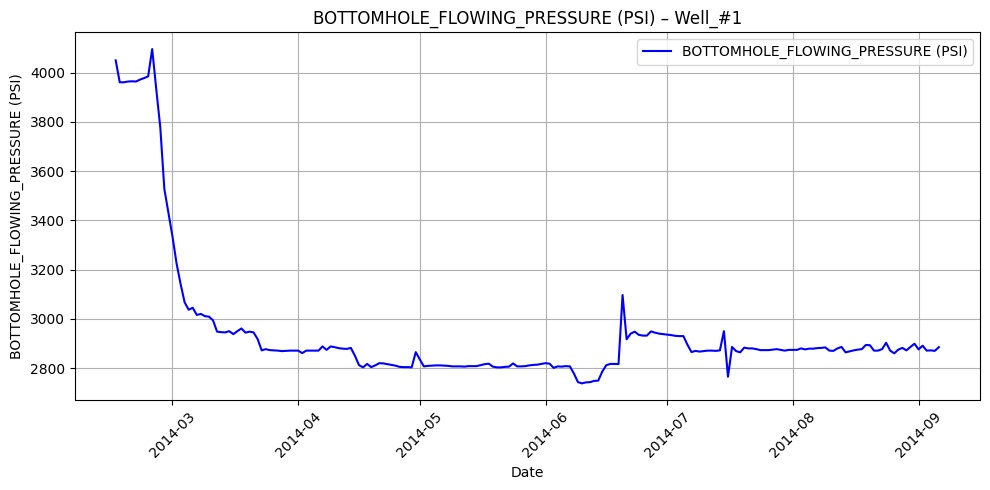

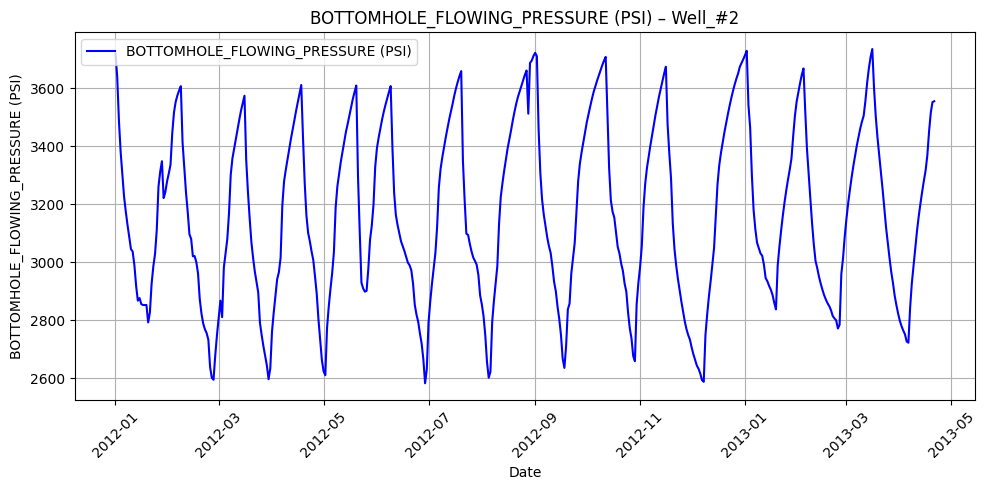

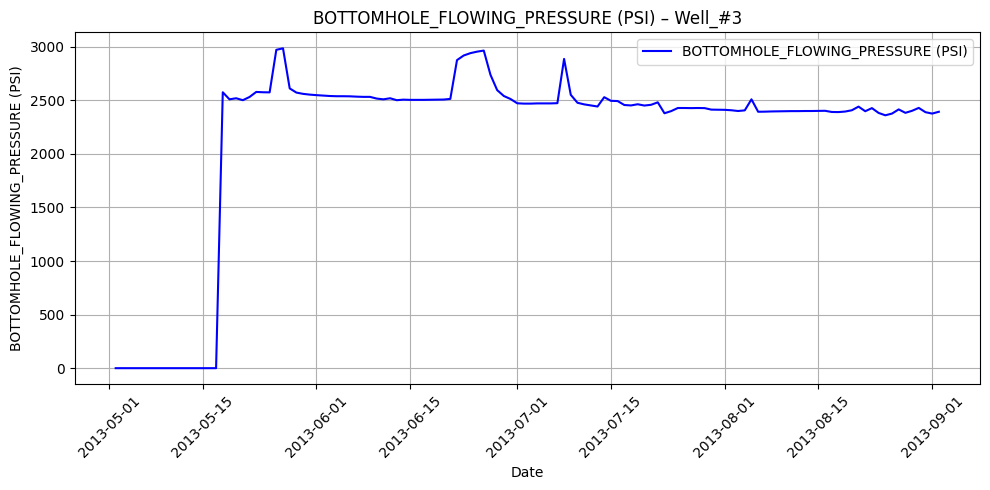

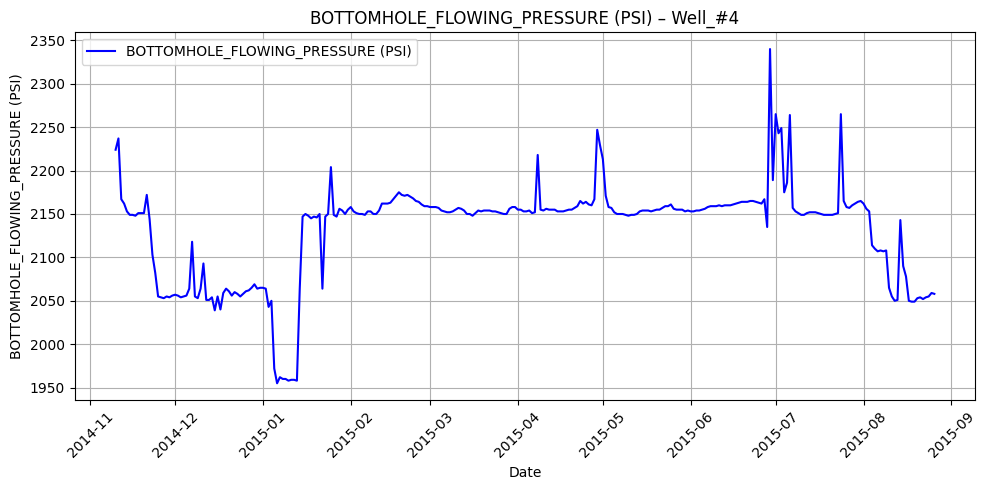

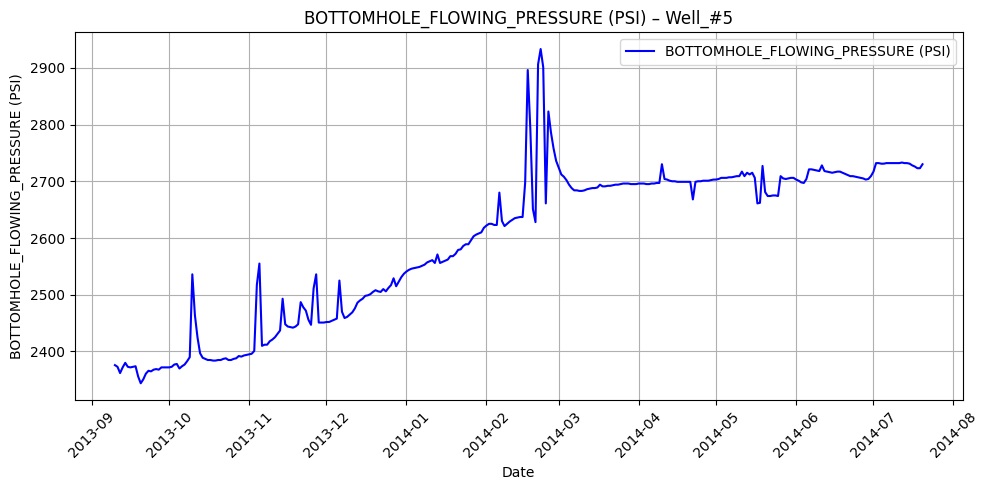

...

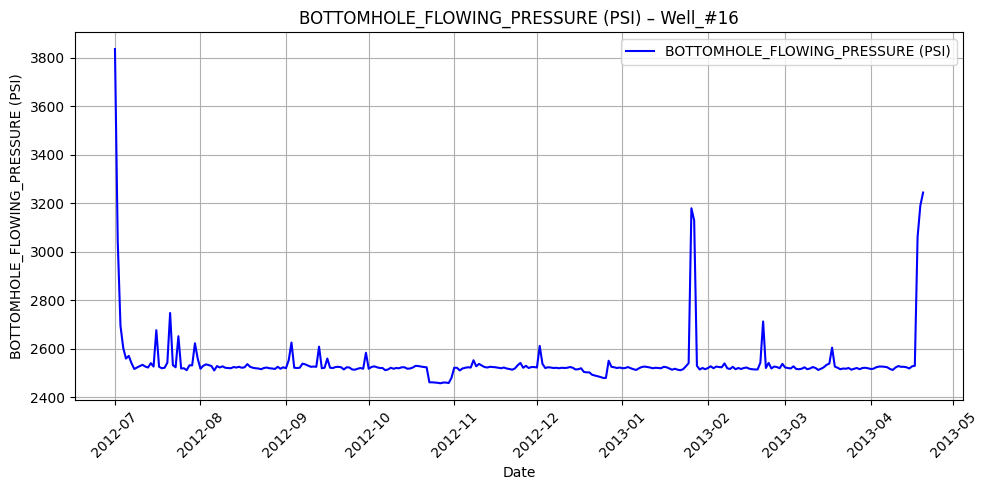

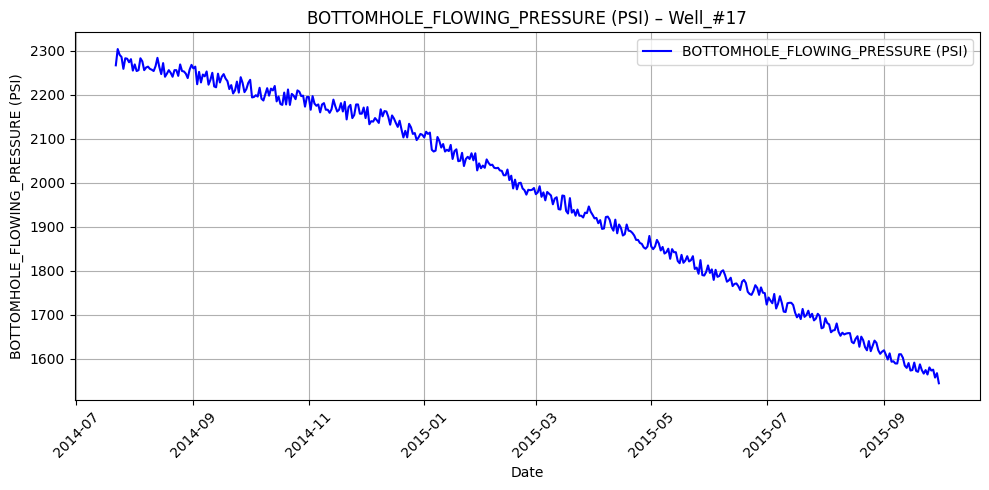

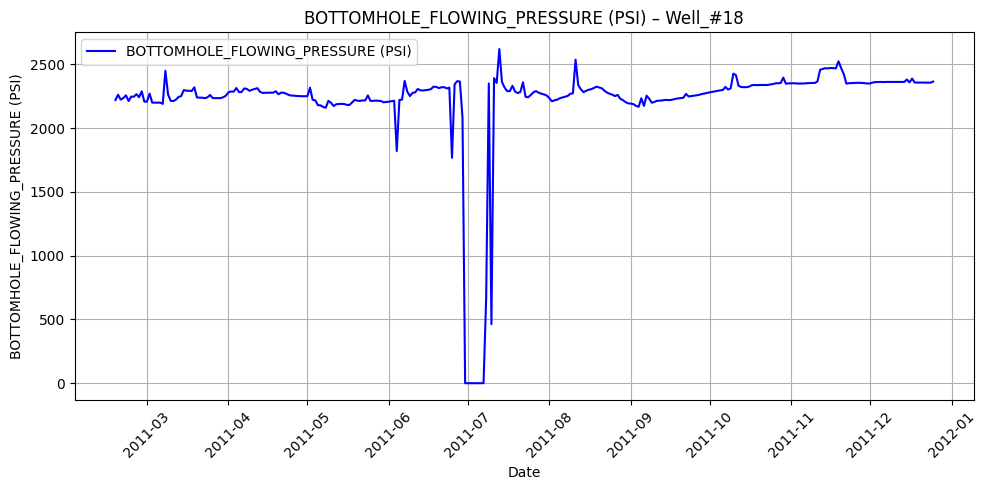

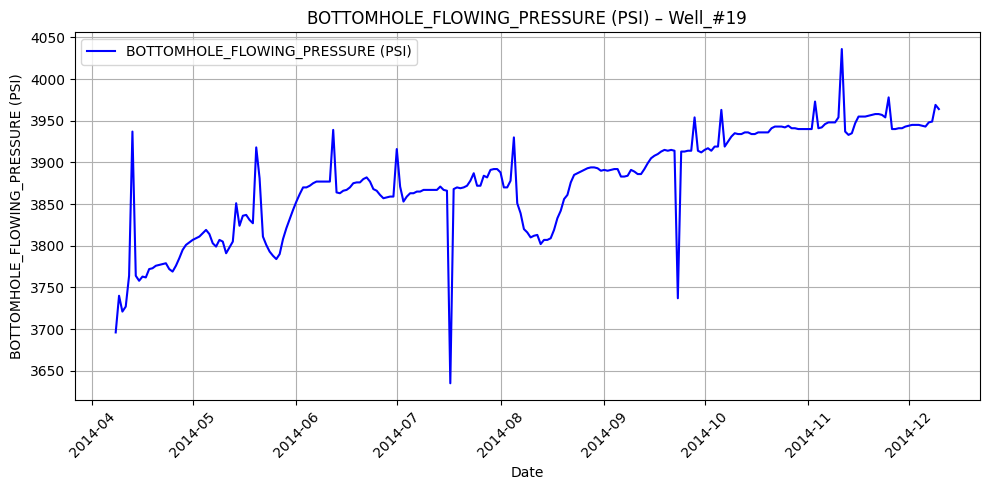

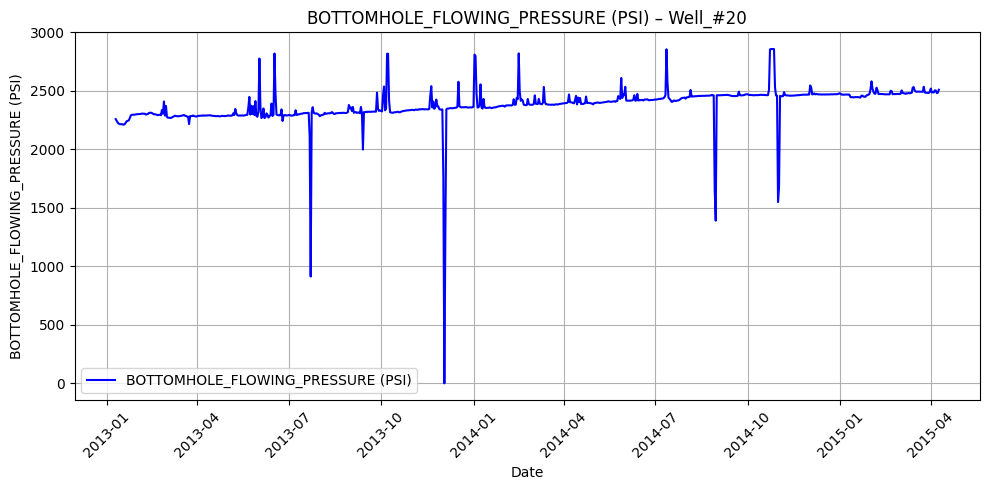

In [ ]:
# Making a Plot for a sample well
for name in Well_names:
  sample_well_name = name  # Change this to other wells in a loop if needed
  sample_well_data = Well_data[Well_data['WELL_NAME'] == sample_well_name].copy()

  plt.figure(figsize=(10, 5))
  plt.plot(sample_well_data['PROD_DATE'], sample_well_data['BOTTOMHOLE_FLOWING_PRESSURE (PSI)'], label='BOTTOMHOLE_FLOWING_PRESSURE (PSI)', color='blue')
  plt.title(f"BOTTOMHOLE_FLOWING_PRESSURE (PSI) – {sample_well_name}")
  plt.xlabel("Date")
  plt.ylabel("BOTTOMHOLE_FLOWING_PRESSURE (PSI)")
  plt.legend()
  plt.grid(True)
  plt.xticks(rotation=45)
  plt.tight_layout()
  plt.show()

##CUMULATIVE_OIL_PROD (STB) Plot

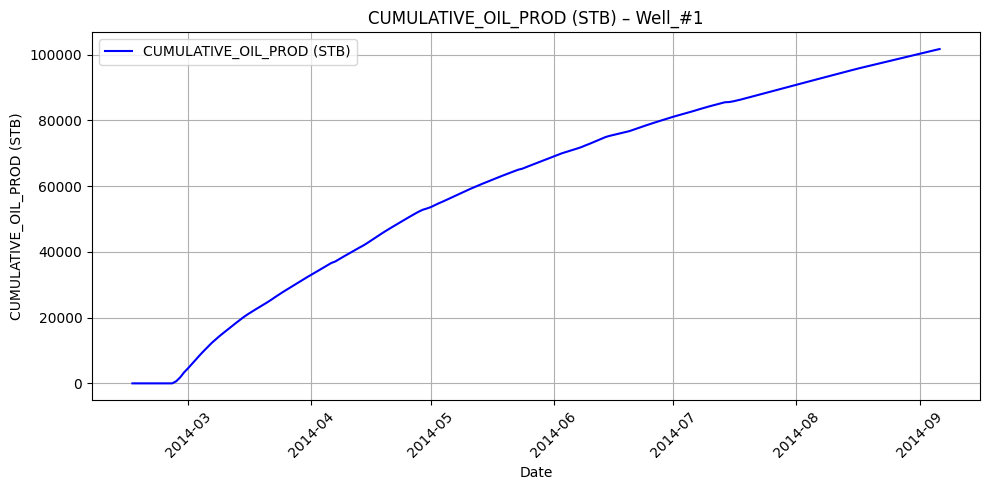

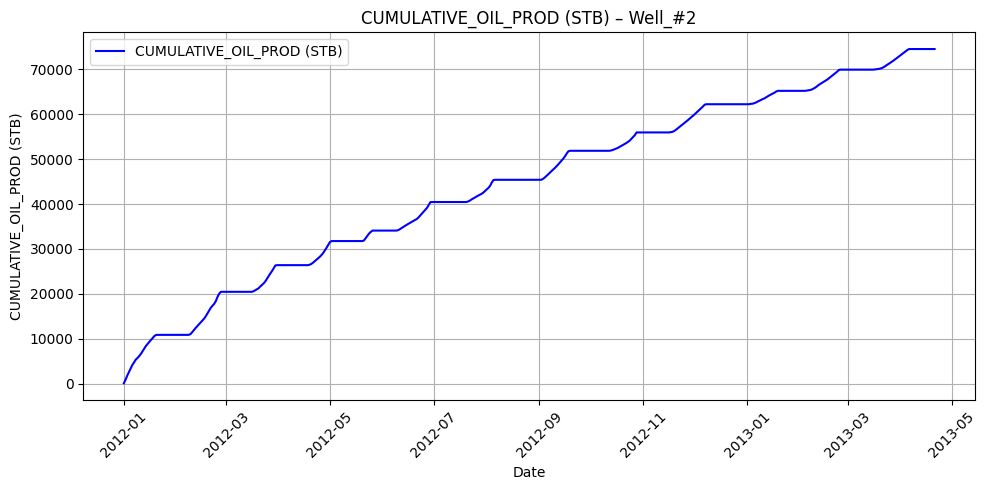

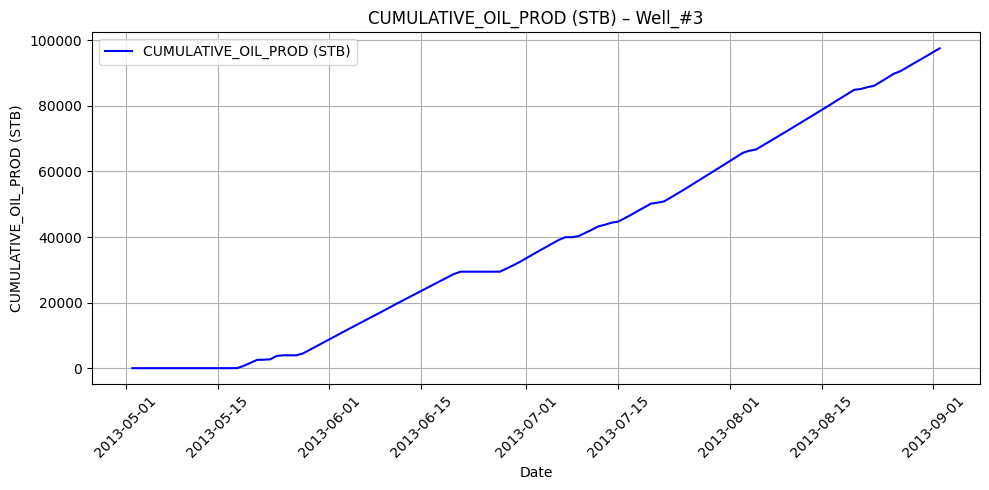

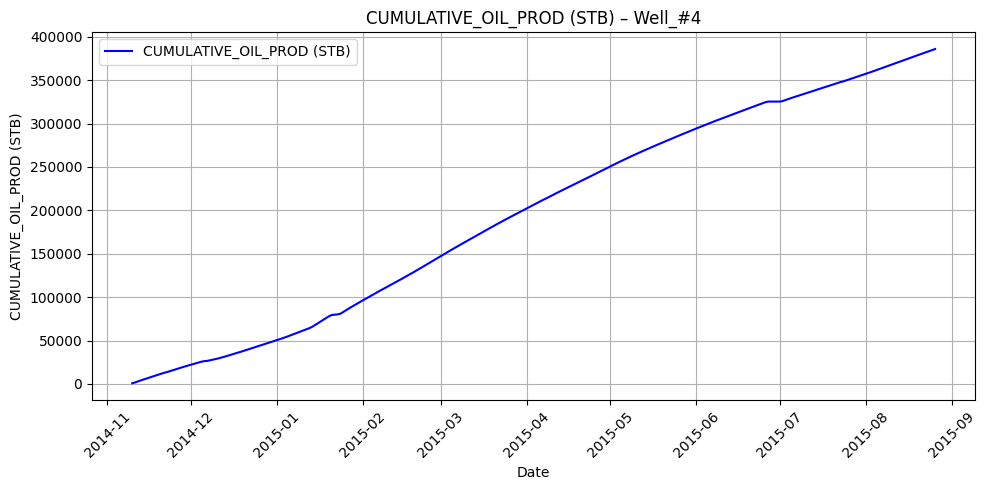

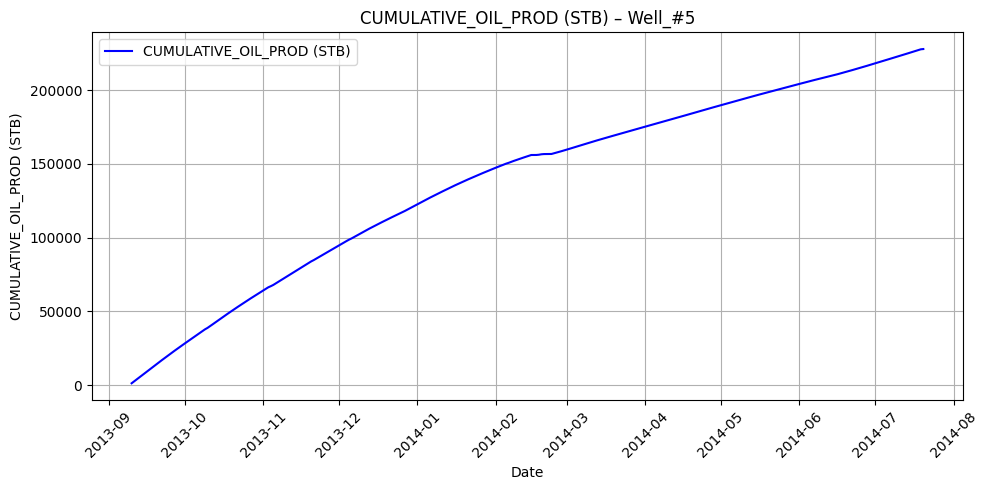

...

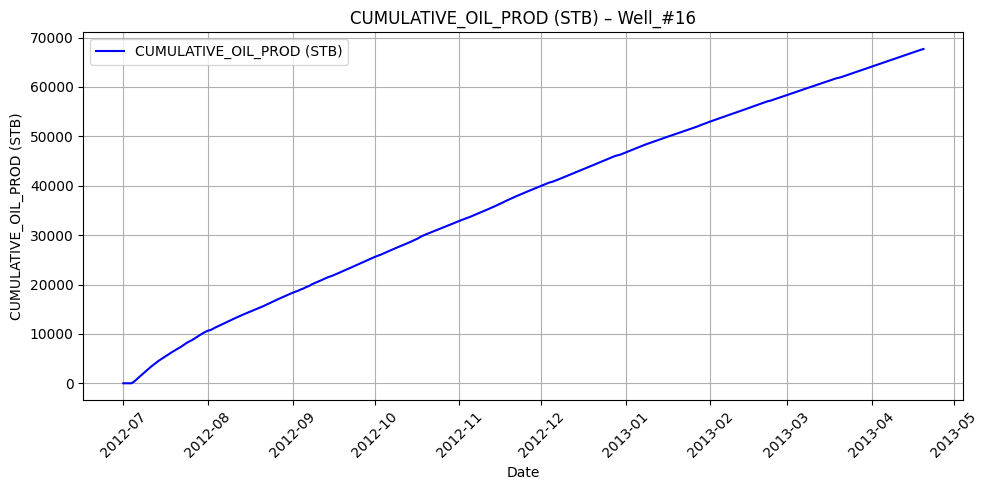

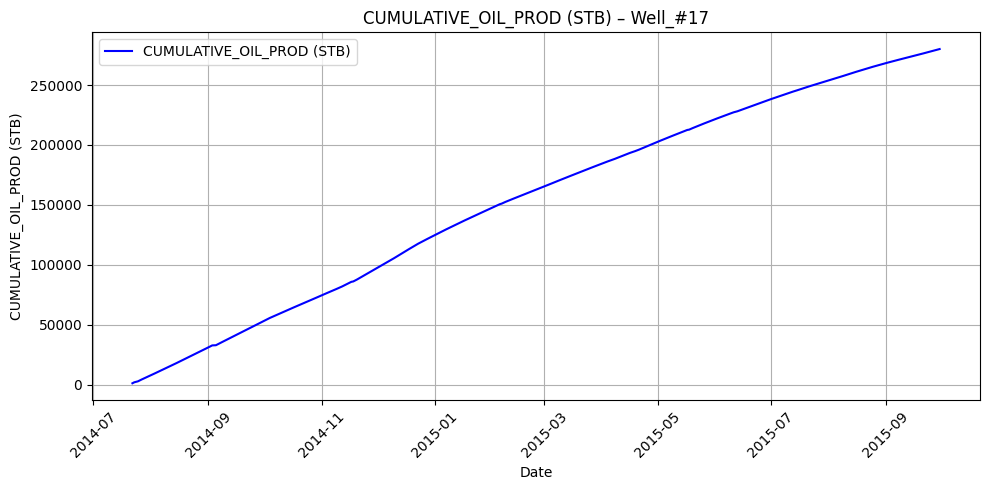

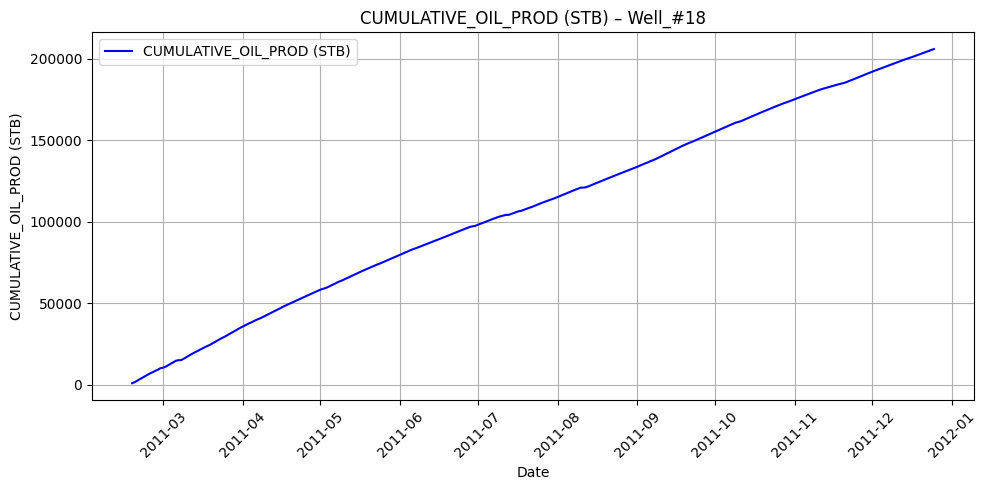

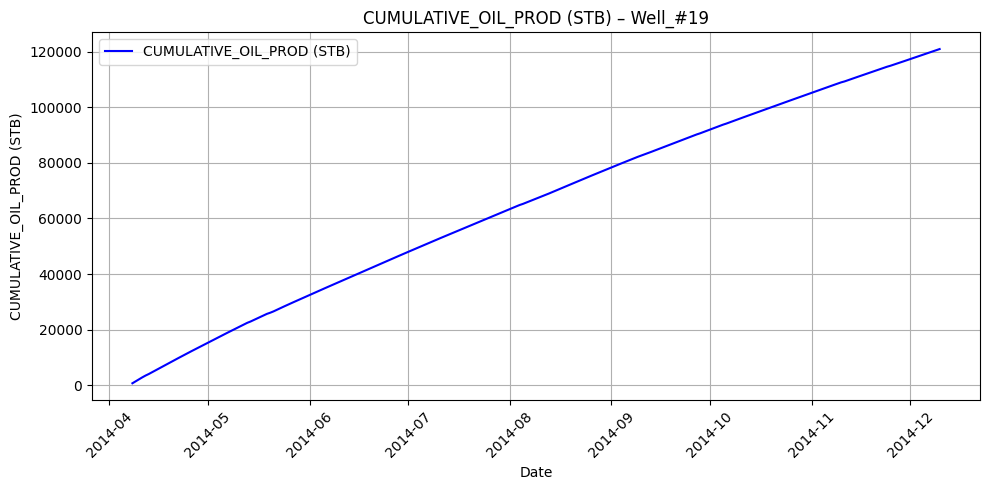

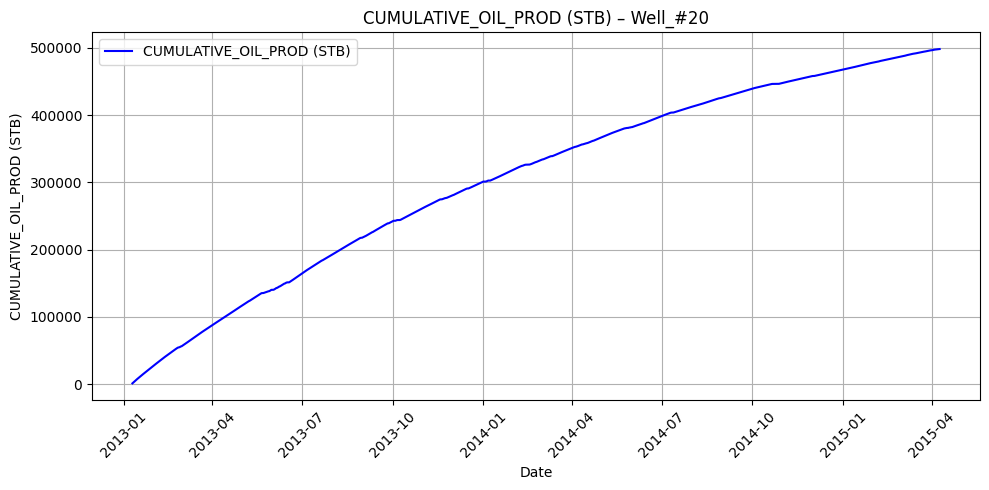

In [ ]:
# Making a Plot for a sample well
for name in Well_names:
  sample_well_name = name  # Change this to other wells in a loop if needed
  sample_well_data = Well_data[Well_data['WELL_NAME'] == sample_well_name].copy()

  plt.figure(figsize=(10, 5))
  plt.plot(sample_well_data['PROD_DATE'], sample_well_data['CUMULATIVE_OIL_PROD (STB)'], label='CUMULATIVE_OIL_PROD (STB)', color='blue')
  plt.title(f"CUMULATIVE_OIL_PROD (STB) – {sample_well_name}")
  plt.xlabel("Date")
  plt.ylabel("CUMULATIVE_OIL_PROD (STB)")
  plt.legend()
  plt.grid(True)
  plt.xticks(rotation=45)
  plt.tight_layout()
  plt.show()

##CUMULATIVE_TOTAL_GAS_PROD (MSCF) Plot

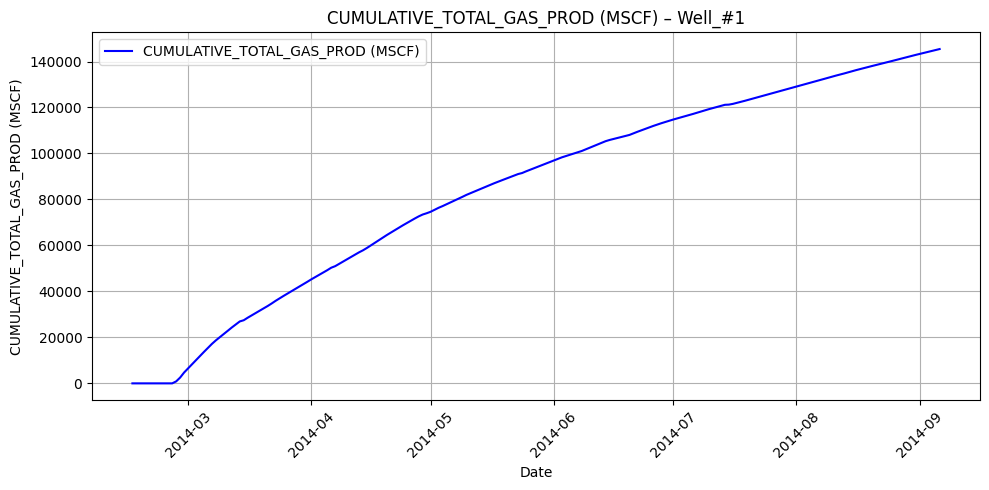

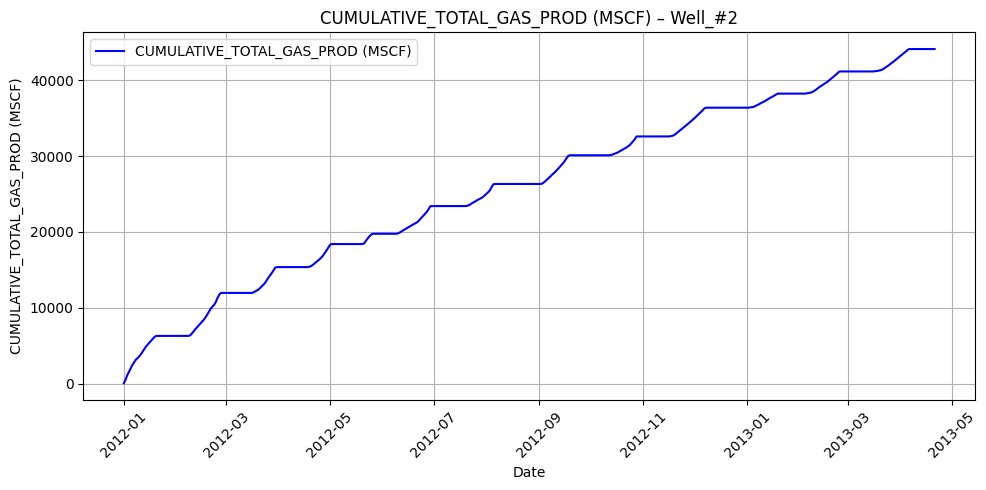

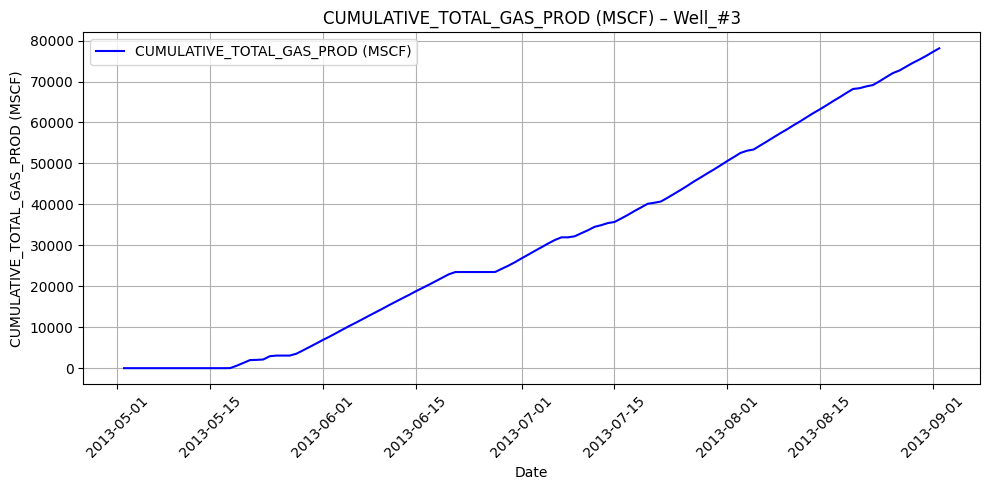

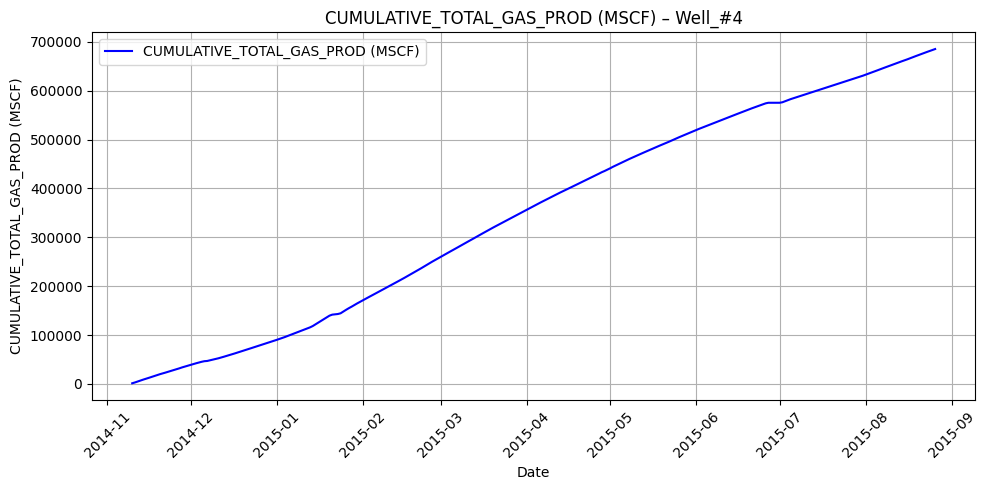

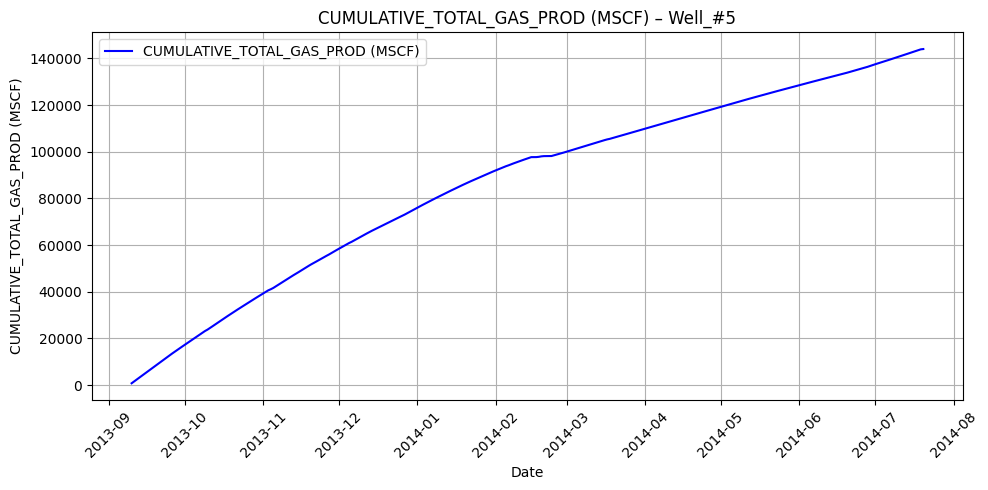

...

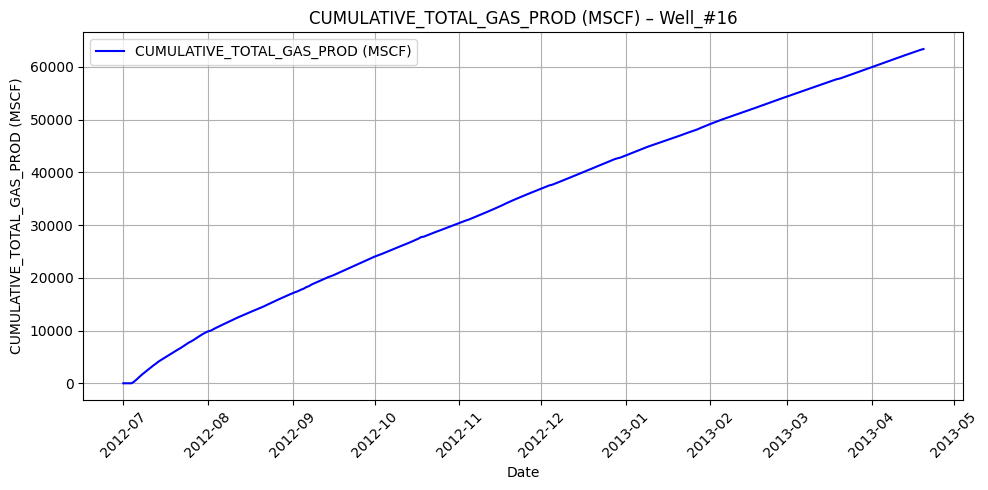

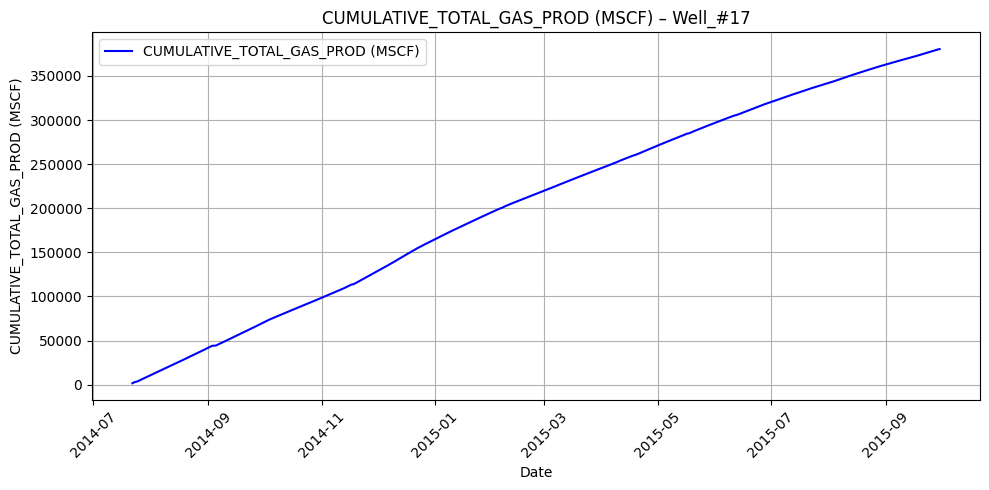

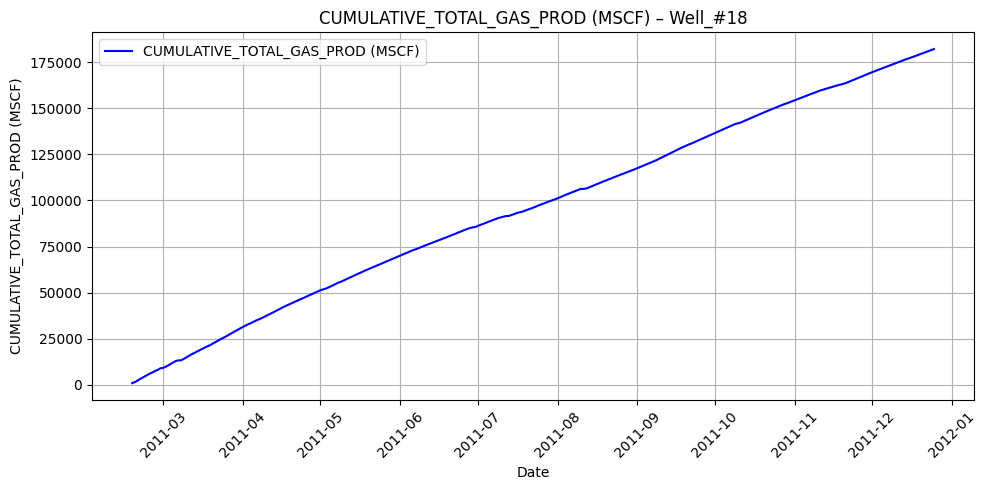

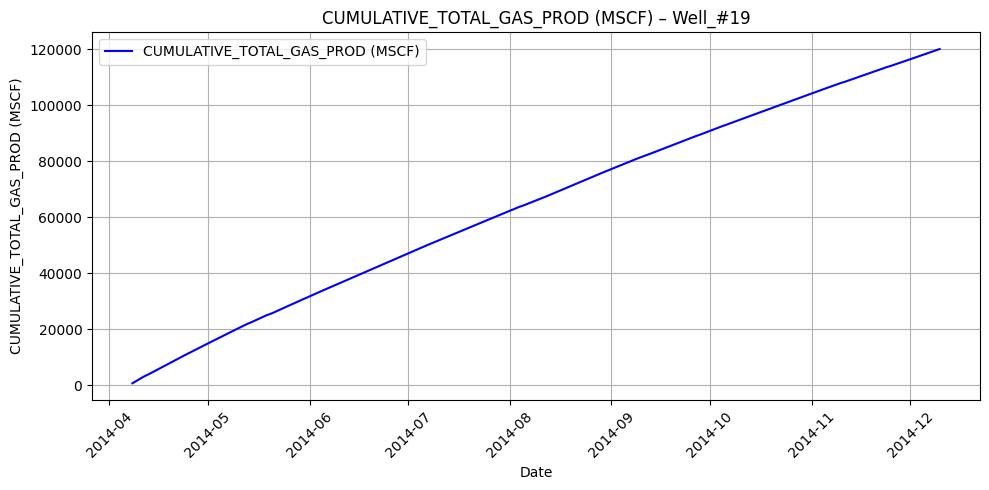

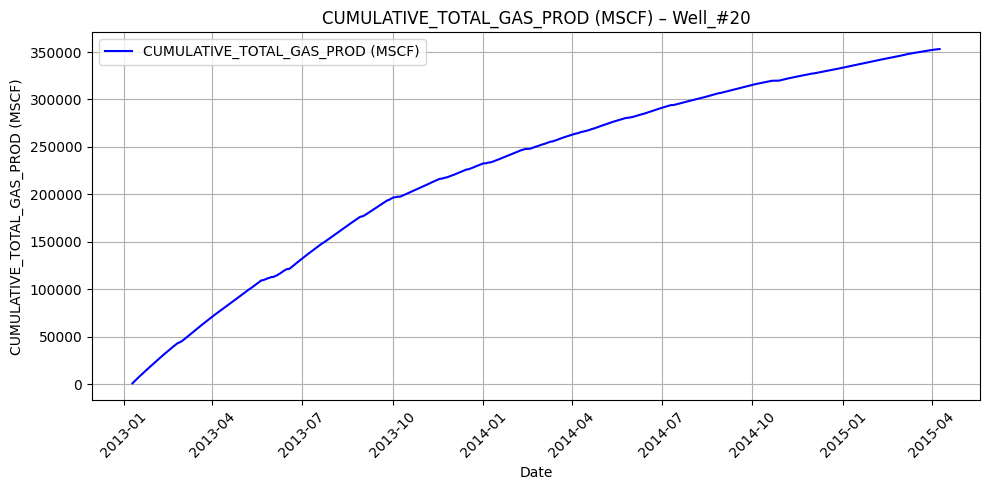

In [ ]:
# Making a Plot for a sample well
for name in Well_names:
  sample_well_name = name  # Change this to other wells in a loop if needed
  sample_well_data = Well_data[Well_data['WELL_NAME'] == sample_well_name].copy()

  plt.figure(figsize=(10, 5))
  plt.plot(sample_well_data['PROD_DATE'], sample_well_data['CUMULATIVE_TOTAL_GAS_PROD (MSCF)'], label='CUMULATIVE_TOTAL_GAS_PROD (MSCF)', color='blue')
  plt.title(f"CUMULATIVE_TOTAL_GAS_PROD (MSCF) – {sample_well_name}")
  plt.xlabel("Date")
  plt.ylabel("CUMULATIVE_TOTAL_GAS_PROD (MSCF)")
  plt.legend()
  plt.grid(True)
  plt.xticks(rotation=45)
  plt.tight_layout()
  plt.show()

##CUMULATIVE_WATER_PROD (BBL)

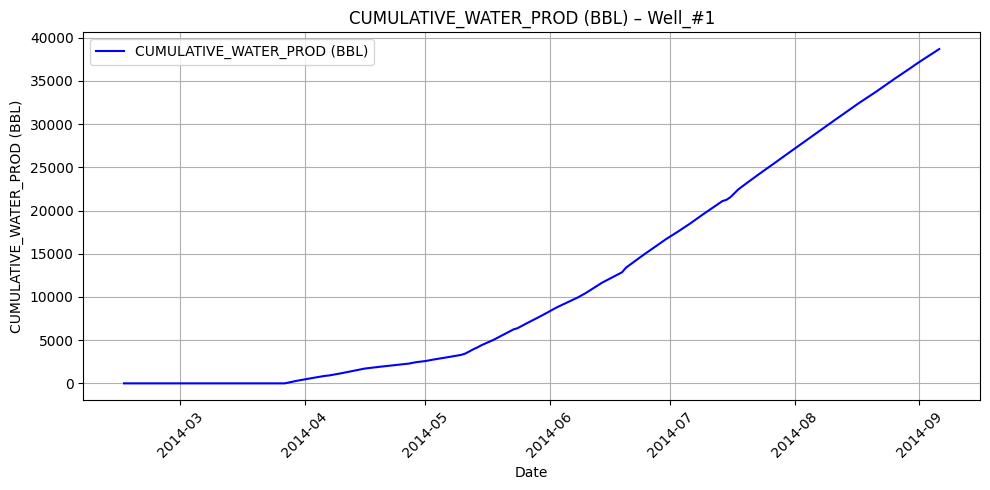

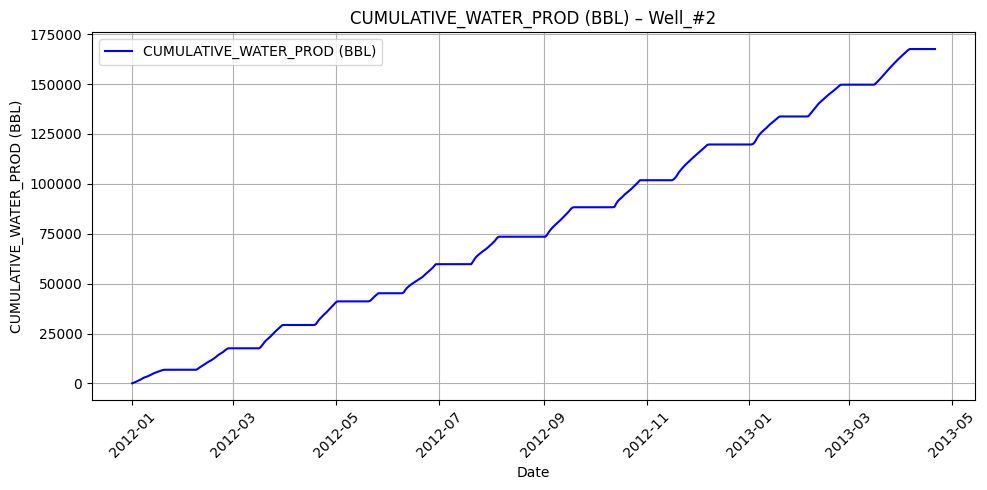

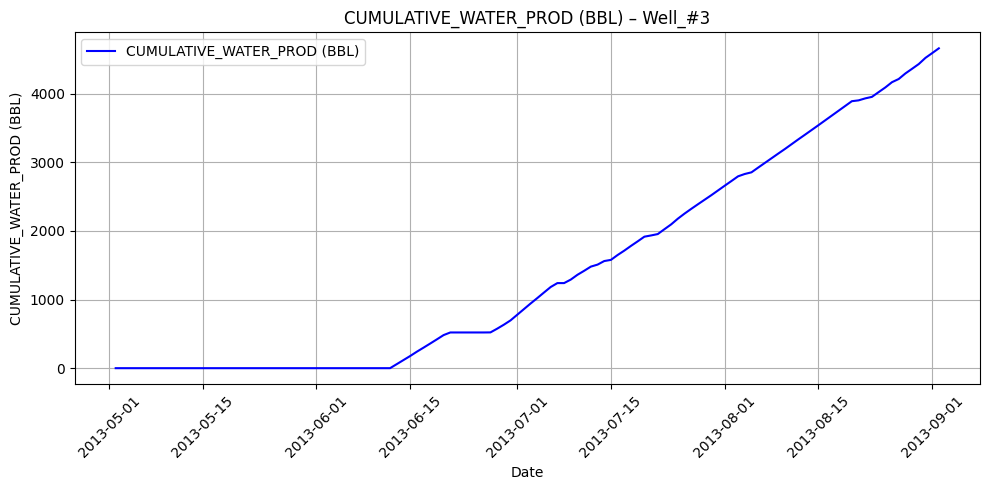

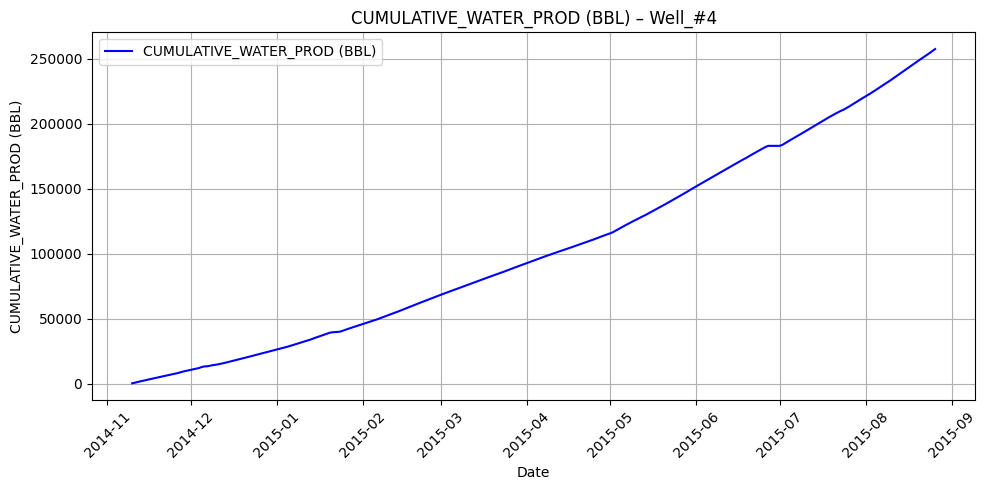

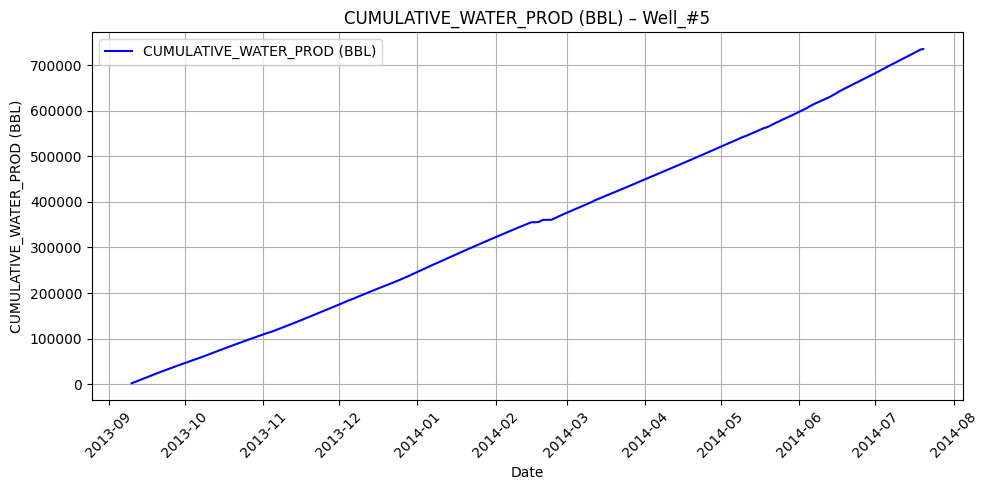

...

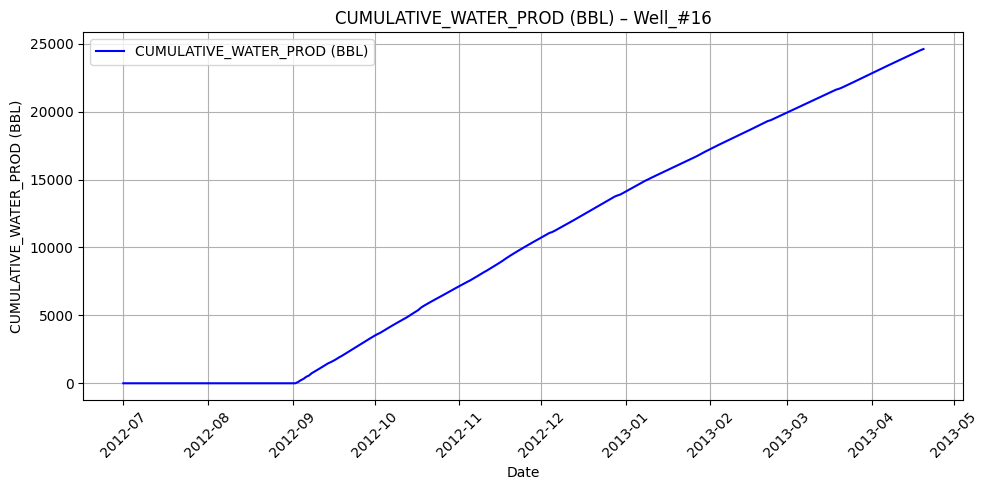

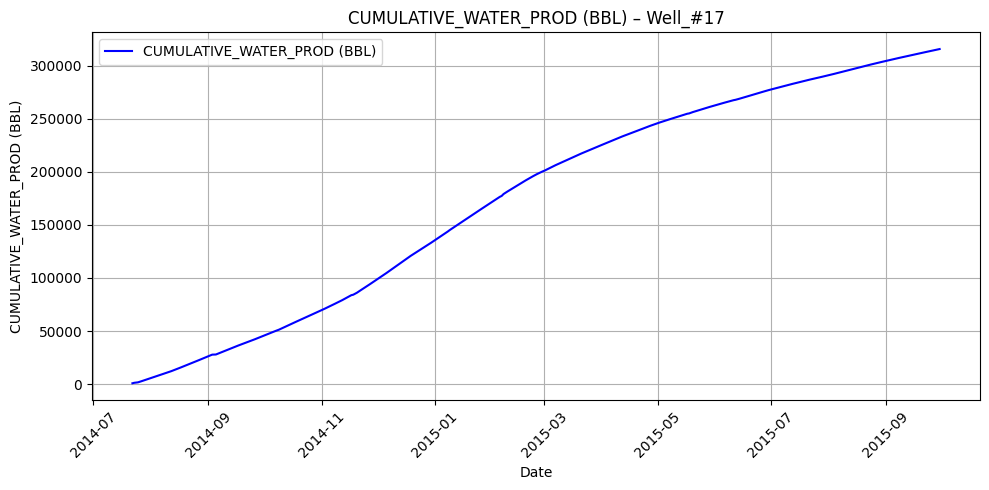

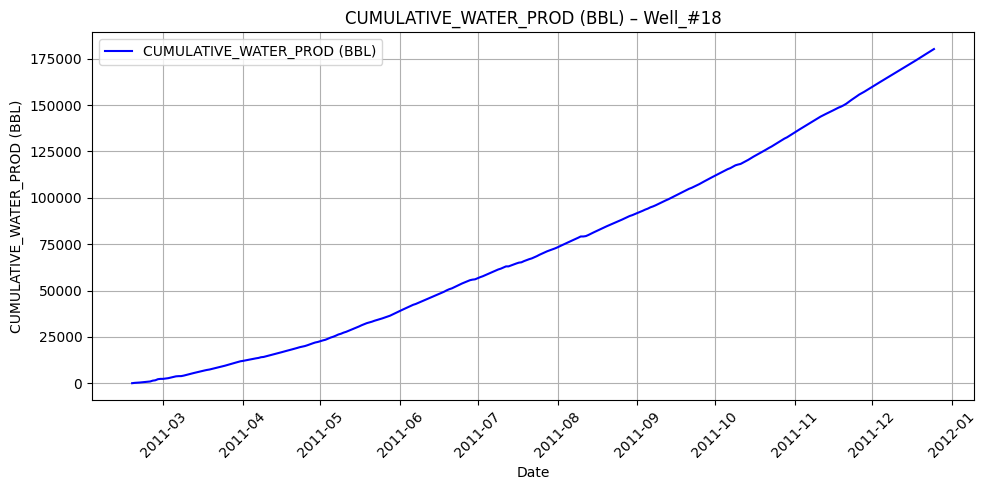

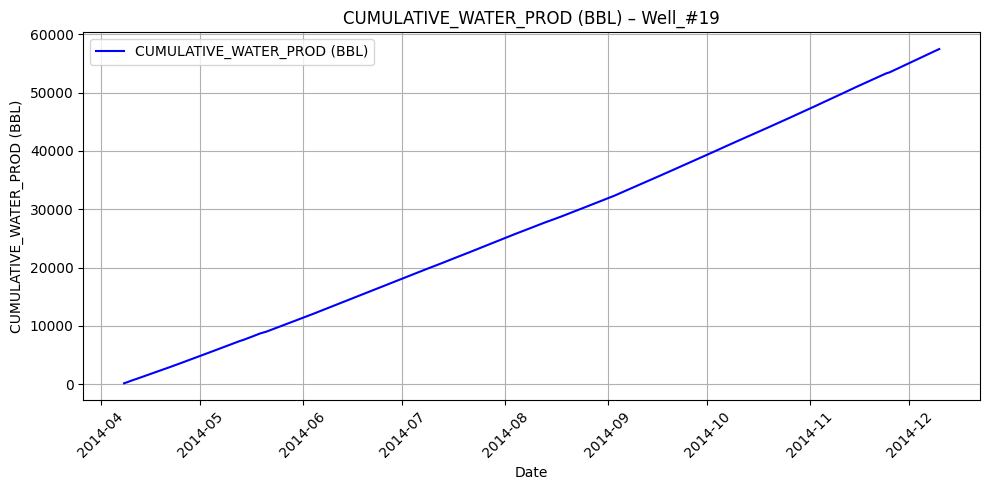

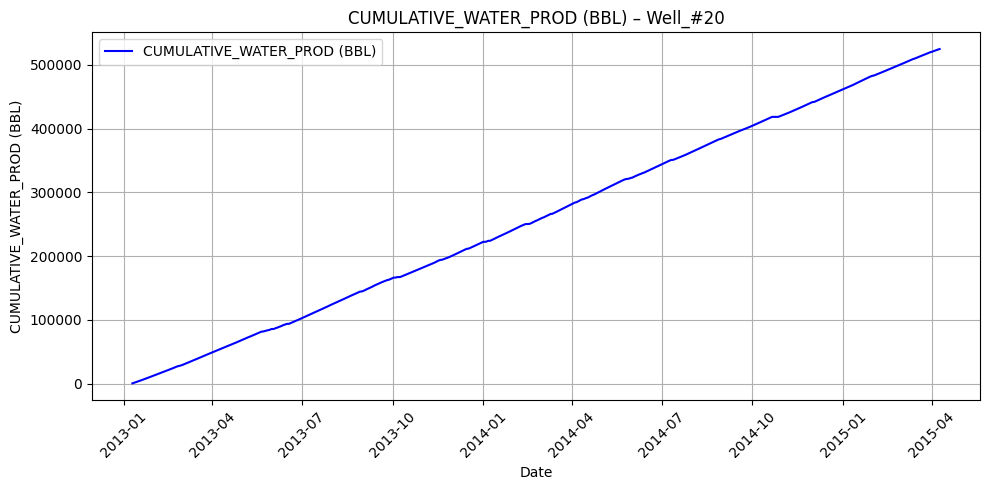

In [ ]:
# Making a Plot for a sample well
for name in Well_names:
  sample_well_name = name  # Change this to other wells in a loop if needed
  sample_well_data = Well_data[Well_data['WELL_NAME'] == sample_well_name].copy()

  plt.figure(figsize=(10, 5))
  plt.plot(sample_well_data['PROD_DATE'], sample_well_data['CUMULATIVE_WATER_PROD (BBL)'], label='CUMULATIVE_WATER_PROD (BBL)', color='blue')
  plt.title(f"CUMULATIVE_WATER_PROD (BBL) – {sample_well_name}")
  plt.xlabel("Date")
  plt.ylabel("CUMULATIVE_WATER_PROD (BBL)")
  plt.legend()
  plt.grid(True)
  plt.xticks(rotation=45)
  plt.tight_layout()
  plt.show()

#Identify the reservoir each well is producing

In [ ]:
#Aggregate well based on maximum Bottom hole flowing Pressure
Max_bhp_perwell = Well_data.groupby('WELL_NAME')['BOTTOMHOLE_FLOWING_PRESSURE (PSI)'].max().reset_index()
Max_bhp_perwell = Max_bhp_perwell.rename(columns={'BOTTOMHOLE_FLOWING_PRESSURE (PSI)': 'Max_BHFP'})
Max_bhp_perwell

,WELL_NAME,Max_BHFP
0,Well_#1,4096.0
1,Well_#10,4051.0
2,Well_#11,2521.0
3,Well_#12,2557.0
4,Well_#13,2246.0
5,Well_#14,2857.0
6,Well_#15,4032.0
7,Well_#16,3836.0
8,Well_#17,2304.0
9,Well_#18,2621.0


In [ ]:
# Initialize the 'Reservoir Name' column in Max_bhp_perwell
Max_bhp_perwell["Reservoir Name"] = ""

# Iterate through each well in Max_bhp_perwell
for index, row in Max_bhp_perwell.iterrows():
    well_max_bhfp = row['Max_BHFP']

    # Calculate the absolute difference between the well's Max_BHFP and each reservoir's Current Average Reservoir Pressure (PSI)
    pressure_diff = abs(well_max_bhfp - reservoir_data['Current Average Reservoir Pressure (PSI)'])

    # Find the index of the reservoir with the minimum pressure difference
    min_diff_index = pressure_diff.idxmin()

    # Assign the Reservoir Name from reservoir_data based on the index of the minimum difference
    Max_bhp_perwell.loc[index, "Reservoir Name"] = reservoir_data.loc[min_diff_index, 'Reservoir Name']

# Display Max_bhp_perwell DataFrame
display(Max_bhp_perwell)

,WELL_NAME,Max_BHFP,Reservoir Name
0,Well_#1,4096.0,JANI
1,Well_#10,4051.0,JANI
2,Well_#11,2521.0,DEPU
3,Well_#12,2557.0,ACHI
4,Well_#13,2246.0,DEPU
5,Well_#14,2857.0,MAKO
6,Well_#15,4032.0,KEMA
7,Well_#16,3836.0,KEMA
8,Well_#17,2304.0,DEPU
9,Well_#18,2621.0,ACHI


In [ ]:
Merge_data = pd.merge(Max_bhp_perwell, reservoir_data, on="Reservoir Name", how="left")
Merge_data

,WELL_NAME,Max_BHFP,Reservoir Name,Initial Reservoir Pressure (PSI),Bubble Point Pressure (PSI),Current Average Reservoir Pressure (PSI),Solution Gas-Oil-Ratio (SCF/BBL),Formation Volume Factor (RB/STB)
0,Well_#1,4096.0,JANI,4500.0,4300.0,4200.0,1000.0,1.30
1,Well_#10,4051.0,JANI,4500.0,4300.0,4200.0,1000.0,1.30
2,Well_#11,2521.0,DEPU,2800.0,2800.0,2400.0,1200.0,1.37
3,Well_#12,2557.0,ACHI,3500.0,3300.0,2700.0,800.0,1.20
4,Well_#13,2246.0,DEPU,2800.0,2800.0,2400.0,1200.0,1.37
5,Well_#14,2857.0,MAKO,3500.0,3500.0,3000.0,500.0,1.15
6,Well_#15,4032.0,KEMA,4200.0,4000.0,3900.0,600.0,1.45
7,Well_#16,3836.0,KEMA,4200.0,4000.0,3900.0,600.0,1.45
8,Well_#17,2304.0,DEPU,2800.0,2800.0,2400.0,1200.0,1.37
9,Well_#18,2621.0,ACHI,3500.0,3300.0,2700.0,800.0,1.20


In [ ]:
#Calculate Pressure difference to see if it is within 200psi
Merge_data['Pressure Difference'] = abs(Merge_data['Max_BHFP'] - Merge_data['Current Average Reservoir Pressure (PSI)'])
Merge_data

,WELL_NAME,Max_BHFP,Reservoir Name,Initial Reservoir Pressure (PSI),Bubble Point Pressure (PSI),Current Average Reservoir Pressure (PSI),Solution Gas-Oil-Ratio (SCF/BBL),Formation Volume Factor (RB/STB),Pressure Difference
0,Well_#1,4096.0,JANI,4500.0,4300.0,4200.0,1000.0,1.30,104.0
1,Well_#10,4051.0,JANI,4500.0,4300.0,4200.0,1000.0,1.30,149.0
2,Well_#11,2521.0,DEPU,2800.0,2800.0,2400.0,1200.0,1.37,121.0
3,Well_#12,2557.0,ACHI,3500.0,3300.0,2700.0,800.0,1.20,143.0
4,Well_#13,2246.0,DEPU,2800.0,2800.0,2400.0,1200.0,1.37,154.0
5,Well_#14,2857.0,MAKO,3500.0,3500.0,3000.0,500.0,1.15,143.0
6,Well_#15,4032.0,KEMA,4200.0,4000.0,3900.0,600.0,1.45,132.0
7,Well_#16,3836.0,KEMA,4200.0,4000.0,3900.0,600.0,1.45,64.0
8,Well_#17,2304.0,DEPU,2800.0,2800.0,2400.0,1200.0,1.37,96.0
9,Well_#18,2621.0,ACHI,3500.0,3300.0,2700.0,800.0,1.20,79.0


# Determine for each reservoir whether saturated or undersaturated using the initial condition

If Initial Pressure <= Bubble Point Pressure(saturated)

If Initial Pressure > Bubble Point Pressure(undersaturated)

In [ ]:
classification_param['Reservoir Type'][0]

'Saturated'

In [ ]:
reservoir_data["Reservoir Type"] = ""
for i in range(len(reservoir_data)):
  if reservoir_data["Initial Reservoir Pressure (PSI)"][i] <= reservoir_data["Bubble Point Pressure (PSI)"][i]:
    reservoir_data.loc[i,"Reservoir Type"] = classification_param['Reservoir Type'][0]
  else:
    reservoir_data.loc[i,"Reservoir Type"] = classification_param['Reservoir Type'][1]

reservoir_data

,Reservoir Name,Initial Reservoir Pressure (PSI),Bubble Point Pressure (PSI),Current Average Reservoir Pressure (PSI),Solution Gas-Oil-Ratio (SCF/BBL),Formation Volume Factor (RB/STB),Reservoir Type
0,ACHI,3500.0,3300.0,2700.0,800.0,1.20,Undersat
1,KEMA,4200.0,4000.0,3900.0,600.0,1.45,Undersat
2,MAKO,3500.0,3500.0,3000.0,500.0,1.15,Saturated
3,DEPU,2800.0,2800.0,2400.0,1200.0,1.37,Saturated
4,JANI,4500.0,4300.0,4200.0,1000.0,1.30,Undersat


#Merge Reservoir Type and Name

In [ ]:
Merge_data['Reservoir Type'] = pd.merge(Merge_data, reservoir_data[['Reservoir Name','Reservoir Type']], on="Reservoir Name", how="left")['Reservoir Type']
Merge_data

,WELL_NAME,Max_BHFP,Reservoir Name,Initial Reservoir Pressure (PSI),Bubble Point Pressure (PSI),Current Average Reservoir Pressure (PSI),Solution Gas-Oil-Ratio (SCF/BBL),Formation Volume Factor (RB/STB),Pressure Difference,Reservoir Type
0,Well_#1,4096.0,JANI,4500.0,4300.0,4200.0,1000.0,1.30,104.0,Undersat
1,Well_#10,4051.0,JANI,4500.0,4300.0,4200.0,1000.0,1.30,149.0,Undersat
2,Well_#11,2521.0,DEPU,2800.0,2800.0,2400.0,1200.0,1.37,121.0,Saturated
3,Well_#12,2557.0,ACHI,3500.0,3300.0,2700.0,800.0,1.20,143.0,Undersat
4,Well_#13,2246.0,DEPU,2800.0,2800.0,2400.0,1200.0,1.37,154.0,Saturated
5,Well_#14,2857.0,MAKO,3500.0,3500.0,3000.0,500.0,1.15,143.0,Saturated
6,Well_#15,4032.0,KEMA,4200.0,4000.0,3900.0,600.0,1.45,132.0,Undersat
7,Well_#16,3836.0,KEMA,4200.0,4000.0,3900.0,600.0,1.45,64.0,Undersat
8,Well_#17,2304.0,DEPU,2800.0,2800.0,2400.0,1200.0,1.37,96.0,Saturated
9,Well_#18,2621.0,ACHI,3500.0,3300.0,2700.0,800.0,1.20,79.0,Undersat


#Identify whether the well is naturally flowing or gas lifted

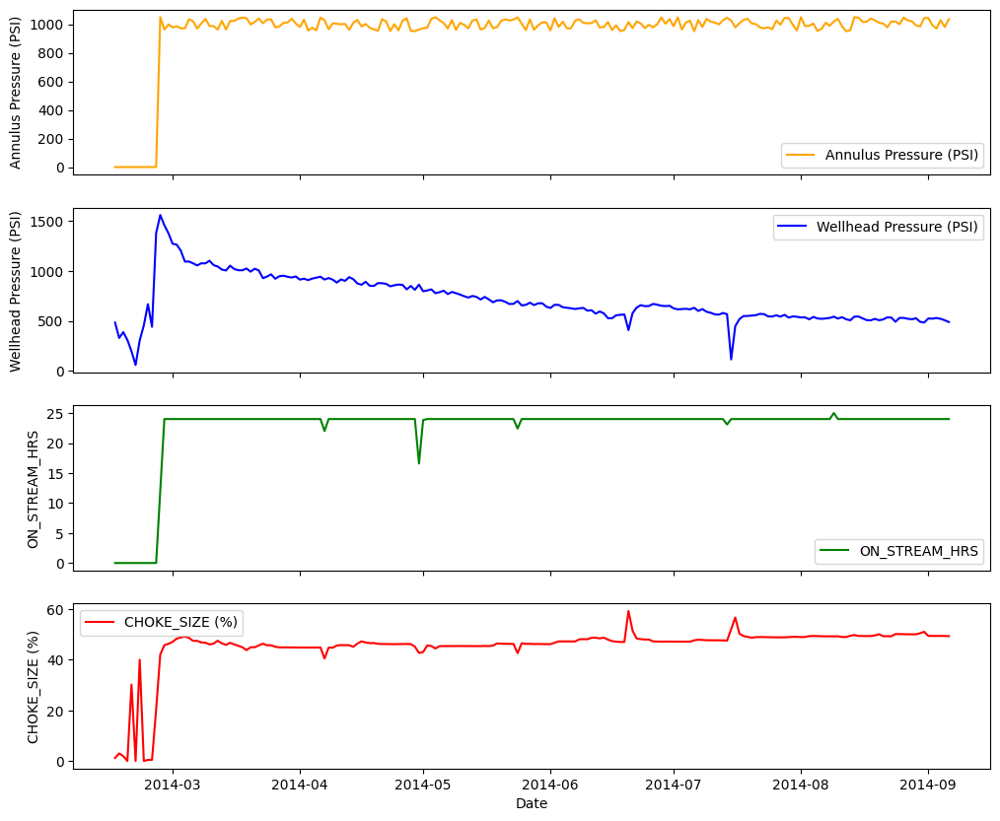

In [ ]:
fig, axs = plt.subplots(4, 1, figsize=(12, 10), sharex=True)
Well = "Well_#1"
mask = Well_data["WELL_NAME"] == Well
Well_data_mask = Well_data[mask]


# ANNULUS PRESSURE
axs[0].plot(Well_data_mask['PROD_DATE'], Well_data_mask['ANNULUS_PRESS (PSI)'], label='Annulus Pressure (PSI)', color='orange')
axs[0].set_ylabel('Annulus Pressure (PSI)')
axs[0].legend()

# WELLHEAD PRESSURE
axs[1].plot(Well_data_mask['PROD_DATE'], Well_data_mask['WELL_HEAD_PRESSURE (PSI)'], label='Wellhead Pressure (PSI)', color='blue')
axs[1].set_ylabel('Wellhead Pressure (PSI)')
axs[1].legend()


# ON_STREAM_HRS
axs[2].plot(Well_data_mask['PROD_DATE'], Well_data_mask['ON_STREAM_HRS'], label='ON_STREAM_HRS', color='green')
axs[2].set_ylabel('ON_STREAM_HRS')
axs[2].legend()

# CHOKE_SIZE
axs[3].plot(Well_data_mask['PROD_DATE'], Well_data_mask['CHOKE_SIZE (%)'], label='CHOKE_SIZE (%)', color='red')
axs[3].set_ylabel('CHOKE_SIZE (%)')
axs[3].legend()

plt.xlabel('Date')
plt.show()
# plt.plot(Well_data.loc[mask,"ON_STREAM_HRS"])
# plt.plot(Well_data.loc[mask,"ANNULUS_PRESS (PSI)"])

In [ ]:
#Aggregate well
Well_agg = Well_data.groupby("WELL_NAME").agg({
    'ON_STREAM_HRS': 'mean',
    'BOTTOMHOLE_FLOWING_PRESSURE (PSI)': 'mean',
    'DOWNHOLE_TEMPERATURE (deg F)': 'mean',
    'ANNULUS_PRESS (PSI)': 'mean',
    'CHOKE_SIZE (%)': 'max',
    'WELL_HEAD_PRESSURE (PSI)': 'max',
    'WELL_HEAD_TEMPERATURE (deg F)': 'max',
    'CUMULATIVE_OIL_PROD (STB)': 'last',
    'CUMULATIVE_FORMATION_GAS_PROD (MSCF)': 'last',
    'CUMULATIVE_TOTAL_GAS_PROD (MSCF)': 'last',
    'CUMULATIVE_WATER_PROD (BBL)': 'last',
}).reset_index()
Well_agg

,WELL_NAME,ON_STREAM_HRS,BOTTOMHOLE_FLOWING_PRESSURE (PSI),DOWNHOLE_TEMPERATURE (deg F),ANNULUS_PRESS (PSI),CHOKE_SIZE (%),WELL_HEAD_PRESSURE (PSI),WELL_HEAD_TEMPERATURE (deg F),CUMULATIVE_OIL_PROD (STB),CUMULATIVE_FORMATION_GAS_PROD (MSCF),CUMULATIVE_TOTAL_GAS_PROD (MSCF),CUMULATIVE_WATER_PROD (BBL)
0,Well_#1,22.592745,2943.250000,207.562745,948.161863,59.25648,1557.760,127.378,101659.0,105445.0,145425.0,38698.0
1,Well_#10,21.116628,3995.653396,208.241824,1044.956934,100.00000,70.098,98.812,116279.0,147319.0,147319.0,17343.0
2,Well_#11,21.181085,2427.369501,143.126349,832.329994,100.00000,221.014,79.235,167307.0,188529.0,245087.0,70288.0
3,Well_#12,21.607069,1996.779507,149.177655,0.048952,69.79259,172.777,89.974,578776.0,392346.0,392346.0,324335.0
4,Well_#13,21.845344,1611.368421,106.349773,17.137304,13.13761,95.507,37.607,190635.0,264037.0,264037.0,38115.0
5,Well_#14,23.412337,2406.733696,148.926386,14.480489,13.37645,242.844,100.591,142421.0,60429.0,60429.0,5323.0
6,Well_#15,19.137584,3139.795107,204.021709,15.247370,43.01704,108.793,123.006,118382.0,123256.0,123256.0,115272.0
7,Well_#16,22.512483,2542.210884,202.295891,17.622276,14.51274,252.799,112.820,67679.0,63386.0,63386.0,24609.0
8,Well_#17,23.766835,1968.717890,156.742667,757.186851,100.00000,142.596,90.241,280021.0,263436.0,380519.0,315759.0
9,Well_#18,23.259231,2216.342949,154.258099,0.000000,76.69223,253.783,93.510,205968.0,182166.0,182166.0,180240.0


In [ ]:
classification_param['Well Type'][0]

'NF'

In [ ]:
# Using a Threshhold of 50psi for annulus pressure
Well_agg['Well Type'] = np.where(Well_agg['ANNULUS_PRESS (PSI)'] <= 50, classification_param['Well Type'][0], classification_param['Well Type'][1])
Well_agg

,WELL_NAME,ON_STREAM_HRS,BOTTOMHOLE_FLOWING_PRESSURE (PSI),DOWNHOLE_TEMPERATURE (deg F),ANNULUS_PRESS (PSI),CHOKE_SIZE (%),WELL_HEAD_PRESSURE (PSI),WELL_HEAD_TEMPERATURE (deg F),CUMULATIVE_OIL_PROD (STB),CUMULATIVE_FORMATION_GAS_PROD (MSCF),CUMULATIVE_TOTAL_GAS_PROD (MSCF),CUMULATIVE_WATER_PROD (BBL),Well Type
0,Well_#1,22.592745,2943.250000,207.562745,948.161863,59.25648,1557.760,127.378,101659.0,105445.0,145425.0,38698.0,GL
1,Well_#10,21.116628,3995.653396,208.241824,1044.956934,100.00000,70.098,98.812,116279.0,147319.0,147319.0,17343.0,GL
2,Well_#11,21.181085,2427.369501,143.126349,832.329994,100.00000,221.014,79.235,167307.0,188529.0,245087.0,70288.0,GL
3,Well_#12,21.607069,1996.779507,149.177655,0.048952,69.79259,172.777,89.974,578776.0,392346.0,392346.0,324335.0,NF
4,Well_#13,21.845344,1611.368421,106.349773,17.137304,13.13761,95.507,37.607,190635.0,264037.0,264037.0,38115.0,NF
5,Well_#14,23.412337,2406.733696,148.926386,14.480489,13.37645,242.844,100.591,142421.0,60429.0,60429.0,5323.0,NF
6,Well_#15,19.137584,3139.795107,204.021709,15.247370,43.01704,108.793,123.006,118382.0,123256.0,123256.0,115272.0,NF
7,Well_#16,22.512483,2542.210884,202.295891,17.622276,14.51274,252.799,112.820,67679.0,63386.0,63386.0,24609.0,NF
8,Well_#17,23.766835,1968.717890,156.742667,757.186851,100.00000,142.596,90.241,280021.0,263436.0,380519.0,315759.0,GL
9,Well_#18,23.259231,2216.342949,154.258099,0.000000,76.69223,253.783,93.510,205968.0,182166.0,182166.0,180240.0,NF


##Merge Well Type and Name

In [ ]:
Merge_data['Well Type'] = pd.merge(Max_bhp_perwell, Well_agg[['WELL_NAME', 'Well Type']], on='WELL_NAME', how='left')['Well Type']
Merge_data

,WELL_NAME,Max_BHFP,Reservoir Name,Initial Reservoir Pressure (PSI),Bubble Point Pressure (PSI),Current Average Reservoir Pressure (PSI),Solution Gas-Oil-Ratio (SCF/BBL),Formation Volume Factor (RB/STB),Pressure Difference,Reservoir Type,Well Type
0,Well_#1,4096.0,JANI,4500.0,4300.0,4200.0,1000.0,1.30,104.0,Undersat,GL
1,Well_#10,4051.0,JANI,4500.0,4300.0,4200.0,1000.0,1.30,149.0,Undersat,GL
2,Well_#11,2521.0,DEPU,2800.0,2800.0,2400.0,1200.0,1.37,121.0,Saturated,GL
3,Well_#12,2557.0,ACHI,3500.0,3300.0,2700.0,800.0,1.20,143.0,Undersat,NF
4,Well_#13,2246.0,DEPU,2800.0,2800.0,2400.0,1200.0,1.37,154.0,Saturated,NF
5,Well_#14,2857.0,MAKO,3500.0,3500.0,3000.0,500.0,1.15,143.0,Saturated,NF
6,Well_#15,4032.0,KEMA,4200.0,4000.0,3900.0,600.0,1.45,132.0,Undersat,NF
7,Well_#16,3836.0,KEMA,4200.0,4000.0,3900.0,600.0,1.45,64.0,Undersat,NF
8,Well_#17,2304.0,DEPU,2800.0,2800.0,2400.0,1200.0,1.37,96.0,Saturated,GL
9,Well_#18,2621.0,ACHI,3500.0,3300.0,2700.0,800.0,1.20,79.0,Undersat,NF


# Determine if production from a well is steady or unsteady

In [ ]:
Well_data = Well_data.sort_values(by=['WELL_NAME', 'PROD_DATE'])
Well_data.tail()

,PROD_DATE,WELL_NAME,ON_STREAM_HRS,BOTTOMHOLE_FLOWING_PRESSURE (PSI),DOWNHOLE_TEMPERATURE (deg F),ANNULUS_PRESS (PSI),CHOKE_SIZE (%),WELL_HEAD_PRESSURE (PSI),WELL_HEAD_TEMPERATURE (deg F),CUMULATIVE_OIL_PROD (STB),CUMULATIVE_FORMATION_GAS_PROD (MSCF),CUMULATIVE_TOTAL_GAS_PROD (MSCF),CUMULATIVE_WATER_PROD (BBL)
3544,2016-08-08,Well_#9,24.00,1343.0,159.142,677.569,30.25111,81.029,74.861,247543.0,232130.0,335299.0,600947.0
3545,2016-08-09,Well_#9,23.75,1344.0,153.782,669.660,29.34552,81.968,75.579,247654.0,232242.0,335461.0,601764.0
3546,2016-08-10,Well_#9,24.00,1328.0,154.673,677.784,30.23203,81.880,76.391,247772.0,232361.0,335633.0,602615.0
3547,2016-08-11,Well_#9,24.00,1339.0,154.959,682.046,30.21677,82.049,75.741,247893.0,232480.0,335804.0,603469.0
3548,2016-08-12,Well_#9,22.14,1325.0,157.523,678.529,27.29570,82.867,74.465,247997.0,232583.0,335953.0,604349.0


### Calculate GOR, Watercut

In [ ]:
#Calculate Daily Rates
Well_data["OIL RATE (STB/DAY)"] = Well_data.groupby("WELL_NAME")["CUMULATIVE_OIL_PROD (STB)"].diff()
Well_data["FORMATION GAS RATE (MSCF/DAY)"] = Well_data.groupby("WELL_NAME")["CUMULATIVE_FORMATION_GAS_PROD (MSCF)"].diff()
Well_data["GAS RATE (MSCF/DAY)"] = Well_data.groupby("WELL_NAME")["CUMULATIVE_TOTAL_GAS_PROD (MSCF)"].diff()
Well_data["WATER RATE (BBL/DAY)"] = Well_data.groupby("WELL_NAME")["CUMULATIVE_WATER_PROD (BBL)"].diff()
Well_data.fillna(0, inplace=True)
Well_data.tail()

,PROD_DATE,WELL_NAME,ON_STREAM_HRS,BOTTOMHOLE_FLOWING_PRESSURE (PSI),DOWNHOLE_TEMPERATURE (deg F),ANNULUS_PRESS (PSI),CHOKE_SIZE (%),WELL_HEAD_PRESSURE (PSI),WELL_HEAD_TEMPERATURE (deg F),CUMULATIVE_OIL_PROD (STB),CUMULATIVE_FORMATION_GAS_PROD (MSCF),CUMULATIVE_TOTAL_GAS_PROD (MSCF),CUMULATIVE_WATER_PROD (BBL),OIL RATE (STB/DAY),FORMATION GAS RATE (MSCF/DAY),GAS RATE (MSCF/DAY),WATER RATE (BBL/DAY)
3544,2016-08-08,Well_#9,24.00,1343.0,159.142,677.569,30.25111,81.029,74.861,247543.0,232130.0,335299.0,600947.0,119.0,119.0,172.0,864.0
3545,2016-08-09,Well_#9,23.75,1344.0,153.782,669.660,29.34552,81.968,75.579,247654.0,232242.0,335461.0,601764.0,111.0,112.0,162.0,817.0
3546,2016-08-10,Well_#9,24.00,1328.0,154.673,677.784,30.23203,81.880,76.391,247772.0,232361.0,335633.0,602615.0,118.0,119.0,172.0,851.0
3547,2016-08-11,Well_#9,24.00,1339.0,154.959,682.046,30.21677,82.049,75.741,247893.0,232480.0,335804.0,603469.0,121.0,119.0,171.0,854.0
3548,2016-08-12,Well_#9,22.14,1325.0,157.523,678.529,27.29570,82.867,74.465,247997.0,232583.0,335953.0,604349.0,104.0,103.0,149.0,880.0


In [ ]:
Well_data["GOR (SCF/STB)"] = (Well_data['FORMATION GAS RATE (MSCF/DAY)'] / Well_data["OIL RATE (STB/DAY)"]) * 1000
Well_data["Watercut"] = Well_data["WATER RATE (BBL/DAY)"] / (Well_data["WATER RATE (BBL/DAY)"]  + Well_data["OIL RATE (STB/DAY)"])
Well_data.fillna(0, inplace=True)
Well_data.tail()

,PROD_DATE,WELL_NAME,ON_STREAM_HRS,BOTTOMHOLE_FLOWING_PRESSURE (PSI),DOWNHOLE_TEMPERATURE (deg F),ANNULUS_PRESS (PSI),CHOKE_SIZE (%),WELL_HEAD_PRESSURE (PSI),WELL_HEAD_TEMPERATURE (deg F),CUMULATIVE_OIL_PROD (STB),CUMULATIVE_FORMATION_GAS_PROD (MSCF),CUMULATIVE_TOTAL_GAS_PROD (MSCF),CUMULATIVE_WATER_PROD (BBL),OIL RATE (STB/DAY),FORMATION GAS RATE (MSCF/DAY),GAS RATE (MSCF/DAY),WATER RATE (BBL/DAY),GOR (SCF/STB),Watercut
3544,2016-08-08,Well_#9,24.00,1343.0,159.142,677.569,30.25111,81.029,74.861,247543.0,232130.0,335299.0,600947.0,119.0,119.0,172.0,864.0,1000.000000,0.878942
3545,2016-08-09,Well_#9,23.75,1344.0,153.782,669.660,29.34552,81.968,75.579,247654.0,232242.0,335461.0,601764.0,111.0,112.0,162.0,817.0,1009.009009,0.880388
3546,2016-08-10,Well_#9,24.00,1328.0,154.673,677.784,30.23203,81.880,76.391,247772.0,232361.0,335633.0,602615.0,118.0,119.0,172.0,851.0,1008.474576,0.878225
3547,2016-08-11,Well_#9,24.00,1339.0,154.959,682.046,30.21677,82.049,75.741,247893.0,232480.0,335804.0,603469.0,121.0,119.0,171.0,854.0,983.471074,0.875897
3548,2016-08-12,Well_#9,22.14,1325.0,157.523,678.529,27.29570,82.867,74.465,247997.0,232583.0,335953.0,604349.0,104.0,103.0,149.0,880.0,990.384615,0.894309


In [ ]:
#Resample Data to 3months
Oil_rate_monthly = (Well_data.set_index('PROD_DATE')
        .groupby('WELL_NAME')['OIL RATE (STB/DAY)']
        .resample('3ME').sum()
        .reset_index()
)
Oil_rate_monthly

,WELL_NAME,PROD_DATE,OIL RATE (STB/DAY)
0,Well_#1,2014-02-28,3348.0
1,Well_#1,2014-05-31,65180.0
2,Well_#1,2014-08-31,31435.0
3,Well_#1,2014-11-30,1696.0
4,Well_#10,2014-09-30,5858.0
...,...,...,...
109,Well_#9,2015-10-31,37857.0
110,Well_#9,2016-01-31,31720.0
111,Well_#9,2016-04-30,21156.0
112,Well_#9,2016-07-31,15807.0


In [ ]:
well1 = Oil_rate_monthly[Oil_rate_monthly["WELL_NAME"] == "Well_#2"].reset_index(drop=True)
well1

,WELL_NAME,PROD_DATE,OIL RATE (STB/DAY)
0,Well_#2,2012-01-31,10782.0
1,Well_#2,2012-04-30,20055.0
2,Well_#2,2012-07-31,11956.0
3,Well_#2,2012-10-31,13067.0
4,Well_#2,2013-01-31,9263.0
5,Well_#2,2013-04-30,9307.0


In [ ]:
lists = [well1["OIL RATE (STB/DAY)"][0], well1["OIL RATE (STB/DAY)"][1]]
max(lists)

np.float64(20055.0)

In [ ]:
# Calculate the difference between the 6th month and 3rd month's oil rate for each well
well1 = Oil_rate_monthly[Oil_rate_monthly["WELL_NAME"] == "Well_#1"].reset_index(drop=True)
lists = [well1["OIL RATE (STB/DAY)"][1], well1["OIL RATE (STB/DAY)"][2]]

cal = abs((well1["OIL RATE (STB/DAY)"][1] - well1["OIL RATE (STB/DAY)"][2])) / (max(lists))


cal

np.float64(0.5177201595581467)

In [ ]:
# Classify well to Steady and Unsteady, An Unsteady well have 50% drop between 3-6 months
production_types = []
for i in range(len(well1) - 2):
  lists = [well1["OIL RATE (STB/DAY)"][i+1], well1["OIL RATE (STB/DAY)"][i+2]]
  cal = abs((well1["OIL RATE (STB/DAY)"][i+2] - well1["OIL RATE (STB/DAY)"][i+1])) / (max(lists))
  if cal > 0.5:
    production_types.append("UnSteady")
  else:
    production_types.append("Steady")

print(production_types)

['UnSteady', 'UnSteady']


In [ ]:
if any(col == "UnSteady" for col in production_types):
  well1["new"] = classification_param["Production Type"][1]
else:
  well1["new"] = classification_param["Production Type"][0]


In [ ]:
well1

,WELL_NAME,PROD_DATE,OIL RATE (STB/DAY),new
0,Well_#1,2014-02-28,3348.0,Unsteady
1,Well_#1,2014-05-31,65180.0,Unsteady
2,Well_#1,2014-08-31,31435.0,Unsteady
3,Well_#1,2014-11-30,1696.0,Unsteady


In [ ]:
#Extract Well names
Well_names = Oil_rate_monthly['WELL_NAME'].unique()
Well_names

array(['Well_#1', 'Well_#10', 'Well_#11', 'Well_#12', 'Well_#13',
       'Well_#14', 'Well_#15', 'Well_#16', 'Well_#17', 'Well_#18',
       'Well_#19', 'Well_#2', 'Well_#20', 'Well_#3', 'Well_#4', 'Well_#5',
       'Well_#6', 'Well_#7', 'Well_#8', 'Well_#9'], dtype=object)

In [ ]:
#Apply the classification algorithm above to all wells
# Classify well to Steady and Unsteady, An Unsteady well have 50% drop between 3-6 months
ov_type = []
for name in Well_names:
  well = Oil_rate_monthly[Oil_rate_monthly["WELL_NAME"] == name].reset_index(drop=True)
  production_types = []
  for i in range(len(well) - 2):
    #store values for 2 Consecutive months(every 3 months)
    lists = [well["OIL RATE (STB/DAY)"][i+1], well["OIL RATE (STB/DAY)"][i+2]]
    #pick the max value in the list
    max_list = max(lists)

    #Check for months with no oil production
    if max_list == 0:
       cal = 0
    else:
      #calculate drop btw the 2 consecutive months(every 3months)
      cal = abs((well["OIL RATE (STB/DAY)"][i+1] - well["OIL RATE (STB/DAY)"][i+2])) / max_list

    # Check for 50 % drop in Oil Production
    if cal > 0.5:
      production_types.append("UnSteady")
    else:
      production_types.append("Steady")

  # check if any value in production_type is unsteady
  if any(col == "UnSteady" for col in production_types):
    ov_type.append(classification_param["Production Type"][1])
  else:
    ov_type.append(classification_param["Production Type"][0])

len(ov_type)

20

In [ ]:
ov_type

['Unsteady',
 'Steady',
 'Unsteady',
 'Unsteady',
 'Steady',
 'Steady',
 'Steady',
 'Steady',
 'Steady',
 'Unsteady',
 'Unsteady',
 'Steady',
 'Steady',
 'Unsteady',
 'Steady',
 'Unsteady',
 'Unsteady',
 'Unsteady',
 'Unsteady',
 'Unsteady']

##Merge Production Type

In [ ]:
production_type_df = pd.DataFrame({'WELL_NAME': Well_names, 'Production Type': ov_type})
Merge_data = pd.merge(Merge_data, production_type_df, on='WELL_NAME', how='left')
Merge_data

,WELL_NAME,Max_BHFP,Reservoir Name,Initial Reservoir Pressure (PSI),Bubble Point Pressure (PSI),Current Average Reservoir Pressure (PSI),Solution Gas-Oil-Ratio (SCF/BBL),Formation Volume Factor (RB/STB),Pressure Difference,Reservoir Type,Well Type,Production Type
0,Well_#1,4096.0,JANI,4500.0,4300.0,4200.0,1000.0,1.30,104.0,Undersat,GL,Unsteady
1,Well_#10,4051.0,JANI,4500.0,4300.0,4200.0,1000.0,1.30,149.0,Undersat,GL,Steady
2,Well_#11,2521.0,DEPU,2800.0,2800.0,2400.0,1200.0,1.37,121.0,Saturated,GL,Unsteady
3,Well_#12,2557.0,ACHI,3500.0,3300.0,2700.0,800.0,1.20,143.0,Undersat,NF,Unsteady
4,Well_#13,2246.0,DEPU,2800.0,2800.0,2400.0,1200.0,1.37,154.0,Saturated,NF,Steady
5,Well_#14,2857.0,MAKO,3500.0,3500.0,3000.0,500.0,1.15,143.0,Saturated,NF,Steady
6,Well_#15,4032.0,KEMA,4200.0,4000.0,3900.0,600.0,1.45,132.0,Undersat,NF,Steady
7,Well_#16,3836.0,KEMA,4200.0,4000.0,3900.0,600.0,1.45,64.0,Undersat,NF,Steady
8,Well_#17,2304.0,DEPU,2800.0,2800.0,2400.0,1200.0,1.37,96.0,Saturated,GL,Steady
9,Well_#18,2621.0,ACHI,3500.0,3300.0,2700.0,800.0,1.20,79.0,Undersat,NF,Unsteady


#Determine formation GOR trend

In [ ]:
classification_param['Formation GOR Trend']

,Formation GOR Trend
0,aSolGOR
1,bSolGOR
2,Combo
3,NaN
4,NaN


In [ ]:
#Filter Data to calculate active production periods i.e where Daily Oil/Gas production > 0
active_production_data = Well_data[(Well_data["GOR (SCF/STB)"] > 0)]

#Classify GOR trend
GOR_trend = []
for name in Well_names:
  well_data_subset = active_production_data[active_production_data["WELL_NAME"] == name].reset_index(drop=True)
  reservoir_name = Max_bhp_perwell[Max_bhp_perwell['WELL_NAME'] == name]['Reservoir Name'].iloc[0]
  solution_gor = reservoir_data[reservoir_data['Reservoir Name'] == reservoir_name]['Solution Gas-Oil-Ratio (SCF/BBL)'].iloc[0]

  above = (well_data_subset["GOR (SCF/STB)"] > solution_gor).sum()
  below = (well_data_subset["GOR (SCF/STB)"] <= solution_gor).sum()
  total = len(well_data_subset)

  # Determine GOR trend using a threshold of 90% to account for anomalies/outliers
  if above / total >= 0.9:
    GOR_trend.append(classification_param["Formation GOR Trend"][0]) # aSolGOR

  elif below / total >= 0.9:
    GOR_trend.append(classification_param["Formation GOR Trend"][1]) # bSolGOR

  else:
    GOR_trend.append(classification_param["Formation GOR Trend"][2]) # Combo

print(GOR_trend)

['aSolGOR', 'aSolGOR', 'bSolGOR', 'bSolGOR', 'aSolGOR', 'bSolGOR', 'aSolGOR', 'aSolGOR', 'bSolGOR', 'aSolGOR', 'aSolGOR', 'Combo', 'Combo', 'aSolGOR', 'aSolGOR', 'aSolGOR', 'aSolGOR', 'aSolGOR', 'aSolGOR', 'bSolGOR']


In [ ]:
GOR_trend

['aSolGOR',
 'aSolGOR',
 'bSolGOR',
 'bSolGOR',
 'aSolGOR',
 'bSolGOR',
 'aSolGOR',
 'aSolGOR',
 'bSolGOR',
 'aSolGOR',
 'aSolGOR',
 'Combo',
 'Combo',
 'aSolGOR',
 'aSolGOR',
 'aSolGOR',
 'aSolGOR',
 'aSolGOR',
 'aSolGOR',
 'bSolGOR']

In [ ]:
Merge_data['Formation GOR Trend'] = pd.merge(Merge_data['WELL_NAME'], pd.DataFrame({'WELL_NAME': Well_names, 'Formation GOR Trend': GOR_trend}), on='WELL_NAME', how='left')['Formation GOR Trend']
Merge_data

,WELL_NAME,Max_BHFP,Reservoir Name,Initial Reservoir Pressure (PSI),Bubble Point Pressure (PSI),Current Average Reservoir Pressure (PSI),Solution Gas-Oil-Ratio (SCF/BBL),Formation Volume Factor (RB/STB),Pressure Difference,Reservoir Type,Well Type,Production Type,Formation GOR Trend
0,Well_#1,4096.0,JANI,4500.0,4300.0,4200.0,1000.0,1.30,104.0,Undersat,GL,Unsteady,aSolGOR
1,Well_#10,4051.0,JANI,4500.0,4300.0,4200.0,1000.0,1.30,149.0,Undersat,GL,Steady,aSolGOR
2,Well_#11,2521.0,DEPU,2800.0,2800.0,2400.0,1200.0,1.37,121.0,Saturated,GL,Unsteady,bSolGOR
3,Well_#12,2557.0,ACHI,3500.0,3300.0,2700.0,800.0,1.20,143.0,Undersat,NF,Unsteady,bSolGOR
4,Well_#13,2246.0,DEPU,2800.0,2800.0,2400.0,1200.0,1.37,154.0,Saturated,NF,Steady,aSolGOR
5,Well_#14,2857.0,MAKO,3500.0,3500.0,3000.0,500.0,1.15,143.0,Saturated,NF,Steady,bSolGOR
6,Well_#15,4032.0,KEMA,4200.0,4000.0,3900.0,600.0,1.45,132.0,Undersat,NF,Steady,aSolGOR
7,Well_#16,3836.0,KEMA,4200.0,4000.0,3900.0,600.0,1.45,64.0,Undersat,NF,Steady,aSolGOR
8,Well_#17,2304.0,DEPU,2800.0,2800.0,2400.0,1200.0,1.37,96.0,Saturated,GL,Steady,bSolGOR
9,Well_#18,2621.0,ACHI,3500.0,3300.0,2700.0,800.0,1.20,79.0,Undersat,NF,Unsteady,aSolGOR


In [ ]:
Merge_data['Reservoir Name'].value_counts()

,count
Reservoir Name,
KEMA,6
DEPU,5
MAKO,4
ACHI,3
JANI,2


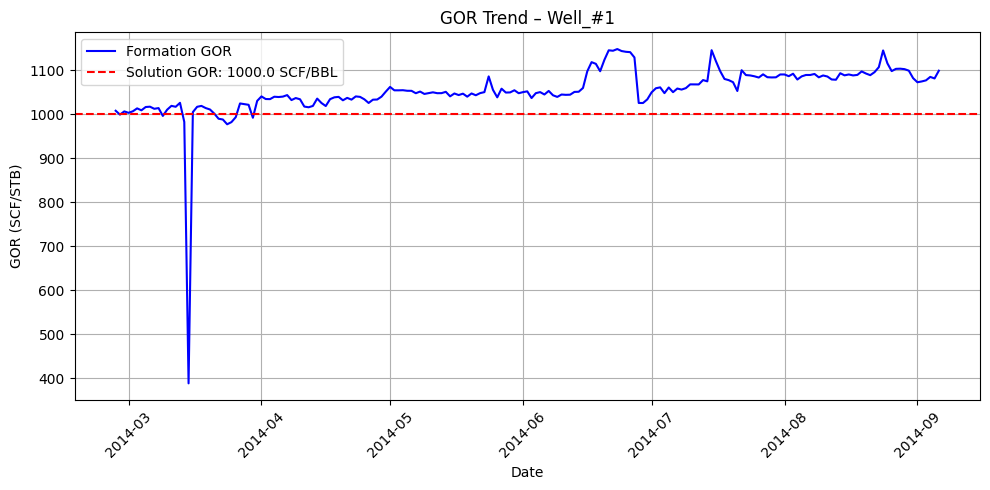

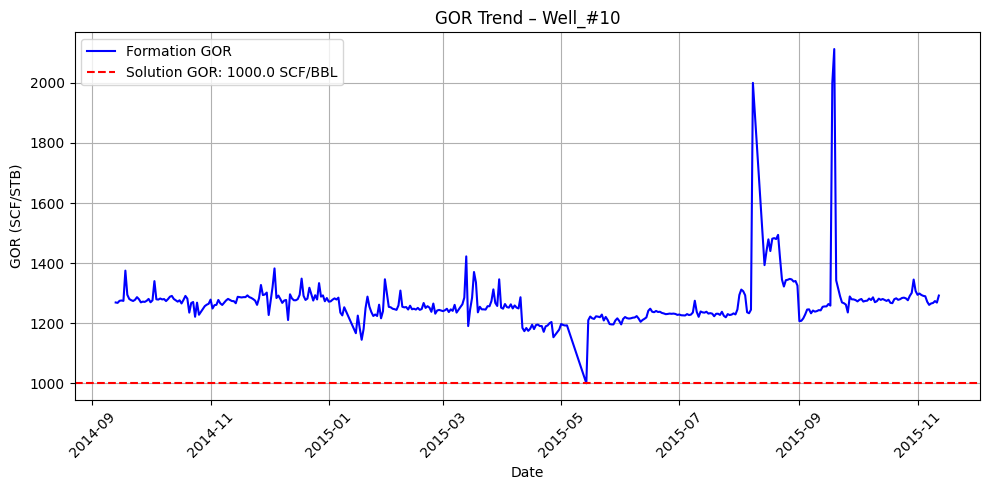

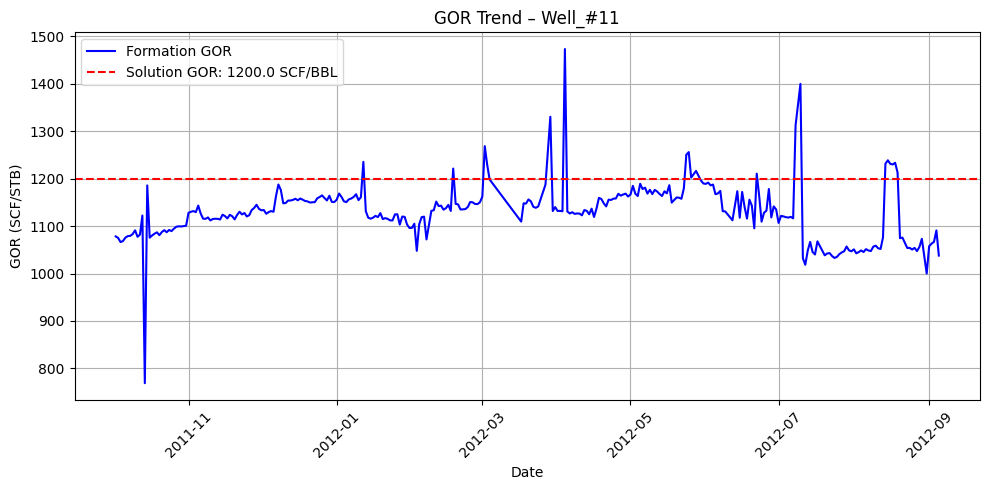

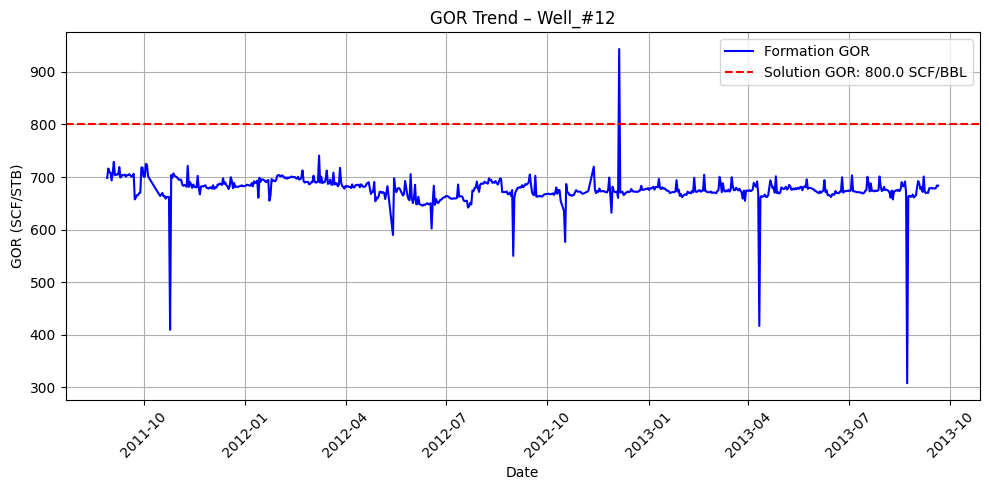

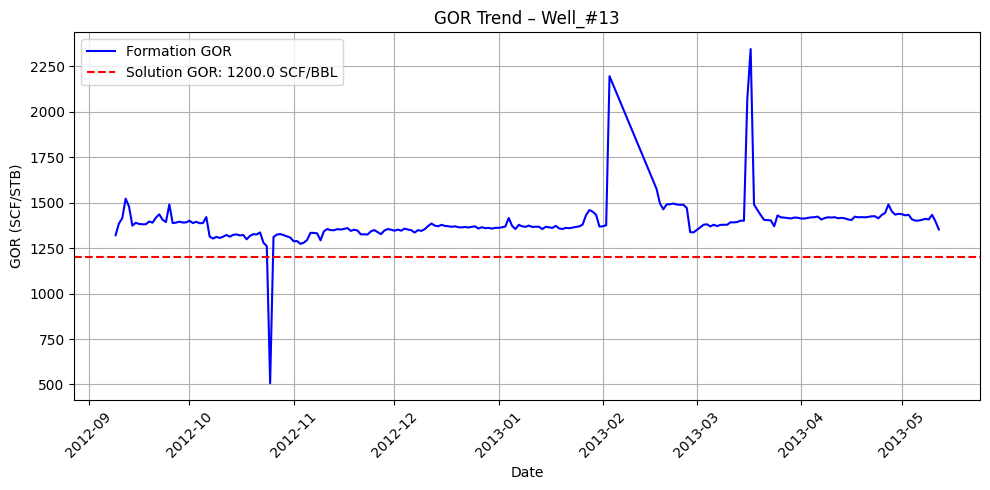

...

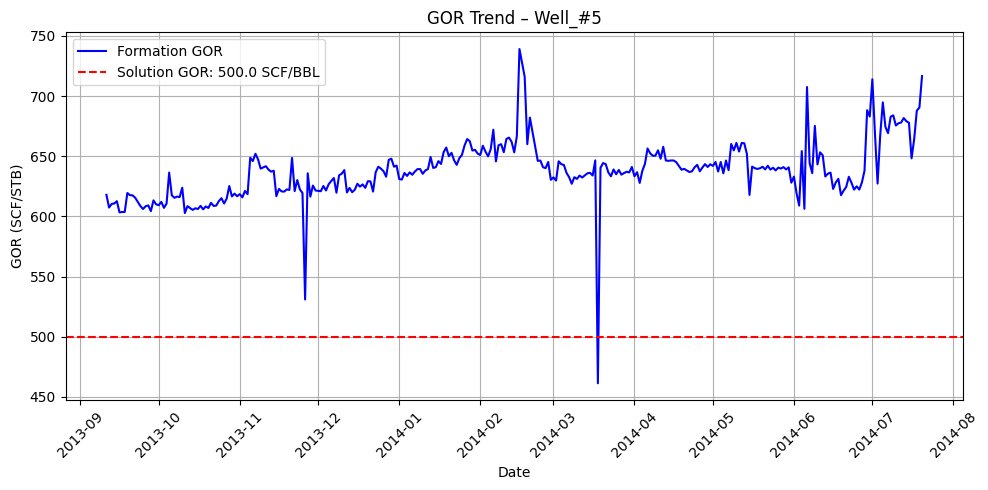

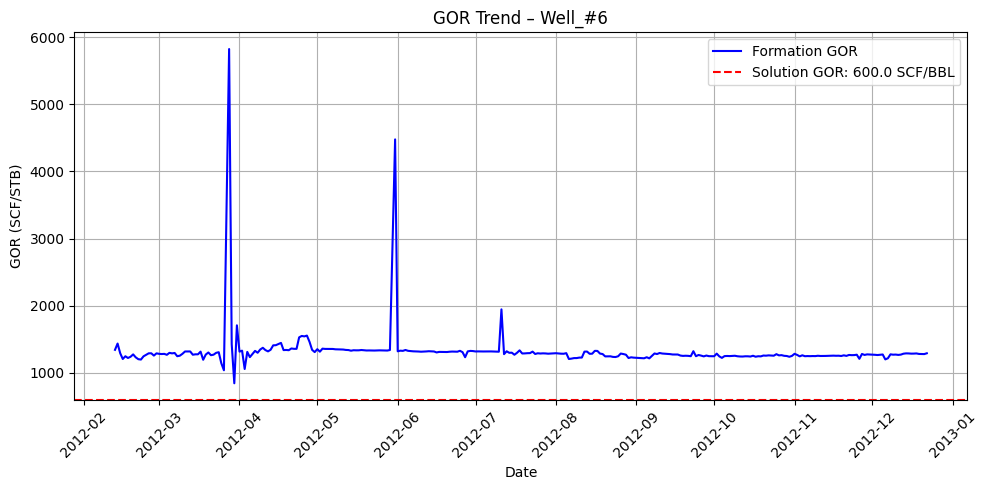

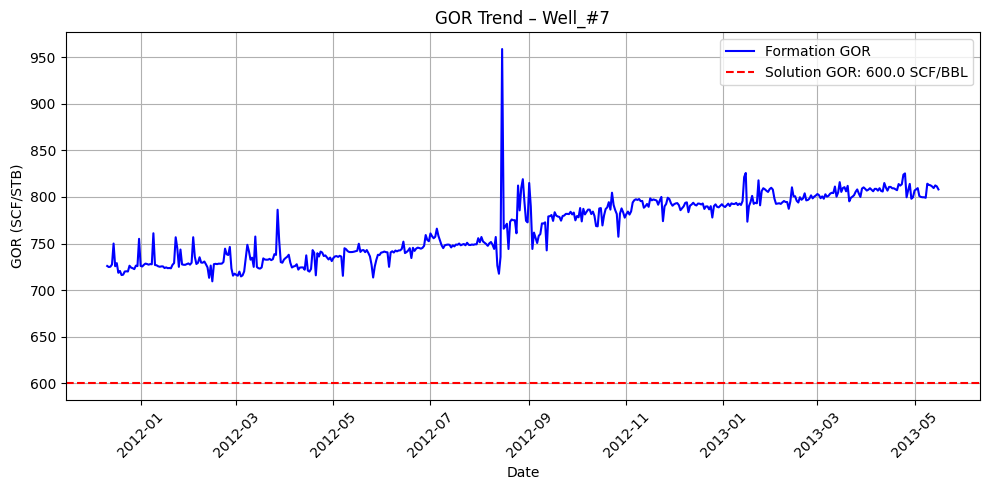

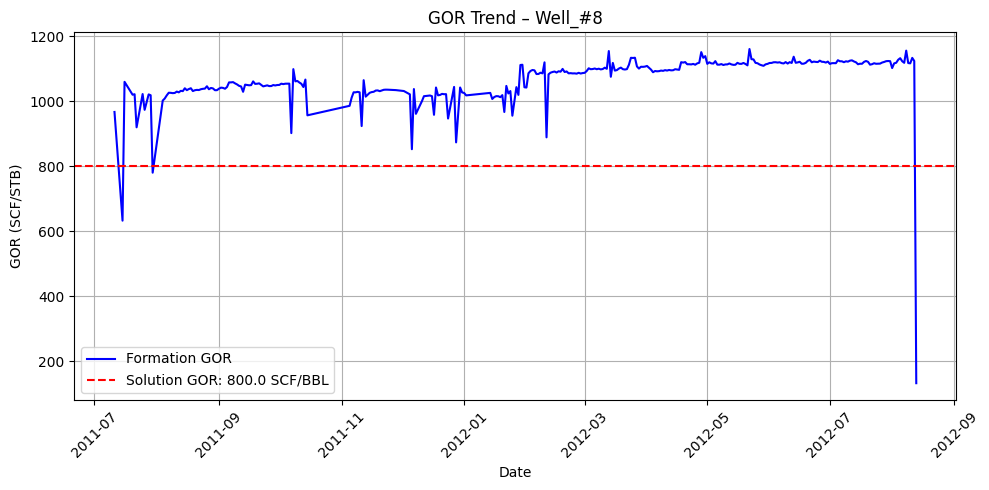

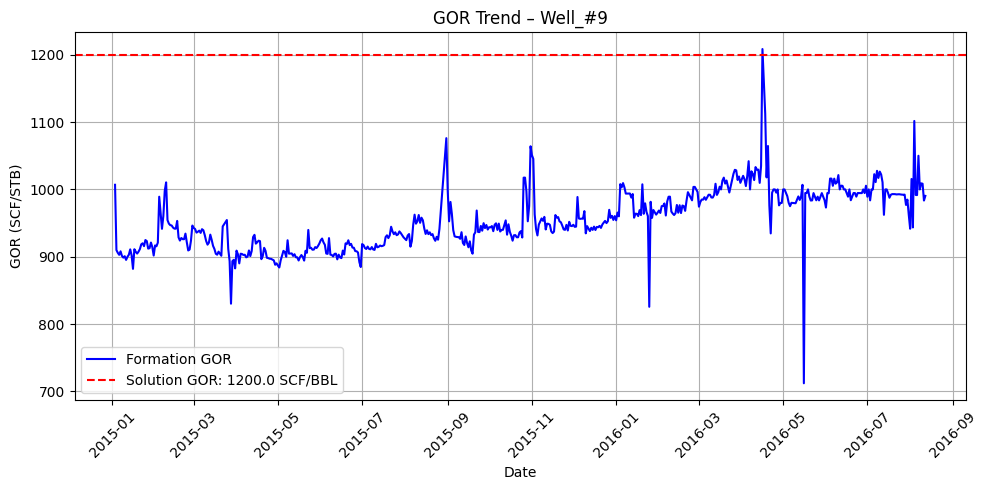

In [ ]:
#Filter Data to calculate active production periods i.e where Daily Oil/Gas production > 0
active_production_data = Well_data[(Well_data["GOR (SCF/STB)"] > 0)]

# Plotting GOR trend for a sample well
for name in Well_names:
  sample_well_name = name  # Change this to other wells in a loop if needed
  sample_well_data = active_production_data[active_production_data['WELL_NAME'] == sample_well_name].copy()

  # Get the reservoir name for the sample well
  reservoir_name = Max_bhp_perwell[Max_bhp_perwell['WELL_NAME'] == sample_well_name]['Reservoir Name'].iloc[0]

  # Get the solution GOR for the corresponding reservoir
  solution_gor = reservoir_data[reservoir_data['Reservoir Name'] == reservoir_name]['Solution Gas-Oil-Ratio (SCF/BBL)'].iloc[0]

  plt.figure(figsize=(10, 5))
  plt.plot(sample_well_data['PROD_DATE'], sample_well_data['GOR (SCF/STB)'], label='Formation GOR', color='blue')
  plt.axhline(y=solution_gor, color='red', linestyle='--', label=f'Solution GOR: {solution_gor} SCF/BBL')
  plt.title(f"GOR Trend – {sample_well_name}")
  plt.xlabel("Date")
  plt.ylabel("GOR (SCF/STB)")
  plt.legend()
  plt.grid(True)
  plt.xticks(rotation=45)
  plt.tight_layout()
  plt.show()

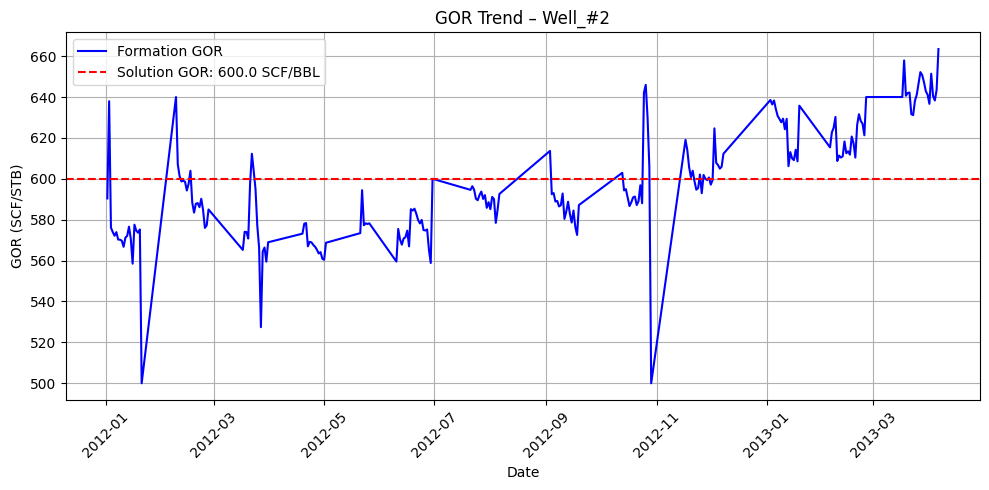

In [ ]:
#Filter Data to calculate active production periods i.e where Daily Oil/Gas production > 0
active_production_data = Well_data[(Well_data["GOR (SCF/STB)"] > 0)]

# To plot the filtered data:
sample_well_name = "Well_#2"  # Change this to other wells in a loop if needed
sample_well_data = active_production_data[active_production_data['WELL_NAME'] == sample_well_name].copy()

# Get the reservoir name for the sample well
reservoir_name = Max_bhp_perwell[Max_bhp_perwell['WELL_NAME'] == sample_well_name]['Reservoir Name'].iloc[0]

# Get the solution GOR for the corresponding reservoir
solution_gor = reservoir_data[reservoir_data['Reservoir Name'] == reservoir_name]['Solution Gas-Oil-Ratio (SCF/BBL)'].iloc[0]

plt.figure(figsize=(10, 5))
plt.plot(sample_well_data['PROD_DATE'], sample_well_data['GOR (SCF/STB)'], label='Formation GOR', color='blue')
plt.axhline(y=solution_gor, color='red', linestyle='--', label=f'Solution GOR: {solution_gor} SCF/BBL')
plt.title(f"GOR Trend – {sample_well_name}")
plt.xlabel("Date")
plt.ylabel("GOR (SCF/STB)")
plt.legend()
plt.grid(True)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

#Extract Data for Modeling

In [ ]:
Extract = pd.merge(Well_data,Merge_data, on='WELL_NAME', how='left')
Extract.head()

,PROD_DATE,WELL_NAME,ON_STREAM_HRS,BOTTOMHOLE_FLOWING_PRESSURE (PSI),DOWNHOLE_TEMPERATURE (deg F),ANNULUS_PRESS (PSI),CHOKE_SIZE (%),WELL_HEAD_PRESSURE (PSI),WELL_HEAD_TEMPERATURE (deg F),CUMULATIVE_OIL_PROD (STB),...,Initial Reservoir Pressure (PSI),Bubble Point Pressure (PSI),Current Average Reservoir Pressure (PSI),Solution Gas-Oil-Ratio (SCF/BBL),Formation Volume Factor (RB/STB),Pressure Difference,Reservoir Type,Well Type,Production Type,Formation GOR Trend
0,2014-02-15,Well_#1,0.0,4050.0,189.866,0.0,1.17951,482.460,50.864,0.0,...,4500.0,4300.0,4200.0,1000.0,1.3,104.0,Undersat,GL,Unsteady,aSolGOR
1,2014-02-16,Well_#1,0.0,3961.0,189.945,0.0,2.99440,328.601,47.668,0.0,...,4500.0,4300.0,4200.0,1000.0,1.3,104.0,Undersat,GL,Unsteady,aSolGOR
2,2014-02-17,Well_#1,0.0,3961.0,190.004,0.0,1.90349,387.218,48.962,0.0,...,4500.0,4300.0,4200.0,1000.0,1.3,104.0,Undersat,GL,Unsteady,aSolGOR
3,2014-02-18,Well_#1,0.0,3964.0,190.020,0.0,0.00000,308.980,46.636,0.0,...,4500.0,4300.0,4200.0,1000.0,1.3,104.0,Undersat,GL,Unsteady,aSolGOR
4,2014-02-19,Well_#1,0.0,3965.0,190.107,0.0,30.20760,196.057,47.297,0.0,...,4500.0,4300.0,4200.0,1000.0,1.3,104.0,Undersat,GL,Unsteady,aSolGOR


In [ ]:
Extract.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7955 entries, 0 to 7954
Data columns (total 31 columns):
 #   Column                                    Non-Null Count  Dtype         
---  ------                                    --------------  -----         
 0   PROD_DATE                                 7955 non-null   datetime64[ns]
 1   WELL_NAME                                 7955 non-null   object        
 2   ON_STREAM_HRS                             7955 non-null   float64       
 3   BOTTOMHOLE_FLOWING_PRESSURE (PSI)         7955 non-null   float64       
 4   DOWNHOLE_TEMPERATURE (deg F)              7955 non-null   float64       
 5   ANNULUS_PRESS (PSI)                       7955 non-null   float64       
 6   CHOKE_SIZE (%)                            7955 non-null   float64       
 7   WELL_HEAD_PRESSURE (PSI)                  7955 non-null   float64       
 8   WELL_HEAD_TEMPERATURE (deg F)             7955 non-null   float64       
 9   CUMULATIVE_OIL_PROD (STB)     

#Determine Watercut Trend

In [ ]:
#Trial 3
from scipy.stats import linregress

def classify_watercut_trend(well_df):
    # well = "Well_#1"
    # mask = Well_data["WELL_NAME"] == well
    # Well_data_mask = Well_data[mask]

    #Filter data based on Active Total liquid production
    act_liq_production = well_df[well_df['Watercut'] > 0].copy()

    #Calculate Rates
    oil_rate = act_liq_production['CUMULATIVE_OIL_PROD (STB)'].diff().fillna(0)
    water_rate = act_liq_production['CUMULATIVE_WATER_PROD (BBL)'].diff().fillna(0)
    total_liquid = oil_rate + water_rate
    watercut = (water_rate / total_liquid).replace([np.inf, -np.inf], 0).fillna(0)

    # Calculate the 10th and 90th percentiles
    lower_bound = watercut.quantile(0.10)
    upper_bound = watercut.quantile(0.90)

    # Filter the DataFrame to remove outliers
    watercut_filtered = watercut[watercut <= upper_bound]

    watercut_smooth = watercut_filtered.rolling(window=5, min_periods=1).mean()
    t = np.arange(len(watercut_smooth))
    slope, _, r_value, _, _ = linregress(t, watercut_smooth)

    # Detect local variability by calculating local slopes for every value in num_days
    num_days = min(20,len(watercut_smooth)//9)
    loc_slope = []
    for i in range(0,len(watercut_smooth),num_days):
      local_val = watercut_smooth.iloc[i:i+num_days]
      k = np.arange(len(local_val))
      if len(k) > 1:
          slope1, _, r_value, _, _ = linregress(k,local_val)
          loc_slope.append(slope1)
      else:
          loc_slope.append(np.nan) # Handle cases with less than 2 data points for linregress

    locc_slope = pd.Series(loc_slope)
    locc_slope.fillna(0, inplace=True)
    locc_slope

    ups = (locc_slope > 0.0001).sum()     # calculate no. of positive vals
    downs = (locc_slope < -0.0001).sum()  # calculate no. of Negative vals
    neutral = (abs(locc_slope) < 0.00001).sum()   # calculate no. of Flat vals
    total = len(locc_slope)

    #classification heuristics where set based on %frequency of occurence
    if ups/total > 0.2 and downs/total > 0.3:
        return('Combo')
    elif neutral/total > 0.2 and ups/total > 0.3:
        return('Combo')
    elif neutral/total > 0.2 and downs/total > 0.3:
        return('Combo')
    elif ups/total >= 0.6:
        return('Incr')
    elif downs/total > 0.5:
        return('Decr')
    elif neutral/total > 0.3:
        return('Flat')
    elif slope < 0.00011:
        return('Flat')

    return(ups/total,downs/total,neutral/total,total)


# Apply to each well
trend_results = []
for well, group in Well_data.groupby('WELL_NAME'):
    group = group.sort_values('PROD_DATE')
    trend = classify_watercut_trend(group)
    trend_results.append({'WELL_NAME': well, 'Watercut Trend': trend})

watercut_trend_df = pd.DataFrame(trend_results)
print(watercut_trend_df)

   WELL_NAME Watercut Trend
0    Well_#1           Incr
1   Well_#10          Combo
2   Well_#11           Incr
3   Well_#12           Incr
4   Well_#13           Flat
5   Well_#14          Combo
6   Well_#15          Combo
7   Well_#16           Flat
8   Well_#17          Combo
9   Well_#18           Incr
10  Well_#19           Incr
11   Well_#2          Combo
12  Well_#20           Incr
13   Well_#3          Combo
14   Well_#4          Combo
15   Well_#5           Incr
16   Well_#6           Flat
17   Well_#7           Incr
18   Well_#8          Combo
19   Well_#9           Incr


##Visualize Watercut Plot against Time

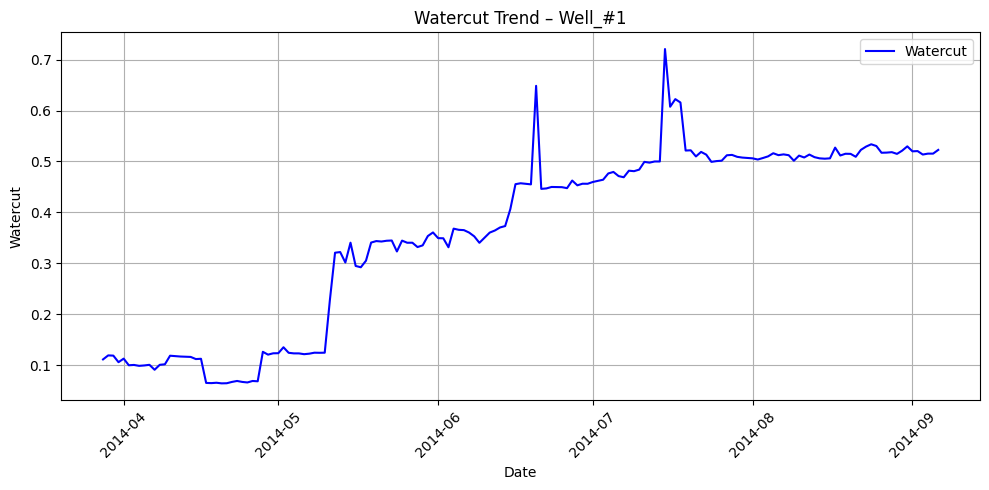

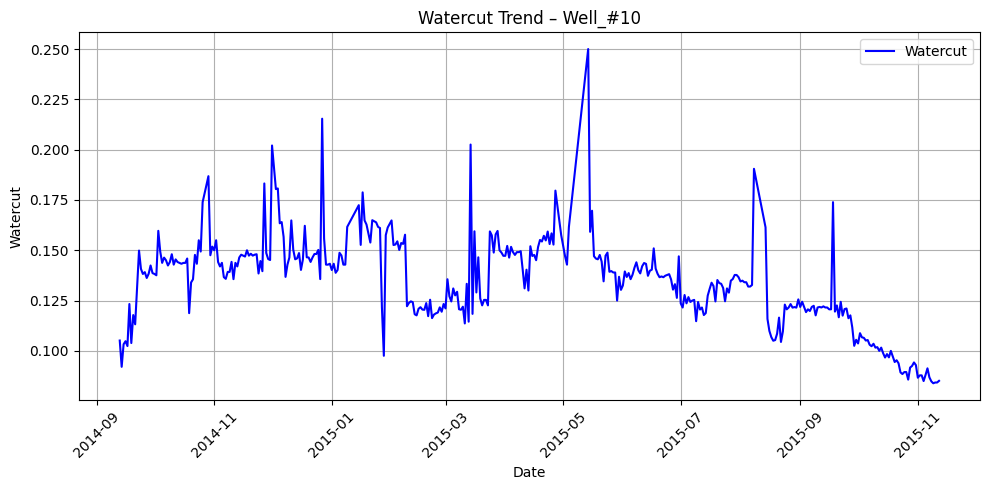

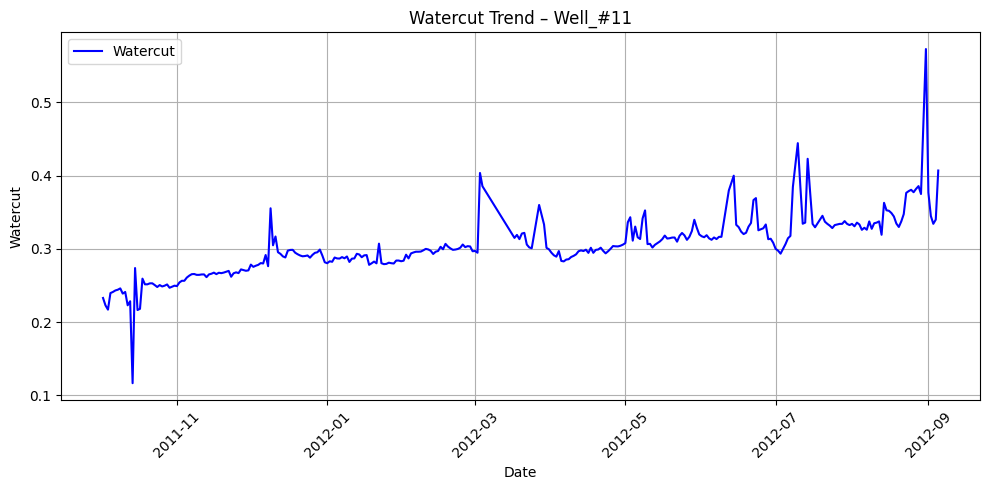

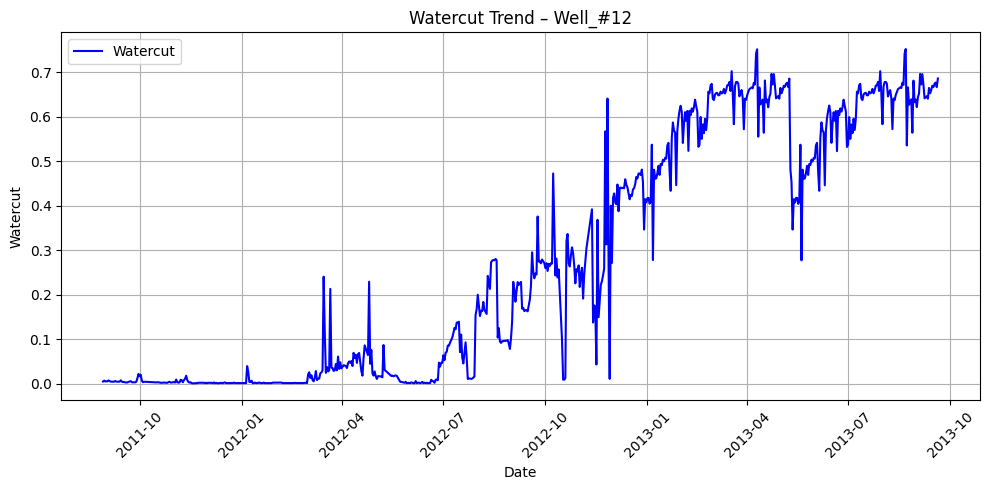

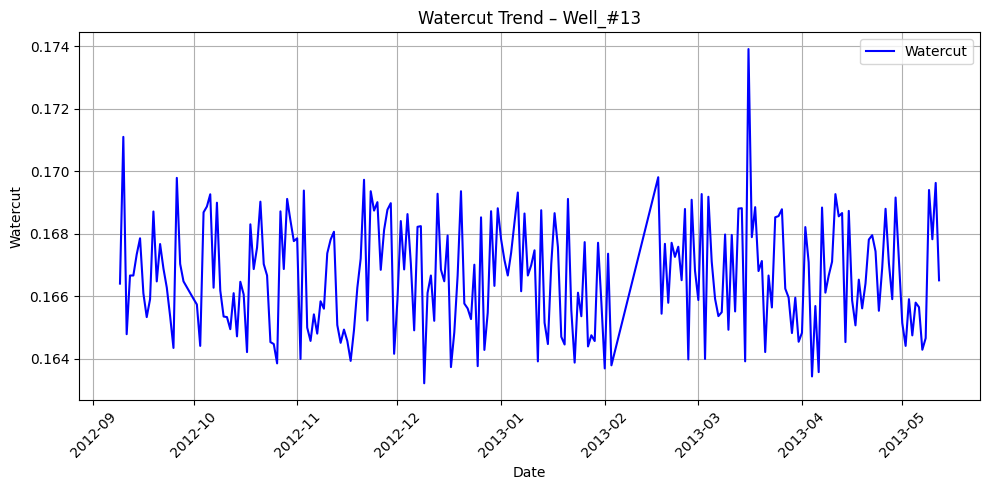

...

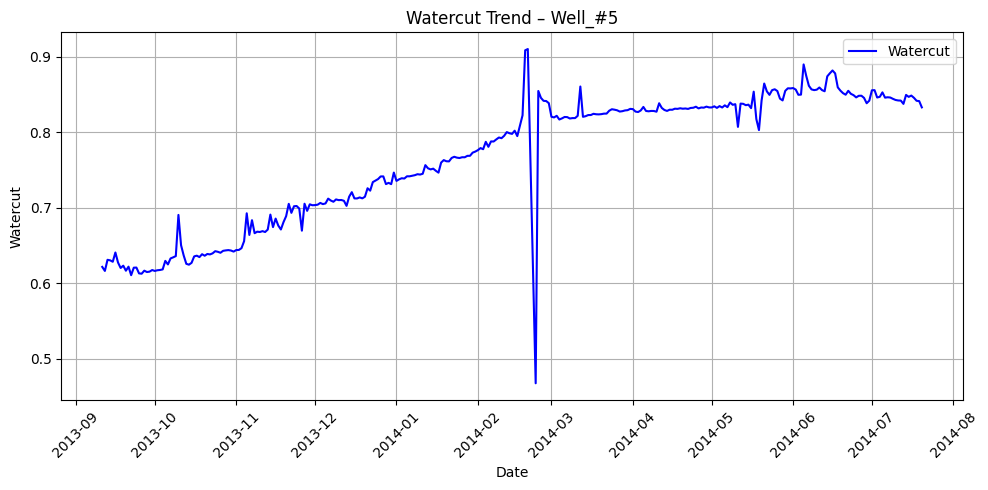

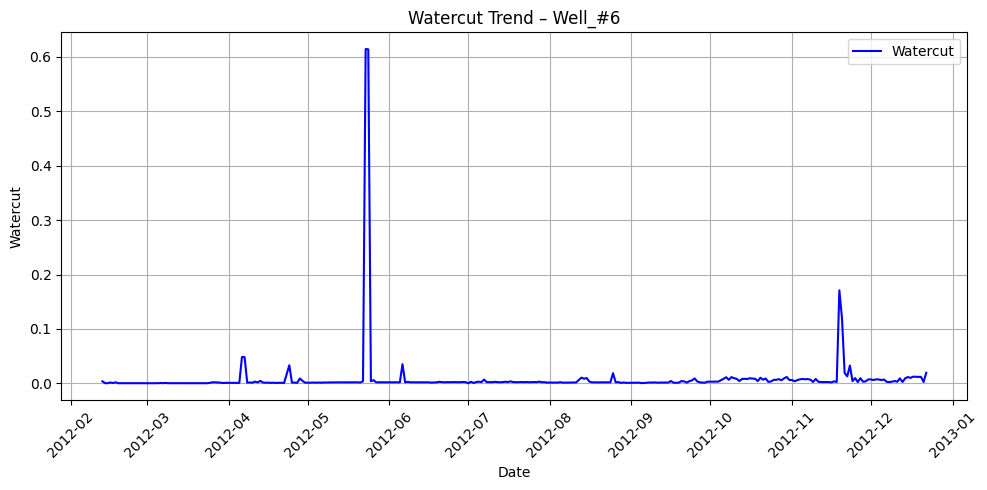

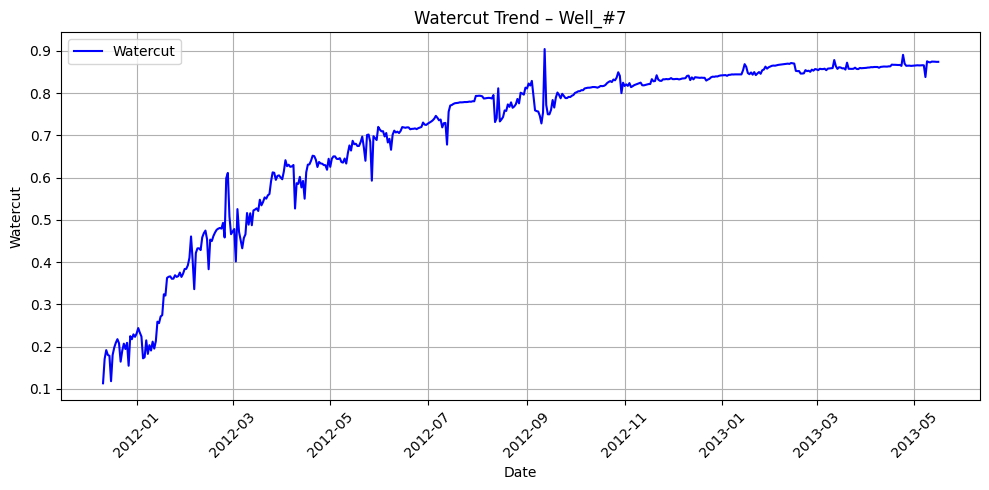

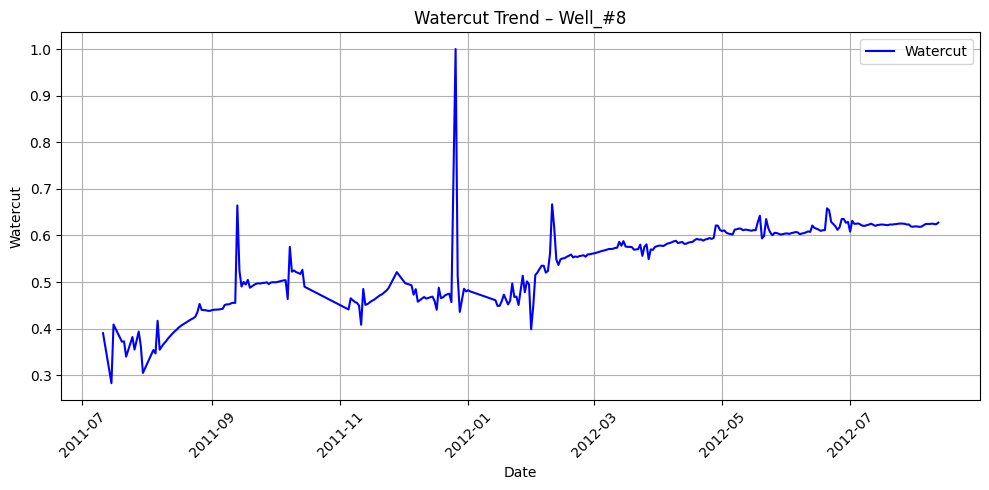

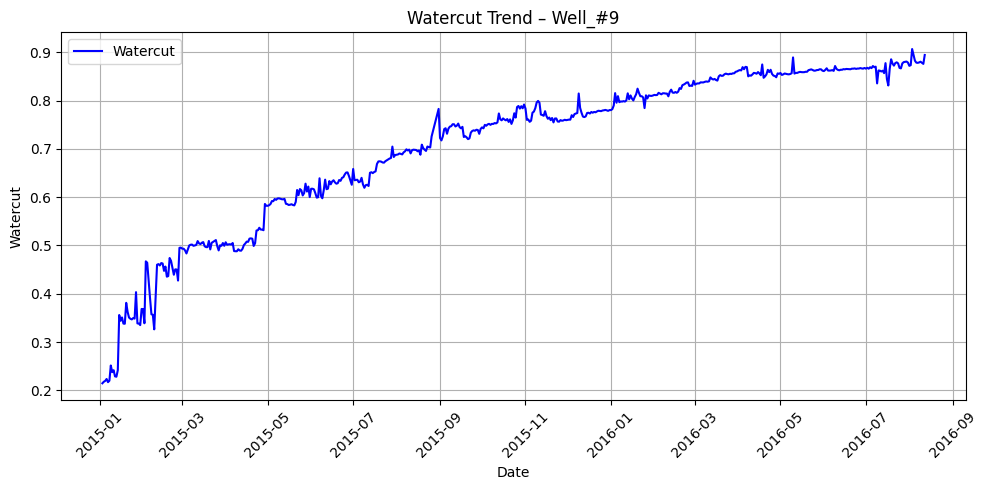

In [ ]:
#Filter data based on Active Total liquid production
act_liq_production = Well_data[Well_data['Watercut'] > 0]

# Plotting Watercut trend for a sample well
for name in Well_names:
  sample_well_name = name  # Change this to other wells in a loop if needed
  sample_well_data = act_liq_production[act_liq_production['WELL_NAME'] == sample_well_name].copy()

  plt.figure(figsize=(10, 5))
  plt.plot(sample_well_data['PROD_DATE'], sample_well_data['Watercut'], label='Watercut', color='blue')
  #plt.axhline(y=solution_gor, color='red', linestyle='--', label=f'Solution GOR: {solution_gor} SCF/BBL')
  plt.title(f"Watercut Trend – {sample_well_name}")
  plt.xlabel("Date")
  plt.ylabel("Watercut")
  plt.legend()
  plt.grid(True)
  plt.xticks(rotation=45)
  plt.tight_layout()
  plt.show()

In [ ]:
Merge_data = Merge_data.merge(watercut_trend_df, on='WELL_NAME', how='left')
Merge_data

,WELL_NAME,Max_BHFP,Reservoir Name,Initial Reservoir Pressure (PSI),Bubble Point Pressure (PSI),Current Average Reservoir Pressure (PSI),Solution Gas-Oil-Ratio (SCF/BBL),Formation Volume Factor (RB/STB),Pressure Difference,Reservoir Type,Well Type,Production Type,Formation GOR Trend,Watercut Trend
0,Well_#1,4096.0,JANI,4500.0,4300.0,4200.0,1000.0,1.30,104.0,Undersat,GL,Unsteady,aSolGOR,Incr
1,Well_#10,4051.0,JANI,4500.0,4300.0,4200.0,1000.0,1.30,149.0,Undersat,GL,Steady,aSolGOR,Combo
2,Well_#11,2521.0,DEPU,2800.0,2800.0,2400.0,1200.0,1.37,121.0,Saturated,GL,Unsteady,bSolGOR,Incr
3,Well_#12,2557.0,ACHI,3500.0,3300.0,2700.0,800.0,1.20,143.0,Undersat,NF,Unsteady,bSolGOR,Incr
4,Well_#13,2246.0,DEPU,2800.0,2800.0,2400.0,1200.0,1.37,154.0,Saturated,NF,Steady,aSolGOR,Flat
5,Well_#14,2857.0,MAKO,3500.0,3500.0,3000.0,500.0,1.15,143.0,Saturated,NF,Steady,bSolGOR,Combo
6,Well_#15,4032.0,KEMA,4200.0,4000.0,3900.0,600.0,1.45,132.0,Undersat,NF,Steady,aSolGOR,Combo
7,Well_#16,3836.0,KEMA,4200.0,4000.0,3900.0,600.0,1.45,64.0,Undersat,NF,Steady,aSolGOR,Flat
8,Well_#17,2304.0,DEPU,2800.0,2800.0,2400.0,1200.0,1.37,96.0,Saturated,GL,Steady,bSolGOR,Combo
9,Well_#18,2621.0,ACHI,3500.0,3300.0,2700.0,800.0,1.20,79.0,Undersat,NF,Unsteady,aSolGOR,Incr


In [ ]:
#Merge Watercut Trend to Extract
Extract = Extract.merge(watercut_trend_df, on='WELL_NAME', how='left')

In [ ]:
Extract.head()

,PROD_DATE,WELL_NAME,ON_STREAM_HRS,BOTTOMHOLE_FLOWING_PRESSURE (PSI),DOWNHOLE_TEMPERATURE (deg F),ANNULUS_PRESS (PSI),CHOKE_SIZE (%),WELL_HEAD_PRESSURE (PSI),WELL_HEAD_TEMPERATURE (deg F),CUMULATIVE_OIL_PROD (STB),...,Bubble Point Pressure (PSI),Current Average Reservoir Pressure (PSI),Solution Gas-Oil-Ratio (SCF/BBL),Formation Volume Factor (RB/STB),Pressure Difference,Reservoir Type,Well Type,Production Type,Formation GOR Trend,Watercut Trend
0,2014-02-15,Well_#1,0.0,4050.0,189.866,0.0,1.17951,482.460,50.864,0.0,...,4300.0,4200.0,1000.0,1.3,104.0,Undersat,GL,Unsteady,aSolGOR,Incr
1,2014-02-16,Well_#1,0.0,3961.0,189.945,0.0,2.99440,328.601,47.668,0.0,...,4300.0,4200.0,1000.0,1.3,104.0,Undersat,GL,Unsteady,aSolGOR,Incr
2,2014-02-17,Well_#1,0.0,3961.0,190.004,0.0,1.90349,387.218,48.962,0.0,...,4300.0,4200.0,1000.0,1.3,104.0,Undersat,GL,Unsteady,aSolGOR,Incr
3,2014-02-18,Well_#1,0.0,3964.0,190.020,0.0,0.00000,308.980,46.636,0.0,...,4300.0,4200.0,1000.0,1.3,104.0,Undersat,GL,Unsteady,aSolGOR,Incr
4,2014-02-19,Well_#1,0.0,3965.0,190.107,0.0,30.20760,196.057,47.297,0.0,...,4300.0,4200.0,1000.0,1.3,104.0,Undersat,GL,Unsteady,aSolGOR,Incr


In [ ]:
#convert Extract to csv
Extract.to_csv('Extract2.csv', index=False)

# Determine Productivity Index

In [ ]:
Well_data["PI Index"] = Extract["OIL RATE (STB/DAY)"] / (Extract["Current Average Reservoir Pressure (PSI)"] - Extract["BOTTOMHOLE_FLOWING_PRESSURE (PSI)"]
)
# Handle infinite/negative values (e.g., zero drawdown)
Well_data["PI Index"] = Well_data["PI Index"].replace([float('inf'), -float('inf')], 0).clip(lower=0)
Well_data["PI Index"].tail()

,PI Index
3544,4.475000
3545,4.044693
3546,3.942197
3547,4.786765
3548,0.000000


In [ ]:
Extract["PI Index"] = Well_data["PI Index"]


In [ ]:
#Trial 3 final
from scipy.stats import linregress

def classify_PI_trend(well_df):

    #Filter data based on Active oil production
    act_liq_production = well_df[well_df["PI Index"] > 0].copy()

    PI = act_liq_production['PI Index']

    # Smooth with rolling mean
    PI_smooth = PI.rolling(window=5, min_periods=1).mean()

    # Calculate the 10th and 90th percentiles
    lower_bound = PI.quantile(0.10)
    upper_bound = PI.quantile(0.90)

    # Filter the DataFrame to remove outliers
    PI_filtered = PI[PI <= upper_bound]

    # Calculate the standard deviation after filtering for outliers
    PI_std = PI_filtered.std()

    PI_smooth = PI_filtered.rolling(window=5, min_periods=1).mean()
    t = np.arange(len(PI_smooth))
    slope, _, r_value, _, _ = linregress(t, PI_smooth)


    # Detect local variability (combination trend)
    num_days = min(20,len(PI_smooth)//9)
    loc_slope = []
    for i in range(0,len(PI_smooth),num_days):
      local_val = PI_smooth.iloc[i:i+num_days]
      k = np.arange(len(local_val))
      if len(k) > 1:
          slope1, _, r_value, _, _ = linregress(k,local_val)
          loc_slope.append(slope1)
      else:
          loc_slope.append(np.nan) # Handle cases with less than 2 data points for linregress

    locc_slope = pd.Series(loc_slope)
    locc_slope.fillna(0, inplace=True)
    locc_slope

    ups = (locc_slope > 0.0001).sum()
    downs = (locc_slope < -0.0001).sum()
    neutral = (abs(locc_slope) < 0.00001).sum()
    total = len(locc_slope)

    if slope > 0:
      if PI_std < 0.1:
        return('Flat')
      elif abs(slope) < 0.00011:
        return('Flat')
      if ups/total > 0.25 and downs/total >= 0.2:
        return('Combo')
      elif neutral/total > 0.2 and ups/total > 0.3:
        return('Combo')
      elif ups/total >= 0.5:
          return('Incr')

    elif slope < 0:
      if PI_std < 0.1:
        return('Flat')
      elif abs(slope) < 0.00011:
        return('Flat')
      elif ups/total > 0.38 and downs/total >= 0.2:
        return('Combo')
      elif neutral/total > 0.2 and downs/total > 0.3:
        return('Combo')
      elif downs/total >= 0.5:
          return('Decr')

    elif neutral/total > 0.6:
        return('Flat')
    elif abs(slope) < 0.00011:
        return('Flat')

    return(ups/total,downs/total,neutral/total,total)

 # Apply to each well
trend_results = []
for well, group in Well_data.groupby('WELL_NAME'):
    group = group.sort_values('PROD_DATE')
    trend = classify_PI_trend(group)
    trend_results.append({'WELL_NAME': well, 'PI Trend': trend})

PI_trend_df = pd.DataFrame(trend_results)
print(PI_trend_df)

   WELL_NAME PI Trend
0    Well_#1     Decr
1   Well_#10    Combo
2   Well_#11    Combo
3   Well_#12     Decr
4   Well_#13    Combo
5   Well_#14     Decr
6   Well_#15    Combo
7   Well_#16    Combo
8   Well_#17    Combo
9   Well_#18    Combo
10  Well_#19    Combo
11   Well_#2    Combo
12  Well_#20     Decr
13   Well_#3     Decr
14   Well_#4    Combo
15   Well_#5     Decr
16   Well_#6     Flat
17   Well_#7     Decr
18   Well_#8    Combo
19   Well_#9    Combo


##Visualize PI Index Plot against Time

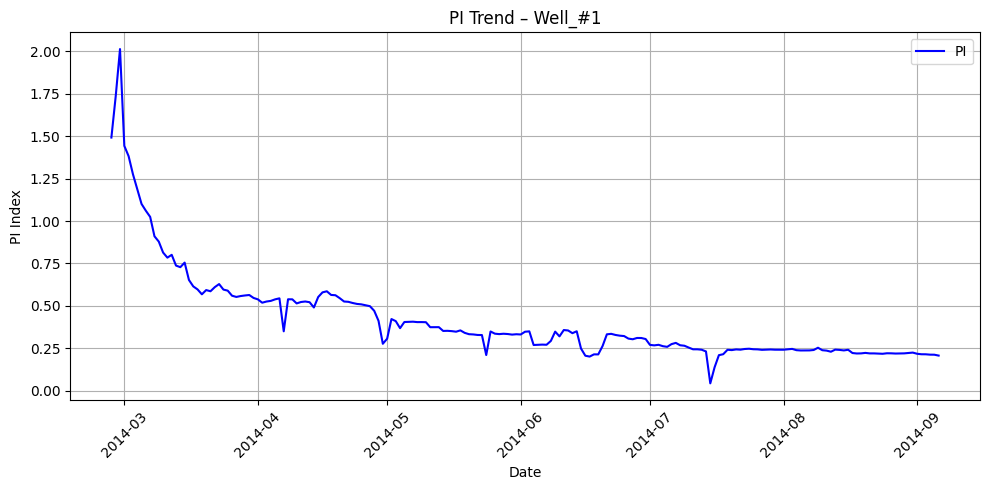

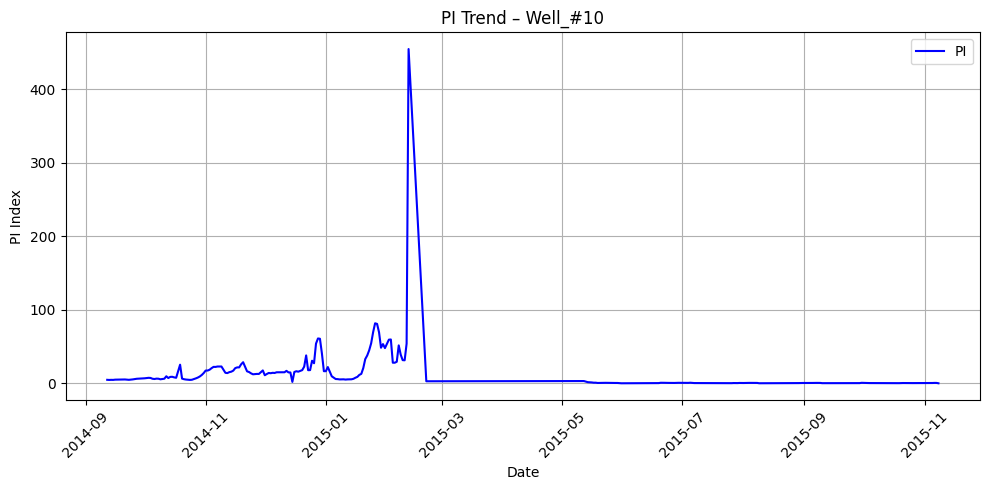

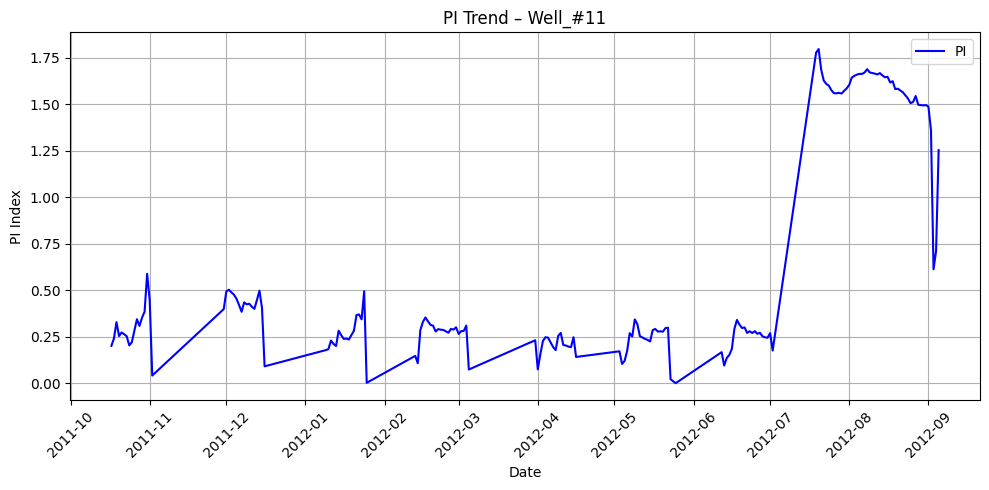

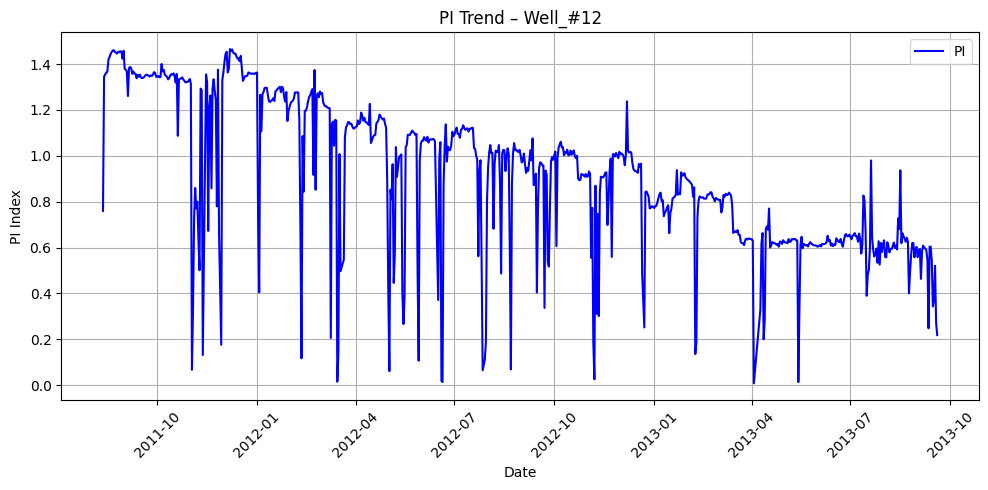

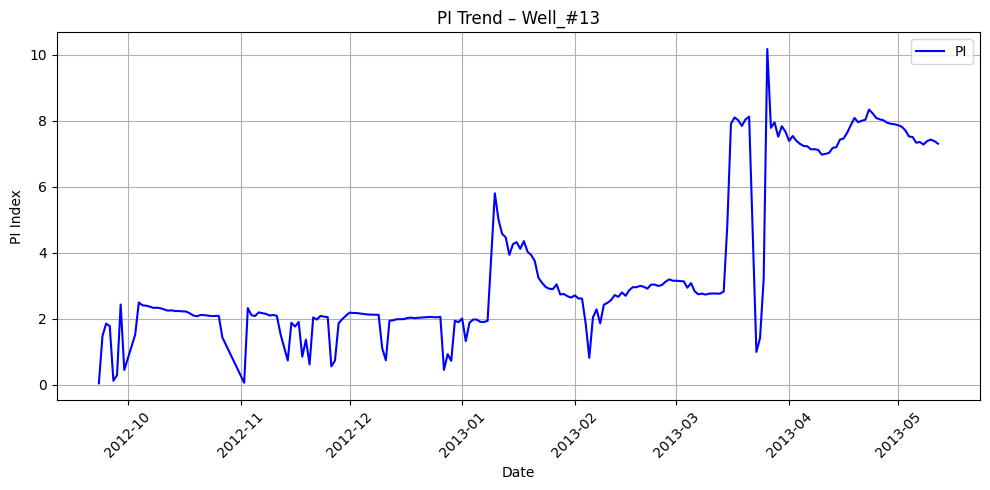

...

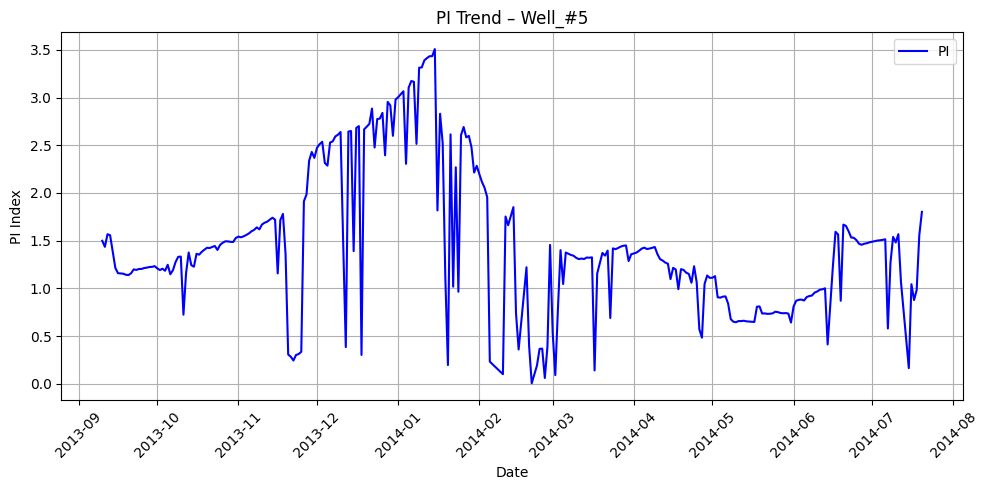

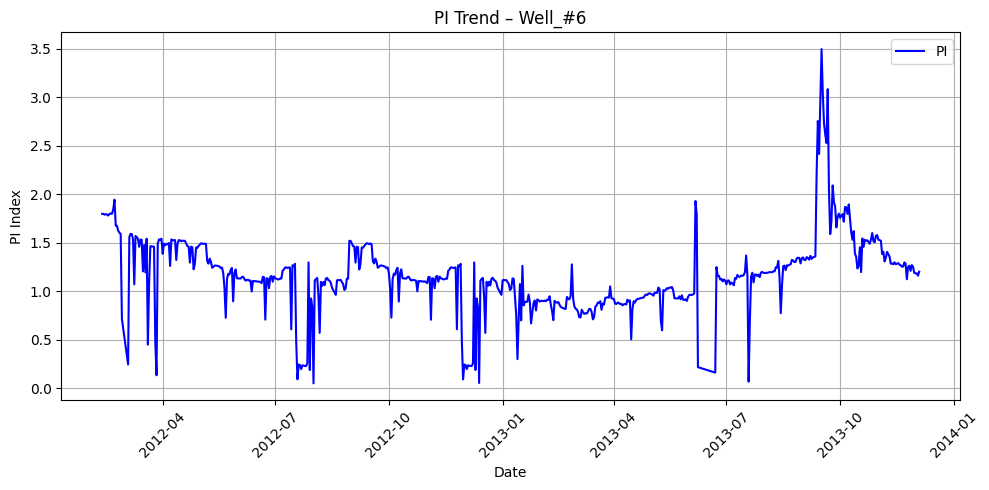

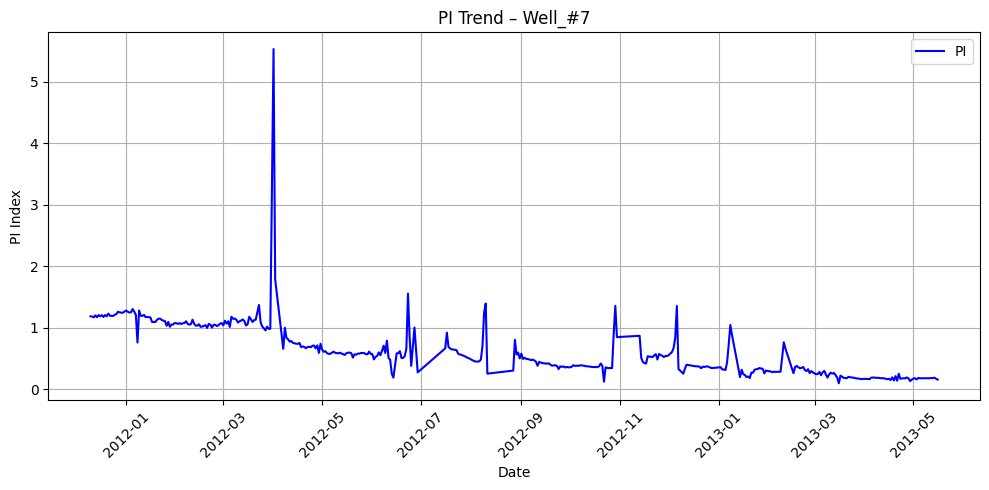

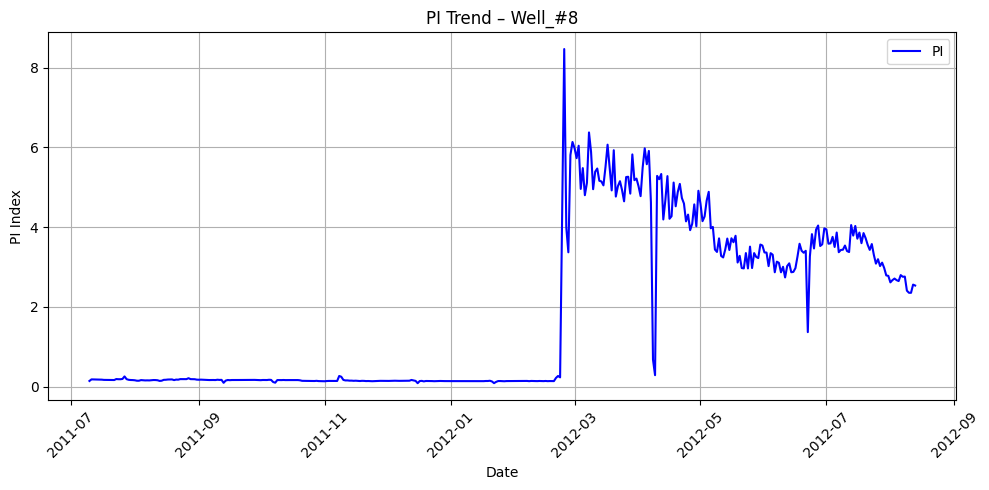

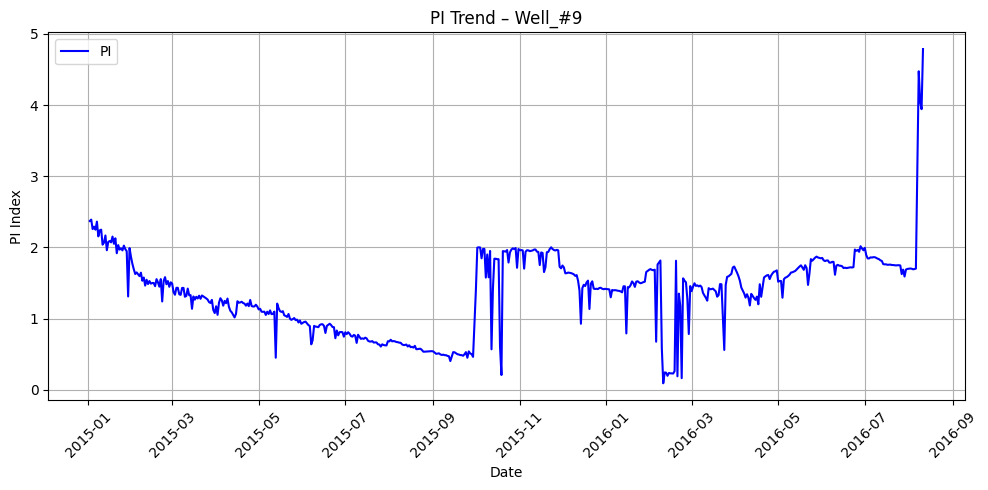

In [ ]:
#Filter data based on Active oil production
act_liq_production = Well_data[Well_data["PI Index"] > 0]

# Plotting Watercut trend for a sample well
for name in Well_names:
  sample_well_name = name  # Change this to other wells in a loop if needed
  sample_well_data = act_liq_production[act_liq_production['WELL_NAME'] == sample_well_name].copy()

  plt.figure(figsize=(10, 5))
  plt.plot(sample_well_data['PROD_DATE'], sample_well_data['PI Index'], label='PI', color='blue')
  #plt.axhline(y=solution_gor, color='red', linestyle='--', label=f'Solution GOR: {solution_gor} SCF/BBL')
  plt.title(f"PI Trend – {sample_well_name}")
  plt.xlabel("Date")
  plt.ylabel("PI Index")
  plt.legend()
  plt.grid(True)
  plt.xticks(rotation=45)
  plt.tight_layout()
  plt.show()

In [ ]:
Merge_data = Merge_data.merge(PI_trend_df, on='WELL_NAME', how='left')
Merge_data

,WELL_NAME,Max_BHFP,Reservoir Name,Initial Reservoir Pressure (PSI),Bubble Point Pressure (PSI),Current Average Reservoir Pressure (PSI),Solution Gas-Oil-Ratio (SCF/BBL),Formation Volume Factor (RB/STB),Pressure Difference,Reservoir Type,Well Type,Production Type,Formation GOR Trend,Watercut Trend,PI Trend
0,Well_#1,4096.0,JANI,4500.0,4300.0,4200.0,1000.0,1.30,104.0,Undersat,GL,Unsteady,aSolGOR,Incr,Decr
1,Well_#10,4051.0,JANI,4500.0,4300.0,4200.0,1000.0,1.30,149.0,Undersat,GL,Steady,aSolGOR,Combo,Combo
2,Well_#11,2521.0,DEPU,2800.0,2800.0,2400.0,1200.0,1.37,121.0,Saturated,GL,Unsteady,bSolGOR,Incr,Combo
3,Well_#12,2557.0,ACHI,3500.0,3300.0,2700.0,800.0,1.20,143.0,Undersat,NF,Unsteady,bSolGOR,Incr,Decr
4,Well_#13,2246.0,DEPU,2800.0,2800.0,2400.0,1200.0,1.37,154.0,Saturated,NF,Steady,aSolGOR,Flat,Combo
5,Well_#14,2857.0,MAKO,3500.0,3500.0,3000.0,500.0,1.15,143.0,Saturated,NF,Steady,bSolGOR,Combo,Decr
6,Well_#15,4032.0,KEMA,4200.0,4000.0,3900.0,600.0,1.45,132.0,Undersat,NF,Steady,aSolGOR,Combo,Combo
7,Well_#16,3836.0,KEMA,4200.0,4000.0,3900.0,600.0,1.45,64.0,Undersat,NF,Steady,aSolGOR,Flat,Combo
8,Well_#17,2304.0,DEPU,2800.0,2800.0,2400.0,1200.0,1.37,96.0,Saturated,GL,Steady,bSolGOR,Combo,Combo
9,Well_#18,2621.0,ACHI,3500.0,3300.0,2700.0,800.0,1.20,79.0,Undersat,NF,Unsteady,aSolGOR,Incr,Combo


In [ ]:
Merge_data.rename(columns={'PI Trend': 'Oil Productivity Index Trend'}, inplace=True)
Merge_data

,WELL_NAME,Max_BHFP,Reservoir Name,Initial Reservoir Pressure (PSI),Bubble Point Pressure (PSI),Current Average Reservoir Pressure (PSI),Solution Gas-Oil-Ratio (SCF/BBL),Formation Volume Factor (RB/STB),Pressure Difference,Reservoir Type,Well Type,Production Type,Formation GOR Trend,Watercut Trend,Oil Productivity Index Trend
0,Well_#1,4096.0,JANI,4500.0,4300.0,4200.0,1000.0,1.30,104.0,Undersat,GL,Unsteady,aSolGOR,Incr,Decr
1,Well_#10,4051.0,JANI,4500.0,4300.0,4200.0,1000.0,1.30,149.0,Undersat,GL,Steady,aSolGOR,Combo,Combo
2,Well_#11,2521.0,DEPU,2800.0,2800.0,2400.0,1200.0,1.37,121.0,Saturated,GL,Unsteady,bSolGOR,Incr,Combo
3,Well_#12,2557.0,ACHI,3500.0,3300.0,2700.0,800.0,1.20,143.0,Undersat,NF,Unsteady,bSolGOR,Incr,Decr
4,Well_#13,2246.0,DEPU,2800.0,2800.0,2400.0,1200.0,1.37,154.0,Saturated,NF,Steady,aSolGOR,Flat,Combo
5,Well_#14,2857.0,MAKO,3500.0,3500.0,3000.0,500.0,1.15,143.0,Saturated,NF,Steady,bSolGOR,Combo,Decr
6,Well_#15,4032.0,KEMA,4200.0,4000.0,3900.0,600.0,1.45,132.0,Undersat,NF,Steady,aSolGOR,Combo,Combo
7,Well_#16,3836.0,KEMA,4200.0,4000.0,3900.0,600.0,1.45,64.0,Undersat,NF,Steady,aSolGOR,Flat,Combo
8,Well_#17,2304.0,DEPU,2800.0,2800.0,2400.0,1200.0,1.37,96.0,Saturated,GL,Steady,bSolGOR,Combo,Combo
9,Well_#18,2621.0,ACHI,3500.0,3300.0,2700.0,800.0,1.20,79.0,Undersat,NF,Unsteady,aSolGOR,Incr,Combo


In [ ]:
Extract = Extract.merge(PI_trend_df, on='WELL_NAME', how='left')
Extract.head()

,PROD_DATE,WELL_NAME,ON_STREAM_HRS,BOTTOMHOLE_FLOWING_PRESSURE (PSI),DOWNHOLE_TEMPERATURE (deg F),ANNULUS_PRESS (PSI),CHOKE_SIZE (%),WELL_HEAD_PRESSURE (PSI),WELL_HEAD_TEMPERATURE (deg F),CUMULATIVE_OIL_PROD (STB),...,Solution Gas-Oil-Ratio (SCF/BBL),Formation Volume Factor (RB/STB),Pressure Difference,Reservoir Type,Well Type,Production Type,Formation GOR Trend,Watercut Trend,PI Index,PI Trend
0,2014-02-15,Well_#1,0.0,4050.0,189.866,0.0,1.17951,482.460,50.864,0.0,...,1000.0,1.3,104.0,Undersat,GL,Unsteady,aSolGOR,Incr,0.0,Decr
1,2014-02-16,Well_#1,0.0,3961.0,189.945,0.0,2.99440,328.601,47.668,0.0,...,1000.0,1.3,104.0,Undersat,GL,Unsteady,aSolGOR,Incr,0.0,Decr
2,2014-02-17,Well_#1,0.0,3961.0,190.004,0.0,1.90349,387.218,48.962,0.0,...,1000.0,1.3,104.0,Undersat,GL,Unsteady,aSolGOR,Incr,0.0,Decr
3,2014-02-18,Well_#1,0.0,3964.0,190.020,0.0,0.00000,308.980,46.636,0.0,...,1000.0,1.3,104.0,Undersat,GL,Unsteady,aSolGOR,Incr,0.0,Decr
4,2014-02-19,Well_#1,0.0,3965.0,190.107,0.0,30.20760,196.057,47.297,0.0,...,1000.0,1.3,104.0,Undersat,GL,Unsteady,aSolGOR,Incr,0.0,Decr


In [ ]:
Extract.to_csv('Extract4.csv', index=False)

#Calculate Total Reservoir Barrels

In [ ]:
# Calculate reservoir barrels for each well (total cumulative production)
total_reservoir_barrels = Extract.groupby(["Reservoir Name", "WELL_NAME"])["CUMULATIVE_OIL_PROD (STB)"].last().reset_index()

# Merge to get the Formation Volume Factor for each well
total_reservoir_barrels = total_reservoir_barrels.merge(
    Extract[["WELL_NAME", "Formation Volume Factor (RB/STB)"]].drop_duplicates(subset=['WELL_NAME']),
    on="WELL_NAME",
    how="left"
)

total_reservoir_barrels["Reservoir_Barrels"] = (
    total_reservoir_barrels["CUMULATIVE_OIL_PROD (STB)"] *
    total_reservoir_barrels["Formation Volume Factor (RB/STB)"]
)

# Sum reservoir barrels
reservoir_totals = total_reservoir_barrels.groupby("Reservoir Name")["Reservoir_Barrels"].sum().reset_index()
print(reservoir_totals)

  Reservoir Name  Reservoir_Barrels
0           ACHI         1299379.20
1           DEPU         1742334.49
2           JANI          283319.40
3           KEMA         1407791.95
4           MAKO         1110914.95


#Submission

In [ ]:
# Extract the numerical part of the well name and convert it to an integer
Merge_data['Well'] = Merge_data['WELL_NAME'].str.split('_#').str[1].astype(int)
display(Merge_data)

,WELL_NAME,Max_BHFP,Reservoir Name,Initial Reservoir Pressure (PSI),Bubble Point Pressure (PSI),Current Average Reservoir Pressure (PSI),Solution Gas-Oil-Ratio (SCF/BBL),Formation Volume Factor (RB/STB),Pressure Difference,Reservoir Type,Well Type,Production Type,Formation GOR Trend,Watercut Trend,Oil Productivity Index Trend,Well
0,Well_#1,4096.0,JANI,4500.0,4300.0,4200.0,1000.0,1.30,104.0,Undersat,GL,Unsteady,aSolGOR,Incr,Decr,1
1,Well_#10,4051.0,JANI,4500.0,4300.0,4200.0,1000.0,1.30,149.0,Undersat,GL,Steady,aSolGOR,Combo,Combo,10
2,Well_#11,2521.0,DEPU,2800.0,2800.0,2400.0,1200.0,1.37,121.0,Saturated,GL,Unsteady,bSolGOR,Incr,Combo,11
3,Well_#12,2557.0,ACHI,3500.0,3300.0,2700.0,800.0,1.20,143.0,Undersat,NF,Unsteady,bSolGOR,Incr,Decr,12
4,Well_#13,2246.0,DEPU,2800.0,2800.0,2400.0,1200.0,1.37,154.0,Saturated,NF,Steady,aSolGOR,Flat,Combo,13
5,Well_#14,2857.0,MAKO,3500.0,3500.0,3000.0,500.0,1.15,143.0,Saturated,NF,Steady,bSolGOR,Combo,Decr,14
6,Well_#15,4032.0,KEMA,4200.0,4000.0,3900.0,600.0,1.45,132.0,Undersat,NF,Steady,aSolGOR,Combo,Combo,15
7,Well_#16,3836.0,KEMA,4200.0,4000.0,3900.0,600.0,1.45,64.0,Undersat,NF,Steady,aSolGOR,Flat,Combo,16
8,Well_#17,2304.0,DEPU,2800.0,2800.0,2400.0,1200.0,1.37,96.0,Saturated,GL,Steady,bSolGOR,Combo,Combo,17
9,Well_#18,2621.0,ACHI,3500.0,3300.0,2700.0,800.0,1.20,79.0,Undersat,NF,Unsteady,aSolGOR,Incr,Combo,18


In [ ]:
Merge_data.sort_values(by='Well', inplace=True)
Merge_data.reset_index(drop=True, inplace=True)
Merge_data

,WELL_NAME,Max_BHFP,Reservoir Name,Initial Reservoir Pressure (PSI),Bubble Point Pressure (PSI),Current Average Reservoir Pressure (PSI),Solution Gas-Oil-Ratio (SCF/BBL),Formation Volume Factor (RB/STB),Pressure Difference,Reservoir Type,Well Type,Production Type,Formation GOR Trend,Watercut Trend,Oil Productivity Index Trend,Well
0,Well_#1,4096.0,JANI,4500.0,4300.0,4200.0,1000.0,1.30,104.0,Undersat,GL,Unsteady,aSolGOR,Incr,Decr,1
1,Well_#2,3735.0,KEMA,4200.0,4000.0,3900.0,600.0,1.45,165.0,Undersat,NF,Steady,Combo,Combo,Combo,2
2,Well_#3,2985.0,MAKO,3500.0,3500.0,3000.0,500.0,1.15,15.0,Saturated,GL,Unsteady,aSolGOR,Combo,Decr,3
3,Well_#4,2340.0,DEPU,2800.0,2800.0,2400.0,1200.0,1.37,60.0,Saturated,GL,Steady,aSolGOR,Combo,Combo,4
4,Well_#5,2933.0,MAKO,3500.0,3500.0,3000.0,500.0,1.15,67.0,Saturated,NF,Unsteady,aSolGOR,Incr,Decr,5
5,Well_#6,3797.0,KEMA,4200.0,4000.0,3900.0,600.0,1.45,103.0,Undersat,NF,Unsteady,aSolGOR,Flat,Flat,6
6,Well_#7,3821.0,KEMA,4200.0,4000.0,3900.0,600.0,1.45,79.0,Undersat,GL,Unsteady,aSolGOR,Incr,Decr,7
7,Well_#8,2681.0,ACHI,3500.0,3300.0,2700.0,800.0,1.20,19.0,Undersat,GL,Unsteady,aSolGOR,Combo,Combo,8
8,Well_#9,2333.0,DEPU,2800.0,2800.0,2400.0,1200.0,1.37,67.0,Saturated,GL,Unsteady,bSolGOR,Incr,Combo,9
9,Well_#10,4051.0,JANI,4500.0,4300.0,4200.0,1000.0,1.30,149.0,Undersat,GL,Steady,aSolGOR,Combo,Combo,10


In [ ]:
print(Merge_data.columns)

Index(['WELL_NAME', 'Max_BHFP', 'Reservoir Name',
       'Initial Reservoir Pressure (PSI)', 'Bubble Point Pressure (PSI)',
       'Current Average Reservoir Pressure (PSI)',
       'Solution Gas-Oil-Ratio (SCF/BBL)', 'Formation Volume Factor (RB/STB)',
       'Pressure Difference', 'Reservoir Type', 'Well Type', 'Production Type',
       'Formation GOR Trend', 'Watercut Trend', 'Oil Productivity Index Trend',
       'Well'],
      dtype='object')


In [ ]:
samplesub.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20 entries, 0 to 19
Data columns (total 8 columns):
 #   Column                  Non-Null Count  Dtype 
---  ------                  --------------  ----- 
 0   Well                    20 non-null     int64 
 1   Reservoir Name          1 non-null      object
 2   Reservoir Type          1 non-null      object
 3   Well Type               1 non-null      object
 4   Production Type         1 non-null      object
 5   Formation GOR Trend     1 non-null      object
 6   Watercut Trend          1 non-null      object
 7   Oil Productivity Index  1 non-null      object
dtypes: int64(1), object(7)
memory usage: 1.4+ KB


In [ ]:
samplesub['Well'] = samplesub['Well'].astype(int)

In [ ]:
samplesub['Reservoir Name'] = Merge_data['Reservoir Name']
samplesub['Reservoir Type'] = Merge_data['Reservoir Type']
samplesub['Well Type'] = Merge_data['Well Type']
samplesub['Production Type'] = Merge_data['Production Type']
samplesub['Formation GOR Trend'] = Merge_data['Formation GOR Trend']
samplesub['Watercut Trend'] = Merge_data['Watercut Trend']
samplesub['Oil Productivity Index Trend'] = Merge_data['Oil Productivity Index Trend']
samplesub.drop(columns=['Oil Productivity Index'], inplace=True)
samplesub

,Well,Reservoir Name,Reservoir Type,Well Type,Production Type,Formation GOR Trend,Watercut Trend,Oil Productivity Index Trend
0,1,JANI,Undersat,GL,Unsteady,aSolGOR,Incr,Decr
1,2,KEMA,Undersat,NF,Steady,Combo,Combo,Combo
2,3,MAKO,Saturated,GL,Unsteady,aSolGOR,Combo,Decr
3,4,DEPU,Saturated,GL,Steady,aSolGOR,Combo,Combo
4,5,MAKO,Saturated,NF,Unsteady,aSolGOR,Incr,Decr
5,6,KEMA,Undersat,NF,Unsteady,aSolGOR,Flat,Flat
6,7,KEMA,Undersat,GL,Unsteady,aSolGOR,Incr,Decr
7,8,ACHI,Undersat,GL,Unsteady,aSolGOR,Combo,Combo
8,9,DEPU,Saturated,GL,Unsteady,bSolGOR,Incr,Combo
9,10,JANI,Undersat,GL,Steady,aSolGOR,Combo,Combo


In [ ]:
#Create Submission File
samplesub.to_csv('PETRO-MODELLERS_DSEATS_Africa_2025_Classification.csv', index=False)

#Modelling

In [ ]:
Extract.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7955 entries, 0 to 7954
Data columns (total 34 columns):
 #   Column                                    Non-Null Count  Dtype         
---  ------                                    --------------  -----         
 0   PROD_DATE                                 7955 non-null   datetime64[ns]
 1   WELL_NAME                                 7955 non-null   object        
 2   ON_STREAM_HRS                             7955 non-null   float64       
 3   BOTTOMHOLE_FLOWING_PRESSURE (PSI)         7955 non-null   float64       
 4   DOWNHOLE_TEMPERATURE (deg F)              7955 non-null   float64       
 5   ANNULUS_PRESS (PSI)                       7955 non-null   float64       
 6   CHOKE_SIZE (%)                            7955 non-null   float64       
 7   WELL_HEAD_PRESSURE (PSI)                  7955 non-null   float64       
 8   WELL_HEAD_TEMPERATURE (deg F)             7955 non-null   float64       
 9   CUMULATIVE_OIL_PROD (STB)     

In [ ]:
Extract['PI Index'].fillna(0, inplace=True)

##**Classifying Reservoir Name**

In [ ]:
# Select Needed Features for Training and Testing
keep = ['PROD_DATE', 'WELL_NAME', 'ON_STREAM_HRS',
       'BOTTOMHOLE_FLOWING_PRESSURE (PSI)', 'DOWNHOLE_TEMPERATURE (deg F)',
       'ANNULUS_PRESS (PSI)', 'CHOKE_SIZE (%)', 'WELL_HEAD_PRESSURE (PSI)',
       'WELL_HEAD_TEMPERATURE (deg F)', 'CUMULATIVE_OIL_PROD (STB)',
       'CUMULATIVE_FORMATION_GAS_PROD (MSCF)',
       'CUMULATIVE_TOTAL_GAS_PROD (MSCF)', 'CUMULATIVE_WATER_PROD (BBL)',
       'OIL RATE (STB/DAY)', 'FORMATION GAS RATE (MSCF/DAY)',
       'GAS RATE (MSCF/DAY)', 'WATER RATE (BBL/DAY)', 'GOR (SCF/STB)',
       'Watercut', 'PI Index','Max_BHFP', 'Reservoir Name',
       'Initial Reservoir Pressure (PSI)', 'Bubble Point Pressure (PSI)',
       'Current Average Reservoir Pressure (PSI)',
       'Solution Gas-Oil-Ratio (SCF/BBL)', 'Formation Volume Factor (RB/STB)',
       'Pressure Difference', 'Reservoir Type', 'Well Type','Production Type',
       'Formation GOR Trend','Watercut Trend','PI Trend']

In [ ]:
# keep = ['PROD_DATE', 'WELL_NAME','BOTTOMHOLE_FLOWING_PRESSURE (PSI)','Max_BHFP','Initial Reservoir Pressure (PSI)','Bubble Point Pressure (PSI)',
#        'Current Average Reservoir Pressure (PSI)','Solution Gas-Oil-Ratio (SCF/BBL)','Formation Volume Factor (RB/STB)',
#         'Reservoir Name','Watercut Trend']

class1_data = Extract[keep]
class1_data.head()

,PROD_DATE,WELL_NAME,ON_STREAM_HRS,BOTTOMHOLE_FLOWING_PRESSURE (PSI),DOWNHOLE_TEMPERATURE (deg F),ANNULUS_PRESS (PSI),CHOKE_SIZE (%),WELL_HEAD_PRESSURE (PSI),WELL_HEAD_TEMPERATURE (deg F),CUMULATIVE_OIL_PROD (STB),...,Current Average Reservoir Pressure (PSI),Solution Gas-Oil-Ratio (SCF/BBL),Formation Volume Factor (RB/STB),Pressure Difference,Reservoir Type,Well Type,Production Type,Formation GOR Trend,Watercut Trend,PI Trend
0,2014-02-15,Well_#1,0.0,4050.0,189.866,0.0,1.17951,482.460,50.864,0.0,...,4200.0,1000.0,1.3,104.0,Undersat,GL,Unsteady,aSolGOR,Incr,Decr
1,2014-02-16,Well_#1,0.0,3961.0,189.945,0.0,2.99440,328.601,47.668,0.0,...,4200.0,1000.0,1.3,104.0,Undersat,GL,Unsteady,aSolGOR,Incr,Decr
2,2014-02-17,Well_#1,0.0,3961.0,190.004,0.0,1.90349,387.218,48.962,0.0,...,4200.0,1000.0,1.3,104.0,Undersat,GL,Unsteady,aSolGOR,Incr,Decr
3,2014-02-18,Well_#1,0.0,3964.0,190.020,0.0,0.00000,308.980,46.636,0.0,...,4200.0,1000.0,1.3,104.0,Undersat,GL,Unsteady,aSolGOR,Incr,Decr
4,2014-02-19,Well_#1,0.0,3965.0,190.107,0.0,30.20760,196.057,47.297,0.0,...,4200.0,1000.0,1.3,104.0,Undersat,GL,Unsteady,aSolGOR,Incr,Decr


In [ ]:
unique_wells = class1_data['WELL_NAME'].unique()
print(f"Unique wells: {unique_wells}")
print(f"Number of unique wells: {len(unique_wells)}")

Unique wells: ['Well_#1' 'Well_#10' 'Well_#11' 'Well_#12' 'Well_#13' 'Well_#14'
 'Well_#15' 'Well_#16' 'Well_#17' 'Well_#18' 'Well_#19' 'Well_#2'
 'Well_#20' 'Well_#3' 'Well_#4' 'Well_#5' 'Well_#6' 'Well_#7' 'Well_#8'
 'Well_#9']
Number of unique wells: 20


###Split Data into Train and Test

In [ ]:
from sklearn.model_selection import train_test_split

# Split the unique well names into training and testing sets
train_wells, test_wells = train_test_split(unique_wells, test_size=0.2, random_state=12)

print(f"Training wells: {train_wells}")
print(f"Number of training wells: {len(train_wells)}")
print(f"Testing wells: {test_wells}")
print(f"Number of testing wells: {len(test_wells)}")

Training wells: ['Well_#4' 'Well_#6' 'Well_#19' 'Well_#17' 'Well_#14' 'Well_#13'
 'Well_#10' 'Well_#8' 'Well_#1' 'Well_#20' 'Well_#5' 'Well_#12' 'Well_#11'
 'Well_#7' 'Well_#15' 'Well_#2']
Number of training wells: 16
Testing wells: ['Well_#9' 'Well_#3' 'Well_#18' 'Well_#16']
Number of testing wells: 4


In [ ]:
# Create training and testing dataframes
train_data = class1_data[class1_data['WELL_NAME'].isin(train_wells)]
test_data = class1_data[class1_data['WELL_NAME'].isin(test_wells)]

In [ ]:
print("Shape of training data:", train_data.shape)
print("Shape of testing data:", test_data.shape)

Shape of training data: (6643, 34)
Shape of testing data: (1312, 34)


In [ ]:
col_to_drop = ["WELL_NAME","PROD_DATE","Reservoir Name",'Reservoir Type', 'Well Type', 'Production Type',
       'Formation GOR Trend', 'Watercut Trend','PI Trend']
target = ['Reservoir Name','Reservoir Type', 'Well Type', 'Production Type',
       'Formation GOR Trend','Watercut Trend','PI Trend']

In [ ]:
X_train= train_data.drop(col_to_drop, axis=1)
Y_train = train_data[target]

X_test= test_data.drop(col_to_drop, axis=1)
Y_test = test_data[target]

In [ ]:
#Check Distribution
Y_train['Reservoir Name'].value_counts(normalize=True)

,proportion
Reservoir Name,
KEMA,0.336745
MAKO,0.198404
DEPU,0.197802
ACHI,0.172061
JANI,0.094987


In [ ]:
Y_test["Reservoir Name"].value_counts(normalize=True)

,proportion
Reservoir Name,
DEPU,0.443598
ACHI,0.237805
KEMA,0.224085
MAKO,0.094512


###Model

In [ ]:
!pip install catboost

In [ ]:
from catboost import CatBoostClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, classification_report, log_loss, confusion_matrix

In [ ]:
# Initializing and training the CatBoostClassifier
classifier = CatBoostClassifier(loss_function='MultiClass', learning_rate=0.01, use_best_model=False, eval_metric='MultiClass')
classifier.fit(X_train, Y_train['Reservoir Name'], early_stopping_rounds=100, verbose=100)

In [ ]:
# Make predictions on the test data
Y_pred = classifier.predict(X_train)

# Evaluate the model
accuracy = accuracy_score(Y_train['Reservoir Name'], Y_pred)
print(f"Accuracy: {accuracy}")

# Display classification report
print("\nClassification Report:")
print(classification_report(Y_train['Reservoir Name'], Y_pred))

# Display confusion matrix
print("\nConfusion Matrix:")
print(confusion_matrix(Y_train['Reservoir Name'], Y_pred))

In [ ]:
# Make predictions on the test data
Y_pred = classifier.predict(X_test)

# Evaluate the model
accuracy = accuracy_score(Y_test['Reservoir Name'], Y_pred)
print(f"Accuracy: {accuracy}")

# Display classification report
print("\nClassification Report:")
print(classification_report(Y_test['Reservoir Name'], Y_pred))

# Display confusion matrix
print("\nConfusion Matrix:")
print(confusion_matrix(Y_test['Reservoir Name'], Y_pred))

In [ ]:
unique_y_test = Y_test['Reservoir Name'].unique()
unique_y_test.sort()
print(unique_y_test)

In [ ]:
# Predicting probabilities for log loss calculation
Y_pred_proba = classifier.predict_proba(X_test)
print("Log Loss:", log_loss(Y_test['Reservoir Name'], Y_pred_proba, labels=classifier.classes_))

In [ ]:
# Confusion matrix
cm = confusion_matrix(Y_test['Reservoir Name'], Y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=unique_y_test, yticklabels=unique_y_test)
plt.title('Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

###Feature Importance
Plotting feature importances to understand which features the model found most useful

In [ ]:
# Get the feature importances from the classifier
feature_importances = pd.Series(classifier.feature_importances_, index=X_train.columns)

# Sort the feature importances and select the top 20
top_20_features = feature_importances.sort_values(ascending=False).head(20)

# Plot the top 20 feature importances
top_20_features.sort_values().plot(kind='barh', figsize=(10, 8))
plt.title('Top 20 Feature Importances')
plt.show()

##**Classifying Reservoir Type**

###Split Data into Train and Test

In [ ]:
from sklearn.model_selection import train_test_split

# Split the unique well names into training and testing sets
train_wells, test_wells = train_test_split(unique_wells, test_size=0.2, random_state=12)

print(f"Training wells: {train_wells}")
print(f"Number of training wells: {len(train_wells)}")
print(f"Testing wells: {test_wells}")
print(f"Number of testing wells: {len(test_wells)}")

In [ ]:
# Create training and testing dataframes
train_data = class1_data[class1_data['WELL_NAME'].isin(train_wells)]
test_data = class1_data[class1_data['WELL_NAME'].isin(test_wells)]

In [ ]:
print("Shape of training data:", train_data.shape)
print("Shape of testing data:", test_data.shape)

In [ ]:
col_to_drop = ["WELL_NAME","PROD_DATE","Reservoir Name",'Reservoir Type', 'Well Type', 'Production Type',
       'Formation GOR Trend', 'Watercut Trend','PI Trend']
target = ['Reservoir Name','Reservoir Type', 'Well Type', 'Production Type',
       'Formation GOR Trend','Watercut Trend','PI Trend']

In [ ]:
X_train= train_data.drop(col_to_drop, axis=1)
Y_train = train_data[target]

X_test= test_data.drop(col_to_drop, axis=1)
Y_test = test_data[target]

In [ ]:
#Check Distribution
Y_train['Reservoir Type'].value_counts(normalize=True)

In [ ]:
Y_test["Reservoir Type"].value_counts(normalize=True)

In [ ]:
from sklearn.preprocessing import minmax_scale

# Normalize the features
Xn_train = minmax_scale(X_train)
Xn_test = minmax_scale(X_test)
Xn_train = pd.DataFrame(Xn_train, columns=X_train.columns)
Xn_test = pd.DataFrame(Xn_test, columns=X_test.columns)

###Model

In [ ]:
from catboost import CatBoostClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, classification_report, log_loss, confusion_matrix

In [ ]:
# Initializing and training the CatBoostClassifier
classifier = CatBoostClassifier(loss_function='Logloss', learning_rate=0.001, use_best_model=False, eval_metric='Logloss')
classifier.fit(Xn_train, Y_train['Reservoir Type'], early_stopping_rounds=100, verbose=100)

In [ ]:
# Make predictions on the train data
Y_pred = classifier.predict(Xn_train)

# Evaluate the model
accuracy = accuracy_score(Y_train['Reservoir Type'], Y_pred)
print(f"Accuracy: {accuracy}")

# Display classification report
print("\nClassification Report:")
print(classification_report(Y_train['Reservoir Type'], Y_pred))

# Display confusion matrix
print("\nConfusion Matrix:")
print(confusion_matrix(Y_train['Reservoir Type'], Y_pred))

In [ ]:
# Make predictions on the test data
Y_pred = classifier.predict(Xn_test)

# Evaluate the model
accuracy = accuracy_score(Y_test['Reservoir Type'], Y_pred)
print(f"Accuracy: {accuracy}")

# Display classification report
print("\nClassification Report:")
print(classification_report(Y_test['Reservoir Type'], Y_pred))

# Display confusion matrix
print("\nConfusion Matrix:")
print(confusion_matrix(Y_test['Reservoir Type'], Y_pred))

In [ ]:
unique_y_test = Y_test['Reservoir Type'].unique()
unique_y_test.sort()
# Confusion matrix
cm = confusion_matrix(Y_test['Reservoir Type'], Y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=unique_y_test, yticklabels=unique_y_test)
plt.title('Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

###Feature Importance
Plotting feature importances to understand which features the model found most useful

In [ ]:
# Get the feature importances from the classifier
feature_importances = pd.Series(classifier.feature_importances_, index=Xn_train.columns)

# Sort the feature importances and select the top 20
top_20_features = feature_importances.sort_values(ascending=False).head(20)

# Plot the top 20 feature importances
top_20_features.sort_values().plot(kind='barh', figsize=(10, 8))
plt.title('Top 20 Feature Importances')
plt.show()

##**Classifying Well Type**

###Split Data into Train and Test

In [ ]:
from sklearn.model_selection import train_test_split

# Split the unique well names into training and testing sets
train_wells, test_wells = train_test_split(unique_wells, test_size=0.2, random_state=12)

print(f"Training wells: {train_wells}")
print(f"Number of training wells: {len(train_wells)}")
print(f"Testing wells: {test_wells}")
print(f"Number of testing wells: {len(test_wells)}")

In [ ]:
# Create training and testing dataframes
train_data = class1_data[class1_data['WELL_NAME'].isin(train_wells)]
test_data = class1_data[class1_data['WELL_NAME'].isin(test_wells)]

In [ ]:
print("Shape of training data:", train_data.shape)
print("Shape of testing data:", test_data.shape)

In [ ]:
col_to_drop = ["WELL_NAME","PROD_DATE","Reservoir Name",'Reservoir Type', 'Well Type', 'Production Type',
       'Formation GOR Trend', 'Watercut Trend','PI Trend']
target = ['Reservoir Name','Reservoir Type', 'Well Type', 'Production Type',
       'Formation GOR Trend','Watercut Trend','PI Trend']

In [ ]:
X_train= train_data.drop(col_to_drop, axis=1)
Y_train = train_data[target]

X_test= test_data.drop(col_to_drop, axis=1)
Y_test = test_data[target]

In [ ]:
#Check Distribution
Y_train['Well Type'].value_counts(normalize=True)

In [ ]:
Y_test["Well Type"].value_counts(normalize=True)

In [ ]:
from sklearn.preprocessing import minmax_scale

# Normalize the features
Xn_train = minmax_scale(X_train)
Xn_test = minmax_scale(X_test)
Xn_train = pd.DataFrame(Xn_train, columns=X_train.columns)
Xn_test = pd.DataFrame(Xn_test, columns=X_test.columns)

###Model

In [ ]:
from catboost import CatBoostClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, classification_report, log_loss, confusion_matrix

In [ ]:
# Initializing and training the CatBoostClassifier
classifier = CatBoostClassifier(loss_function='Logloss', learning_rate=0.001, use_best_model=False, eval_metric='Logloss')
classifier.fit(Xn_train, Y_train['Well Type'], early_stopping_rounds=100, verbose=100)

In [ ]:
# Make predictions on the train data
Y_pred = classifier.predict(Xn_train)

# Evaluate the model
accuracy = accuracy_score(Y_train['Well Type'], Y_pred)
print(f"Accuracy: {accuracy}")

# Display classification report
print("\nClassification Report:")
print(classification_report(Y_train['Well Type'], Y_pred))

# Display confusion matrix
print("\nConfusion Matrix:")
print(confusion_matrix(Y_train['Well Type'], Y_pred))

In [ ]:
# Make predictions on the test data
Y_pred = classifier.predict(Xn_test)

# Evaluate the model
accuracy = accuracy_score(Y_test['Well Type'], Y_pred)
print(f"Accuracy: {accuracy}")

# Display classification report
print("\nClassification Report:")
print(classification_report(Y_test['Well Type'], Y_pred))

# Display confusion matrix
print("\nConfusion Matrix:")
print(confusion_matrix(Y_test['Well Type'], Y_pred))

In [ ]:
unique_y_test = Y_test['Well Type'].unique()
unique_y_test.sort()
# Confusion matrix
cm = confusion_matrix(Y_test['Well Type'], Y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=unique_y_test, yticklabels=unique_y_test)
plt.title('Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

###Feature Importance
Plotting feature importances to understand which features the model found most useful

In [ ]:
# Get the feature importances from the classifier
feature_importances = pd.Series(classifier.feature_importances_, index=Xn_train.columns)

# Sort the feature importances and select the top 20
top_20_features = feature_importances.sort_values(ascending=False).head(20)

# Plot the top 20 feature importances
top_20_features.sort_values().plot(kind='barh', figsize=(10, 8))
plt.title('Top 20 Feature Importances')
plt.show()

##**Classifying Production Type**

###Feature Engineering

In [ ]:
# Apply to each well and calculate rolling trends and statistics
trend_data_list = []
for well, group in class1_data.groupby('WELL_NAME'):
    group = group.sort_values('PROD_DATE')

    # Calculate rolling trend slopes
    # group['PI_Trend_Slope_5'] = group['PI Index'].rolling(window=5).apply(lambda x: np.polyfit(range(len(x)), x, 1)[0], raw=True)
    # group['PI_Trend_Slope_10'] = group['PI Index'].rolling(window=10).apply(lambda x: np.polyfit(range(len(x)), x, 1)[0], raw=True)
    # group['PI_Trend_Slope_20'] = group['PI Index'].rolling(window=20).apply(lambda x: np.polyfit(range(len(x)), x, 1)[0], raw=True)

    # Calculate other statistics for the entire well
    Watercut_std = group['Watercut'].std()
    Watercut_mean = group['Watercut'].mean()
    Watercut_max = group['Watercut'].max()
    Watercut_min = group['Watercut'].min()
    PI_std = group['PI Index'].std()
    PI_mean = group['PI Index'].mean()
    PI_max = group['PI Index'].max()
    PI_min = group['PI Index'].min()
    GOR_std = group['GOR (SCF/STB)'].std()
    GOR_mean = group['GOR (SCF/STB)'].mean()
    GOR_max = group['GOR (SCF/STB)'].max()
    GOR_min = group['GOR (SCF/STB)'].min()

    # Add well stats as new columns to the group DataFrame
    group['GOR_std'] = GOR_std
    group['GOR_mean'] = GOR_mean
    group['GOR_max'] = GOR_max
    group['GOR_min'] = GOR_min
    group['Watercut_std'] = Watercut_std
    group['Watercut_mean'] = Watercut_mean
    group['Watercut_max'] = Watercut_max
    group['Watercut_min'] = Watercut_min
    group['Water_rate_min'] = group['WATER RATE (BBL/DAY)'].min()
    group['Water_rate_max'] = group['WATER RATE (BBL/DAY)'].max()
    group['Water_rate_mean'] = group['WATER RATE (BBL/DAY)'].mean()
    group['Water_rate_std'] = group['WATER RATE (BBL/DAY)'].std()
    group['Oil_rate_min'] = group['OIL RATE (STB/DAY)'].min()
    group['Oil_rate_max'] = group['OIL RATE (STB/DAY)'].max()
    group['Oil_rate_mean'] = group['OIL RATE (STB/DAY)'].mean()
    group['Oil_rate_std'] = group['OIL RATE (STB/DAY)'].std()
    group['Gas_rate_min'] = group['GAS RATE (MSCF/DAY)'].min()
    group['Gas_rate_max'] = group['GAS RATE (MSCF/DAY)'].max()
    group['Gas_rate_mean'] = group['GAS RATE (MSCF/DAY)'].mean()
    group['Gas_rate_std'] = group['GAS RATE (MSCF/DAY)'].std()
    group['PI_std'] = PI_std
    group['PI_mean'] = PI_mean
    group['PI_max'] = PI_max
    group['PI_min'] = PI_min

    #create time based variables
    group['year'] = pd.to_datetime(group['PROD_DATE']).dt.year
    group['month'] = pd.to_datetime(group['PROD_DATE']).dt.month



    trend_data_list.append(group)

# Concatenate the dataframes for each well back into a single dataframe
class1_data_with_trends = pd.concat(trend_data_list)

display(class1_data_with_trends.head())

In [ ]:
class1_data_with_trends.fillna(0, inplace=True)
class1_data_with_trends.info()

In [ ]:
class1_data_with_trends.columns

In [ ]:
unique_wells = class1_data_with_trends['WELL_NAME'].unique()
print(f"Unique wells: {unique_wells}")
print(f"Number of unique wells: {len(unique_wells)}")

###Split Data into Train and Test

In [ ]:
from sklearn.model_selection import train_test_split

# Split the unique well names into training and testing sets
train_wells, test_wells = train_test_split(unique_wells, test_size=0.2, random_state=2)

print(f"Training wells: {train_wells}")
print(f"Number of training wells: {len(train_wells)}")
print(f"Testing wells: {test_wells}")
print(f"Number of testing wells: {len(test_wells)}")

In [ ]:
# Create training and testing dataframes
train_data = class1_data_with_trends[class1_data['WELL_NAME'].isin(train_wells)]
test_data = class1_data_with_trends[class1_data['WELL_NAME'].isin(test_wells)]

In [ ]:
col_to_drop = ["WELL_NAME","PROD_DATE","Reservoir Name",'Reservoir Type', 'Well Type', 'Production Type',
       'Formation GOR Trend', 'Watercut Trend','PI Trend']
target = ['Reservoir Name','Reservoir Type', 'Well Type', 'Production Type',
       'Formation GOR Trend','Watercut Trend','PI Trend']

In [ ]:
X_train= train_data.drop(col_to_drop, axis=1)
Y_train = train_data[target]

X_test= test_data.drop(col_to_drop, axis=1)
Y_test = test_data[target]

In [ ]:
X_train.columns

In [ ]:
cl_keep = ['ON_STREAM_HRS', 'BOTTOMHOLE_FLOWING_PRESSURE (PSI)',
       'DOWNHOLE_TEMPERATURE (deg F)', 'ANNULUS_PRESS (PSI)', 'CHOKE_SIZE (%)',
       'WELL_HEAD_PRESSURE (PSI)', 'WELL_HEAD_TEMPERATURE (deg F)',
       'CUMULATIVE_OIL_PROD (STB)', 'CUMULATIVE_FORMATION_GAS_PROD (MSCF)',
       'CUMULATIVE_TOTAL_GAS_PROD (MSCF)', 'CUMULATIVE_WATER_PROD (BBL)',
       'OIL RATE (STB/DAY)', 'FORMATION GAS RATE (MSCF/DAY)',
       'GAS RATE (MSCF/DAY)', 'WATER RATE (BBL/DAY)', 'GOR (SCF/STB)',
       'Watercut', 'PI Index', 'Max_BHFP', 'Initial Reservoir Pressure (PSI)',
       'Bubble Point Pressure (PSI)',
       'Current Average Reservoir Pressure (PSI)',
       'Solution Gas-Oil-Ratio (SCF/BBL)', 'Formation Volume Factor (RB/STB)',
       'Pressure Difference', 'GOR_std', 'GOR_mean', 'GOR_max', 'GOR_min',
       'Watercut_std', 'Watercut_mean', 'Watercut_max', 'Watercut_min',
       'Water_rate_min', 'Water_rate_max', 'Water_rate_mean', 'Water_rate_std',
       'Oil_rate_min', 'Oil_rate_max', 'Oil_rate_mean', 'Oil_rate_std',
       'Gas_rate_min', 'Gas_rate_max', 'Gas_rate_mean', 'Gas_rate_std',
       'PI_std', 'PI_mean', 'PI_max', 'PI_min', 'year', 'month']

In [ ]:
Y_train['Production Type'].value_counts(normalize=True)

In [ ]:
Y_test['Production Type'].value_counts(normalize=True)

In [ ]:
from sklearn.preprocessing import minmax_scale

# Normalize the features
Xn_train = minmax_scale(X_train)
Xn_test = minmax_scale(X_test)
Xn_train = pd.DataFrame(Xn_train, columns=X_train.columns)
Xn_test = pd.DataFrame(Xn_test, columns=X_test.columns)

In [ ]:
# Xn_train['GOR_watercut_Ratio'] = Xn_train['GOR (SCF/STB)'] / Xn_train['Watercut']
# Xn_test['GOR_watercut_Ratio'] = Xn_test['GOR (SCF/STB)'] / Xn_test['Watercut']

In [ ]:
# Initializing and training the CatBoostClassifier
classifier = CatBoostClassifier(loss_function='Logloss', learning_rate=0.001, use_best_model=False, eval_metric='Logloss')
classifier.fit(Xn_train[cl_keep], Y_train['Production Type'], early_stopping_rounds=100, verbose=100)

In [ ]:
# Make predictions on the train data
Y_pred = classifier.predict(Xn_train[cl_keep])

# Evaluate the model
accuracy = accuracy_score(Y_train['Production Type'], Y_pred)
print(f"Accuracy: {accuracy}")

# Display classification report
print("\nClassification Report:")
print(classification_report(Y_train['Production Type'], Y_pred))

# Display confusion matrix
print("\nConfusion Matrix:")
print(confusion_matrix(Y_train['Production Type'], Y_pred))

In [ ]:
# Make predictions on the test data
Y_pred = classifier.predict(Xn_test[cl_keep])

# Evaluate the model
accuracy = accuracy_score(Y_test['Production Type'], Y_pred)
print(f"Accuracy: {accuracy}")

# Display classification report
print("\nClassification Report:")
print(classification_report(Y_test['Production Type'], Y_pred))

# Display confusion matrix
print("\nConfusion Matrix:")
print(confusion_matrix(Y_test['Production Type'], Y_pred))

In [ ]:
unique_y_test = Y_test['Production Type'].unique()
unique_y_test.sort()
# Confusion matrix
cm = confusion_matrix(Y_test['Production Type'], Y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=unique_y_test, yticklabels=unique_y_test)
plt.title('Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

###Check feature importance

In [ ]:
# Get the feature importances from the classifier
feature_importances = pd.Series(classifier.feature_importances_, index=Xn_train[cl_keep].columns)

# Sort the feature importances and select the top 30
top_30_features = feature_importances.sort_values(ascending=False).head(30)

# Plot the top 30 feature importances
top_30_features.sort_values().plot(kind='barh', figsize=(10, 8))
plt.title('Top 30 Feature Importances')
plt.show()

##**Classifying Formation GOR Trend**

###Feature Engineering

In [ ]:
# Apply to each well and calculate rolling trends and statistics
trend_data_list = []
for well, group in class1_data.groupby('WELL_NAME'):
    group = group.sort_values('PROD_DATE')

    # Calculate rolling trend slopes
    group['GOR_Trend_Slope_5'] = group['PI Index'].rolling(window=5).apply(lambda x: np.polyfit(range(len(x)), x, 1)[0], raw=True)
    group['GOR_Trend_Slope_10'] = group['PI Index'].rolling(window=10).apply(lambda x: np.polyfit(range(len(x)), x, 1)[0], raw=True)
    group['GOR_Trend_Slope_20'] = group['PI Index'].rolling(window=20).apply(lambda x: np.polyfit(range(len(x)), x, 1)[0], raw=True)

    # Calculate other statistics for the entire well
    Watercut_std = group['Watercut'].std()
    Watercut_mean = group['Watercut'].mean()
    Watercut_max = group['Watercut'].max()
    Watercut_min = group['Watercut'].min()
    PI_std = group['PI Index'].std()
    PI_mean = group['PI Index'].mean()
    PI_max = group['PI Index'].max()
    PI_min = group['PI Index'].min()
    GOR_std = group['GOR (SCF/STB)'].std()
    GOR_mean = group['GOR (SCF/STB)'].mean()
    GOR_max = group['GOR (SCF/STB)'].max()
    GOR_min = group['GOR (SCF/STB)'].min()

    # Add well stats as new columns to the group DataFrame
    group['GOR_std'] = GOR_std
    group['GOR_mean'] = GOR_mean
    group['GOR_max'] = GOR_max
    group['GOR_min'] = GOR_min
    group['Watercut_std'] = Watercut_std
    group['Watercut_mean'] = Watercut_mean
    group['Watercut_max'] = Watercut_max
    group['Watercut_min'] = Watercut_min
    group['Water_rate_min'] = group['WATER RATE (BBL/DAY)'].min()
    group['Water_rate_max'] = group['WATER RATE (BBL/DAY)'].max()
    group['Water_rate_mean'] = group['WATER RATE (BBL/DAY)'].mean()
    group['Water_rate_std'] = group['WATER RATE (BBL/DAY)'].std()
    group['Oil_rate_min'] = group['OIL RATE (STB/DAY)'].min()
    group['Oil_rate_max'] = group['OIL RATE (STB/DAY)'].max()
    group['Oil_rate_mean'] = group['OIL RATE (STB/DAY)'].mean()
    group['Oil_rate_std'] = group['OIL RATE (STB/DAY)'].std()
    group['Gas_rate_min'] = group['GAS RATE (MSCF/DAY)'].min()
    group['Gas_rate_max'] = group['GAS RATE (MSCF/DAY)'].max()
    group['Gas_rate_mean'] = group['GAS RATE (MSCF/DAY)'].mean()
    group['Gas_rate_std'] = group['GAS RATE (MSCF/DAY)'].std()
    group['PI_std'] = PI_std
    group['PI_mean'] = PI_mean
    group['PI_max'] = PI_max
    group['PI_min'] = PI_min

    #create time based variables
    group['year'] = pd.to_datetime(group['PROD_DATE']).dt.year
    group['month'] = pd.to_datetime(group['PROD_DATE']).dt.month



    trend_data_list.append(group)

# Concatenate the dataframes for each well back into a single dataframe
class1_data_with_trends = pd.concat(trend_data_list)

display(class1_data_with_trends.head())

In [ ]:
class1_data_with_trends.fillna(0, inplace=True)
class1_data_with_trends.info()

In [ ]:
class1_data_with_trends.columns

In [ ]:
unique_wells = class1_data_with_trends['WELL_NAME'].unique()
print(f"Unique wells: {unique_wells}")
print(f"Number of unique wells: {len(unique_wells)}")

###Split Data into Train and Test

In [ ]:
from sklearn.model_selection import train_test_split

# Split the unique well names into training and testing sets
train_wells, test_wells = train_test_split(unique_wells, test_size=0.2, random_state=12)

print(f"Training wells: {train_wells}")
print(f"Number of training wells: {len(train_wells)}")
print(f"Testing wells: {test_wells}")
print(f"Number of testing wells: {len(test_wells)}")

In [ ]:
# Create training and testing dataframes
train_data = class1_data_with_trends[class1_data['WELL_NAME'].isin(train_wells)]
test_data = class1_data_with_trends[class1_data['WELL_NAME'].isin(test_wells)]

In [ ]:
col_to_drop = ["WELL_NAME","PROD_DATE","Reservoir Name",'Reservoir Type', 'Well Type', 'Production Type',
       'Formation GOR Trend', 'Watercut Trend','PI Trend']
target = ['Reservoir Name','Reservoir Type', 'Well Type', 'Production Type',
       'Formation GOR Trend','Watercut Trend','PI Trend']

In [ ]:
X_train= train_data.drop(col_to_drop, axis=1)
Y_train = train_data[target]

X_test= test_data.drop(col_to_drop, axis=1)
Y_test = test_data[target]

In [ ]:
X_train.columns

In [ ]:
cl_keep = ['OIL RATE (STB/DAY)', 'FORMATION GAS RATE (MSCF/DAY)',
       'GAS RATE (MSCF/DAY)', 'WATER RATE (BBL/DAY)', 'GOR (SCF/STB)',
       'Watercut', 'PI Index','BOTTOMHOLE_FLOWING_PRESSURE (PSI)',
       'DOWNHOLE_TEMPERATURE (deg F)', 'ANNULUS_PRESS (PSI)', 'CHOKE_SIZE (%)',
       'WELL_HEAD_PRESSURE (PSI)', 'WELL_HEAD_TEMPERATURE (deg F)','CUMULATIVE_OIL_PROD (STB)',
       'CUMULATIVE_TOTAL_GAS_PROD (MSCF)', 'CUMULATIVE_WATER_PROD (BBL)','CUMULATIVE_FORMATION_GAS_PROD (MSCF)',
       'Initial Reservoir Pressure (PSI)',
       'Bubble Point Pressure (PSI)',
       'Current Average Reservoir Pressure (PSI)',
       'Solution Gas-Oil-Ratio (SCF/BBL)', 'Formation Volume Factor (RB/STB)']

In [ ]:
Y_train['Formation GOR Trend'].value_counts(normalize=True)

In [ ]:
Y_test['Formation GOR Trend'].value_counts(normalize=True)

In [ ]:
from sklearn.preprocessing import minmax_scale

# Normalize the features
Xn_train = minmax_scale(X_train)
Xn_test = minmax_scale(X_test)
Xn_train = pd.DataFrame(Xn_train, columns=X_train.columns)
Xn_test = pd.DataFrame(Xn_test, columns=X_test.columns)

In [ ]:
# Initializing and training the CatBoostClassifier
classifier = CatBoostClassifier(loss_function='MultiClass', learning_rate=0.001,use_best_model=False, eval_metric='MultiClass')
classifier.fit(Xn_train[cl_keep], Y_train['Formation GOR Trend'], early_stopping_rounds=100, verbose=100)

In [ ]:
# Make predictions on the train data
Y_pred = classifier.predict(Xn_train[cl_keep])

# Evaluate the model
accuracy = accuracy_score(Y_train['Formation GOR Trend'], Y_pred)
print(f"Accuracy: {accuracy}")

# Display classification report
print("\nClassification Report:")
print(classification_report(Y_train['Formation GOR Trend'], Y_pred))

# Display confusion matrix
print("\nConfusion Matrix:")
print(confusion_matrix(Y_train['Formation GOR Trend'], Y_pred))

In [ ]:
# Make predictions on the test data
Y_pred = classifier.predict(Xn_test[cl_keep])

# Evaluate the model
accuracy = accuracy_score(Y_test['Formation GOR Trend'], Y_pred)
print(f"Accuracy: {accuracy}")

# Display classification report
print("\nClassification Report:")
print(classification_report(Y_test['Formation GOR Trend'], Y_pred))

# Display confusion matrix
print("\nConfusion Matrix:")
print(confusion_matrix(Y_test['Formation GOR Trend'], Y_pred))

In [ ]:
unique_y_test = Y_test['Formation GOR Trend'].unique()
unique_y_test.sort()
# Confusion matrix
cm = confusion_matrix(Y_test['Formation GOR Trend'], Y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=unique_y_test, yticklabels=unique_y_test)
plt.title('Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

###Check feature importance

In [ ]:
# Get the feature importances from the classifier
feature_importances = pd.Series(classifier.feature_importances_, index=Xn_train[cl_keep].columns)

# Sort the feature importances and select the top 20
top_20_features = feature_importances.sort_values(ascending=False).head(20)

# Plot the top 20 feature importances
top_20_features.sort_values().plot(kind='barh', figsize=(10, 8))
plt.title('Top 20 Feature Importances')
plt.show()

##**Classifying Watercut Trend**

In [ ]:
class1_data.columns

###Feature Engineering

In [ ]:
trend_data_list = []
for well, group in class1_data.groupby('WELL_NAME'):
    group = group.sort_values('PROD_DATE')

    # Calculate rolling trend slopes
    group['Watercut_Trend_Slope_5'] = group['Watercut'].rolling(window=5).apply(lambda x: np.polyfit(range(len(x)), x, 1)[0], raw=True)
    group['Watercut_Trend_Slope_10'] = group['Watercut'].rolling(window=10).apply(lambda x: np.polyfit(range(len(x)), x, 1)[0], raw=True)
    group['Watercut_Trend_Slope_20'] = group['Watercut'].rolling(window=20).apply(lambda x: np.polyfit(range(len(x)), x, 1)[0], raw=True)

    # Calculate other statistics for the entire well
    Watercut_std = group['Watercut'].std()
    Watercut_mean = group['Watercut'].mean()
    Watercut_max = group['Watercut'].max()
    Watercut_min = group['Watercut'].min()
    PI_std = group['PI Index'].std()
    PI_mean = group['PI Index'].mean()
    PI_max = group['PI Index'].max()
    PI_min = group['PI Index'].min()
    GOR_std = group['GOR (SCF/STB)'].std()
    GOR_mean = group['GOR (SCF/STB)'].mean()
    GOR_max = group['GOR (SCF/STB)'].max()
    GOR_min = group['GOR (SCF/STB)'].min()

    # Add well stats as new columns to the group DataFrame
    group['GOR_std'] = GOR_std
    group['GOR_mean'] = GOR_mean
    group['GOR_max'] = GOR_max
    group['GOR_min'] = GOR_min
    group['Watercut_std'] = Watercut_std
    group['Watercut_mean'] = Watercut_mean
    group['Watercut_max'] = Watercut_max
    group['Watercut_min'] = Watercut_min
    group['Water_rate_min'] = group['WATER RATE (BBL/DAY)'].min()
    group['Water_rate_max'] = group['WATER RATE (BBL/DAY)'].max()
    group['Water_rate_mean'] = group['WATER RATE (BBL/DAY)'].mean()
    group['Water_rate_std'] = group['WATER RATE (BBL/DAY)'].std()
    group['Oil_rate_min'] = group['OIL RATE (STB/DAY)'].min()
    group['Oil_rate_max'] = group['OIL RATE (STB/DAY)'].max()
    group['Oil_rate_mean'] = group['OIL RATE (STB/DAY)'].mean()
    group['Oil_rate_std'] = group['OIL RATE (STB/DAY)'].std()
    group['Gas_rate_min'] = group['GAS RATE (MSCF/DAY)'].min()
    group['Gas_rate_max'] = group['GAS RATE (MSCF/DAY)'].max()
    group['Gas_rate_mean'] = group['GAS RATE (MSCF/DAY)'].mean()
    group['Gas_rate_std'] = group['GAS RATE (MSCF/DAY)'].std()
    group['PI_std'] = PI_std
    group['PI_mean'] = PI_mean
    group['PI_max'] = PI_max
    group['PI_min'] = PI_min

    #create time based variables
    group['year'] = pd.to_datetime(group['PROD_DATE']).dt.year
    group['month'] = pd.to_datetime(group['PROD_DATE']).dt.month

    trend_data_list.append(group)

# Concatenate the dataframes for each well back into a single dataframe
class1_data_with_trends = pd.concat(trend_data_list)

display(class1_data_with_trends.head())

In [ ]:
class1_data_with_trends.fillna(0, inplace=True)
class1_data_with_trends.info()

In [ ]:
class1_data_with_trends.columns

In [ ]:
unique_wells = class1_data_with_trends['WELL_NAME'].unique()
print(f"Unique wells: {unique_wells}")
print(f"Number of unique wells: {len(unique_wells)}")

###Split Data into Train and Test

In [ ]:
from sklearn.model_selection import train_test_split

# Split the unique well names into training and testing sets
train_wells, test_wells = train_test_split(unique_wells, test_size=0.2, random_state=52)

print(f"Training wells: {train_wells}")
print(f"Number of training wells: {len(train_wells)}")
print(f"Testing wells: {test_wells}")
print(f"Number of testing wells: {len(test_wells)}")

In [ ]:
# Create training and testing dataframes
train_data = class1_data_with_trends[class1_data['WELL_NAME'].isin(train_wells)]
test_data = class1_data_with_trends[class1_data['WELL_NAME'].isin(test_wells)]

In [ ]:
col_to_drop = ["WELL_NAME","PROD_DATE","Reservoir Name",'Reservoir Type', 'Well Type', 'Production Type',
       'Formation GOR Trend', 'Watercut Trend','PI Trend']
target = ['Reservoir Name','Reservoir Type', 'Well Type', 'Production Type',
       'Formation GOR Trend','Watercut Trend','PI Trend']

In [ ]:
X_train= train_data.drop(col_to_drop, axis=1)
Y_train = train_data[target]

X_test= test_data.drop(col_to_drop, axis=1)
Y_test = test_data[target]

In [ ]:
X_train.columns

In [ ]:
cl_keep = ['ON_STREAM_HRS', 'BOTTOMHOLE_FLOWING_PRESSURE (PSI)',
       'DOWNHOLE_TEMPERATURE (deg F)', 'ANNULUS_PRESS (PSI)', 'CHOKE_SIZE (%)',
       'WELL_HEAD_PRESSURE (PSI)', 'WELL_HEAD_TEMPERATURE (deg F)',
       'CUMULATIVE_OIL_PROD (STB)', 'CUMULATIVE_FORMATION_GAS_PROD (MSCF)',
       'CUMULATIVE_TOTAL_GAS_PROD (MSCF)', 'CUMULATIVE_WATER_PROD (BBL)',
       'OIL RATE (STB/DAY)', 'FORMATION GAS RATE (MSCF/DAY)',
       'GAS RATE (MSCF/DAY)', 'WATER RATE (BBL/DAY)', 'GOR (SCF/STB)',
       'Watercut', 'PI Index', 'Max_BHFP', 'Initial Reservoir Pressure (PSI)',
       'Bubble Point Pressure (PSI)',
       'Current Average Reservoir Pressure (PSI)',
       'Solution Gas-Oil-Ratio (SCF/BBL)', 'Formation Volume Factor (RB/STB)',
       'Pressure Difference', 'Watercut_Trend_Slope_5',
       'Watercut_Trend_Slope_10', 'Watercut_Trend_Slope_20',
       'Watercut_std', 'Watercut_mean',
       'Watercut_max', 'Watercut_min', 'Water_rate_min', 'Water_rate_max',
       'Water_rate_mean', 'Water_rate_std', 'Oil_rate_min', 'Oil_rate_max',
       'Oil_rate_mean', 'Oil_rate_std', 'Gas_rate_min', 'Gas_rate_max',
       'Gas_rate_mean', 'Gas_rate_std', 'PI_std', 'PI_mean', 'PI_max',
       'PI_min', 'year', 'month']

In [ ]:
Y_train['Watercut Trend'].value_counts(normalize=True)

In [ ]:
Y_test['Watercut Trend'].value_counts(normalize=True)

In [ ]:
from sklearn.preprocessing import minmax_scale
#numeric_cols = X_train.select_dtypes(include=['number']).columns
# Normalize the features
Xn_train = minmax_scale(X_train)
Xn_test = minmax_scale(X_test)

Xn_train = pd.DataFrame(Xn_train, columns=X_train.columns)
Xn_test = pd.DataFrame(Xn_test, columns=X_test.columns)

In [ ]:
# Identify categorical columns within the selected features
#categorical_features_indices = [X_train.columns.get_loc(col) for col in cl_keep if X_train[col].dtype == 'object']

# Initializing and training the CatBoostClassifier
classifier = CatBoostClassifier(loss_function='MultiClass', learning_rate=0.01, use_best_model=False, eval_metric='MultiClass')
classifier.fit(Xn_train[cl_keep], Y_train['Watercut Trend'], early_stopping_rounds=100, verbose=100)

In [ ]:
# Make predictions on the train data
Y_pred = classifier.predict(Xn_train[cl_keep])

# Evaluate the model
accuracy = accuracy_score(Y_train['Watercut Trend'], Y_pred)
print(f"Accuracy: {accuracy}")

# Display classification report
print("\nClassification Report:")
print(classification_report(Y_train['Watercut Trend'], Y_pred))

# Display confusion matrix
print("\nConfusion Matrix:")
print(confusion_matrix(Y_train['Watercut Trend'], Y_pred))

In [ ]:
# Make predictions on the test data
Y_pred = classifier.predict(Xn_test[cl_keep])

# Evaluate the model
accuracy = accuracy_score(Y_test['Watercut Trend'], Y_pred)
print(f"Accuracy: {accuracy}")

# Display classification report
print("\nClassification Report:")
print(classification_report(Y_test['Watercut Trend'], Y_pred))

# Display confusion matrix
print("\nConfusion Matrix:")
print(confusion_matrix(Y_test['Watercut Trend'], Y_pred))

In [ ]:
unique_y_test = Y_test['Watercut Trend'].unique()
unique_y_test.sort()
# Confusion matrix
cm = confusion_matrix(Y_test['Watercut Trend'], Y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=unique_y_test, yticklabels=unique_y_test)
plt.title('Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

###Check feature importance

In [ ]:
# Get the feature importances from the classifier
feature_importances = pd.Series(classifier.feature_importances_, index=Xn_train[cl_keep].columns)

# Sort the feature importances and select the top 20
top_20_features = feature_importances.sort_values(ascending=False).head(20)

# Plot the top 20 feature importances
top_20_features.sort_values().plot(kind='barh', figsize=(10, 8))
plt.title('Top 20 Feature Importances')
plt.show()

##**Classifying PI Trend**

In [ ]:
class1_data.columns

###Feature Engineering

In [ ]:
# Apply to each well and calculate rolling trends and statistics
trend_data_list = []
for well, group in class1_data.groupby('WELL_NAME'):
    group = group.sort_values('PROD_DATE')

    # Calculate rolling trend slopes
    group['PI_Trend_Slope_5'] = group['PI Index'].rolling(window=5).apply(lambda x: np.polyfit(range(len(x)), x, 1)[0], raw=True)
    group['PI_Trend_Slope_10'] = group['PI Index'].rolling(window=10).apply(lambda x: np.polyfit(range(len(x)), x, 1)[0], raw=True)
    group['PI_Trend_Slope_20'] = group['PI Index'].rolling(window=20).apply(lambda x: np.polyfit(range(len(x)), x, 1)[0], raw=True)

    # Calculate other statistics for the entire well
    Watercut_std = group['Watercut'].std()
    Watercut_mean = group['Watercut'].mean()
    Watercut_max = group['Watercut'].max()
    Watercut_min = group['Watercut'].min()
    PI_std = group['PI Index'].std()
    PI_mean = group['PI Index'].mean()
    PI_max = group['PI Index'].max()
    PI_min = group['PI Index'].min()
    GOR_std = group['GOR (SCF/STB)'].std()
    GOR_mean = group['GOR (SCF/STB)'].mean()
    GOR_max = group['GOR (SCF/STB)'].max()
    GOR_min = group['GOR (SCF/STB)'].min()

    # Add well stats as new columns to the group DataFrame
    group['GOR_std'] = GOR_std
    group['GOR_mean'] = GOR_mean
    group['GOR_max'] = GOR_max
    group['GOR_min'] = GOR_min
    group['Watercut_std'] = Watercut_std
    group['Watercut_mean'] = Watercut_mean
    group['Watercut_max'] = Watercut_max
    group['Watercut_min'] = Watercut_min
    group['Water_rate_min'] = group['WATER RATE (BBL/DAY)'].min()
    group['Water_rate_max'] = group['WATER RATE (BBL/DAY)'].max()
    group['Water_rate_mean'] = group['WATER RATE (BBL/DAY)'].mean()
    group['Water_rate_std'] = group['WATER RATE (BBL/DAY)'].std()
    group['Oil_rate_min'] = group['OIL RATE (STB/DAY)'].min()
    group['Oil_rate_max'] = group['OIL RATE (STB/DAY)'].max()
    group['Oil_rate_mean'] = group['OIL RATE (STB/DAY)'].mean()
    group['Oil_rate_std'] = group['OIL RATE (STB/DAY)'].std()
    group['Gas_rate_min'] = group['GAS RATE (MSCF/DAY)'].min()
    group['Gas_rate_max'] = group['GAS RATE (MSCF/DAY)'].max()
    group['Gas_rate_mean'] = group['GAS RATE (MSCF/DAY)'].mean()
    group['Gas_rate_std'] = group['GAS RATE (MSCF/DAY)'].std()
    group['PI_std'] = PI_std
    group['PI_mean'] = PI_mean
    group['PI_max'] = PI_max
    group['PI_min'] = PI_min

    #create time based variables
    group['year'] = pd.to_datetime(group['PROD_DATE']).dt.year
    group['month'] = pd.to_datetime(group['PROD_DATE']).dt.month



    trend_data_list.append(group)

# Concatenate the dataframes for each well back into a single dataframe
class1_data_with_trends = pd.concat(trend_data_list)

display(class1_data_with_trends.head())

In [ ]:
class1_data_with_trends.fillna(0, inplace=True)
class1_data_with_trends.info()

In [ ]:
class1_data_with_trends.columns

In [ ]:
unique_wells = class1_data_with_trends['WELL_NAME'].unique()
print(f"Unique wells: {unique_wells}")
print(f"Number of unique wells: {len(unique_wells)}")

###Split Data into Train and Test

In [ ]:
from sklearn.model_selection import train_test_split

# Split the unique well names into training and testing sets
train_wells, test_wells = train_test_split(unique_wells, test_size=0.2, random_state=2)

print(f"Training wells: {train_wells}")
print(f"Number of training wells: {len(train_wells)}")
print(f"Testing wells: {test_wells}")
print(f"Number of testing wells: {len(test_wells)}")

In [ ]:
# Create training and testing dataframes
train_data = class1_data_with_trends[class1_data['WELL_NAME'].isin(train_wells)]
test_data = class1_data_with_trends[class1_data['WELL_NAME'].isin(test_wells)]

In [ ]:
col_to_drop = ["WELL_NAME","PROD_DATE","Reservoir Name",'Reservoir Type', 'Well Type', 'Production Type',
       'Formation GOR Trend', 'Watercut Trend','PI Trend']
target = ['Reservoir Name','Reservoir Type', 'Well Type', 'Production Type',
       'Formation GOR Trend','Watercut Trend','PI Trend']

In [ ]:
X_train= train_data.drop(col_to_drop, axis=1)
Y_train = train_data[target]

X_test= test_data.drop(col_to_drop, axis=1)
Y_test = test_data[target]

In [ ]:
X_train.columns

In [ ]:
cl_keep = ['ON_STREAM_HRS', 'BOTTOMHOLE_FLOWING_PRESSURE (PSI)',
       'DOWNHOLE_TEMPERATURE (deg F)', 'ANNULUS_PRESS (PSI)', 'CHOKE_SIZE (%)',
       'WELL_HEAD_PRESSURE (PSI)', 'WELL_HEAD_TEMPERATURE (deg F)',
       'CUMULATIVE_OIL_PROD (STB)', 'CUMULATIVE_FORMATION_GAS_PROD (MSCF)',
       'CUMULATIVE_TOTAL_GAS_PROD (MSCF)', 'CUMULATIVE_WATER_PROD (BBL)',
       'OIL RATE (STB/DAY)', 'FORMATION GAS RATE (MSCF/DAY)',
       'GAS RATE (MSCF/DAY)', 'WATER RATE (BBL/DAY)', 'GOR (SCF/STB)',
       'Watercut', 'PI Index', 'Max_BHFP', 'Initial Reservoir Pressure (PSI)',
       'Bubble Point Pressure (PSI)',
       'Current Average Reservoir Pressure (PSI)',
       'Solution Gas-Oil-Ratio (SCF/BBL)', 'Formation Volume Factor (RB/STB)',
       'Pressure Difference', 'PI_Trend_Slope_5', 'PI_Trend_Slope_10',
       'PI_Trend_Slope_20', 'GOR_std', 'GOR_mean', 'GOR_max', 'GOR_min',
       'Watercut_std', 'Watercut_mean', 'Watercut_max', 'Watercut_min',
       'Water_rate_min', 'Water_rate_max', 'Water_rate_mean', 'Water_rate_std',
       'Oil_rate_min', 'Oil_rate_max', 'Oil_rate_mean', 'Oil_rate_std',
       'Gas_rate_min', 'Gas_rate_max', 'Gas_rate_mean', 'Gas_rate_std',
       'PI_std', 'PI_mean', 'PI_max', 'PI_min', 'year', 'month']

In [ ]:
Y_train['PI Trend'].value_counts(normalize=True)

In [ ]:
Y_test['PI Trend'].value_counts(normalize=True)

In [ ]:
from sklearn.preprocessing import minmax_scale
# Normalize the features
Xn_train = minmax_scale(X_train)
Xn_test = minmax_scale(X_test)

Xn_train = pd.DataFrame(Xn_train, columns=X_train.columns)
Xn_test = pd.DataFrame(Xn_test, columns=X_test.columns)

In [ ]:
# Initializing and training the CatBoostClassifier
classifier = CatBoostClassifier(loss_function='MultiClass', learning_rate=0.001, use_best_model=False, eval_metric='MultiClass')
classifier.fit(Xn_train[cl_keep], Y_train['PI Trend'], early_stopping_rounds=100, verbose=100)

In [ ]:
# Make predictions on the train data
Y_pred = classifier.predict(Xn_train[cl_keep])

# Evaluate the model
accuracy = accuracy_score(Y_train['PI Trend'], Y_pred)
print(f"Accuracy: {accuracy}")

# Display classification report
print("\nClassification Report:")
print(classification_report(Y_train['PI Trend'], Y_pred))

# Display confusion matrix
print("\nConfusion Matrix:")
print(confusion_matrix(Y_train['PI Trend'], Y_pred))

In [ ]:
# Make predictions on the test data
Y_pred = classifier.predict(Xn_test[cl_keep])

# Evaluate the model
accuracy = accuracy_score(Y_test['PI Trend'], Y_pred)
print(f"Accuracy: {accuracy}")

# Display classification report
print("\nClassification Report:")
print(classification_report(Y_test['PI Trend'], Y_pred))

# Display confusion matrix
print("\nConfusion Matrix:")
print(confusion_matrix(Y_test['PI Trend'], Y_pred))

In [ ]:
unique_y_test = Y_test['PI Trend'].unique()
unique_y_test.sort()
# Confusion matrix
cm = confusion_matrix(Y_test['PI Trend'], Y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=unique_y_test, yticklabels=unique_y_test)
plt.title('Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

###Check feature importance

In [ ]:
# Get the feature importances from the classifier
feature_importances = pd.Series(classifier.feature_importances_, index=Xn_train[cl_keep].columns)

# Sort the feature importances and select the top 20
top_20_features = feature_importances.sort_values(ascending=False).head(20)

# Plot the top 20 feature importances
top_20_features.sort_values().plot(kind='barh', figsize=(10, 8))
plt.title('Top 20 Feature Importances')
plt.show()